# COVID-19 Project

Group 15 :
- **Amorosetti Gabriel** matr. 2107530
- **Cucchetto  Filippo** matr. 2110510
- **Donà Antonio**     matr. 2156563

This project focuses on running a parallelized analysis of a dataset containing a large collection of COVID-19 related research papers.<br>
The dataset comes from the **COVID-19 Open Research Dataset Challenge (CORD-19)**.

Different version of the dataset are available at: [CORD-19 on Kaggle](https://www.kaggle.com/allen-institute-for-ai/CORD-19-research-challenge) .<br> We decided to use the following version: **Version 95 (49 GB)** .



## Cluster Configuration and Data Preprocessing


The cluster we set up consists of four virtual machines (one scheduler and three workers) plus a 70 GB mounted volume used both to store the entire dataset and to save the results of the analysis. The virtual machines are identified as follows:

- `10.67.22.102` : The master node( scheduler)
- `10.67.22.118` : worker node (slave-1)
- `10.67.22.233` : worker node (slave-2)
- `10.67.22.8`: worker node (slave-3)
- `group15_volume` : Mounted storage volume (70GB)

The four Virtual Machines are identical in the configuration, having each **8GB** of **RAM** and **4 vCPU**, meaning there are 3 (workers) x 4 (cores/VM) = 12 logical CPU available. How to maximize this information will be investigated later.

To ensure proper communication among all nodes and to allow them to access and modify the same data simultaneously, we configured a distributed file system (NFS). The shared directory `/dataNFS/`, which resides on the mounted volume, is exported to and mounted by each node in the cluster.<br> As a result, all nodes see a consistent view of the data: any modification performed on one node is immediately visible to the others.

This setup guarantees:

- Centralized storage for large datasets and analysis outputs.

- Data consistency across nodes without the need for explicit synchronization.

- Simplified deployment of parallel and distributed computations.




We use Dask to perform parallel computations across the cluster. The setup is based on a standard pip installation of the required packages, and after ensuring that all nodes have the correct permissions, we can launch a Jupyter notebook by following these steps:

1. **Access the master node**
      From a first terminal, connect to the master virtual machine using SSH and the private key previously
      generated:

      - `ssh -J user@gate.cloudveneto.it -i ~/.ssh/MAPDB_Group15_1.pem ubuntu@10.67.22.102`

      Once logged in, activate the virtual environment, where all the necessary packages (Numpy, Python, Dask ecc)
      are installed and updated:
     
   -  `source ~/venv/bin/activate`

    Now we are ready to open the notebook:

   - `jupyter notebook --no-browser --ip 0.0.0.0 --port 8888 --NotebookApp.token=`

   This launches Jupyter on the master node, listening on port 8888.

3. **Create an SSH tunnel**

    From a second local terminal, establish port forwarding to make both the notebook and the Dask dashboard
    accessible from the local machine:

   - `ssh -L 4444:10.67.22.102:8888 -L 4747:10.67.22.102:8899 user@gate.cloudveneto.it`

   - `4444` → forwards Jupyter Notebook (port 8888 on the master)
      
    - `4747` → forwards the Dask dashboard (port 8787 on the master)
    
4. **Access from browser**

   Finally, open a web browser on your local machine and navigate to:

   - `http://localhost:4444` → Jupyter Notebook interface

   - `http://localhost:4747` → Dask dashboard


### 0.1 Cluster setup

From the notebook, we can start the Dask cluster, and see its scheme:

In [1]:
from dask.distributed import Client, SSHCluster

In [2]:
import psutil, os, signal

def kill_dask_processes():
    for proc in psutil.process_iter(attrs=["pid", "cmdline"]):
        if proc.info["cmdline"] and any("dask" in arg for arg in proc.info["cmdline"]):
            os.kill(proc.info["pid"], signal.SIGTERM)

In [3]:
kill_dask_processes()

In [4]:
cluster = SSHCluster(
    ["master", "slave-1", "slave-2", "slave-3"],
    connect_options={"known_hosts": None},
    worker_options={"nprocs": 2, "nthreads": 2},  # options for workers
    scheduler_options={"port": 8786, "dashboard_address": ":8899"} 
)

client = Client(cluster)


2025-10-14 09:18:40,369 - distributed.deploy.ssh - INFO - 2025-10-14 09:18:40,369 - distributed.scheduler - INFO - State start
2025-10-14 09:18:40,372 - distributed.deploy.ssh - INFO - 2025-10-14 09:18:40,372 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:18:41,802 - distributed.deploy.ssh - INFO - 2025-10-14 09:18:41,805 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34427'
2025-10-14 09:18:41,804 - distributed.deploy.ssh - INFO - 2025-10-14 09:18:41,808 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46077'
2025-10-14 09:18:41,854 - distributed.deploy.ssh - INFO - 2025-10-14 09:18:41,860 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40305'
2025-10-14 09:18:41,857 - distrib

Another, more elegant way, to see the whole cluster is through socket:

In [5]:
def who_am_i():
    import socket
    return socket.gethostname()

futures = [client.submit(who_am_i) for _ in range(10)]
results = client.gather(futures)
client

<Client: 'tcp://10.67.22.102:8786' processes=5 threads=10, memory=19.39 GiB>

A few considerations on the choice of `worker_options={"n_procs": 2, "nthreads": 2}`.
Given our cluster setup, we can configure the workers in different ways:

1. `n_workers=4`, `nthreads=1` → 4 processes, each running on a single core.
2. `n_workers=2`, `nthreads=2` → 2 processes, each with 2 threads.
3. `n_workers=1`, `nthreads=4` → a single process using 4 threads.

Across the 3 workers in the cluster we will always end up with 12 threads in total, but they will be distributed differently depending on the number of processes per worker.

Since the first two assignments we will tackle are more **I/O-bound than CPU-bound**, we believe the best solution is configuration **#2**, as it strikes a balance between reducing overhead from too many processes and still allowing multiple threads to handle concurrent I/O efficiently.

For the third assignment, which will likely be more **CPU-bound**, we will run benchmarks to compare the different configurations and determine which setup provides the best execution time, if any.


### 0.2 Dataset Pre-Processing

In [6]:
import os
import gc 
import json
import re
import time
import nltk
import psutil
import itertools
import random 
import tabulate
import heapq

import pandas as pd
import numpy as np
import dask.bag as db
import matplotlib.pyplot as plt
import dask.dataframe as dd
import dask.array as da

from dask import delayed
from collections import Counter
from nltk.corpus import stopwords
from dask import delayed, compute

from tqdm import tqdm
from datetime import datetime
from dask.distributed import SSHCluster, Client

random.seed(42)

After importing all the necessary libraries, we are ready to pre-process the dataset.<br> 
First of all, it's important to understand the `schema` of the data itself. According to the guidelines we expect that data will be in  `JSON` file format, with different entries based on the different sections of the papers.

Let's count the total number of files in the directory and take a smaller random sample to work on:

In [7]:
directory = "/dataNfs/document_parses/pdf_json"

all_files =  [
    os.path.join(directory, f)
    for f in os.listdir(directory)
    if os.path.isfile(os.path.join(directory, f))
]  
print("\nNumber of json files in the directory:", len(all_files),"\n")

n_sample = 100000
# benchmark dataset
all_files_bm = random.sample(all_files, 10000)

idx = np.random.choice(len(all_files), size = n_sample, replace=False)
all_files = [all_files[i] for i in idx]  
print(f"Size of the sample: {len(all_files)} \n")


Number of json files in the directory: 243973 

Size of the sample: 100000 



Here we defined two subsets of the initial dataset:

- **`all_files`**  
  The dataset used to run all assignment tasks.

- **`all_files_bm`**  
  A reduced dataset used to compute smaller benchmarks for assignments 1 and 2


We can infer the file structure by opening a generic file in the following way:

In [8]:
with open(all_files[10], "r", encoding="utf-8") as f:
    data = json.load(f)

print(data.keys())  
print(json.dumps(data, indent=1))

dict_keys(['paper_id', 'metadata', 'abstract', 'body_text', 'bib_entries', 'ref_entries', 'back_matter'])
{
 "paper_id": "48c94bb702dc17862e546e68cb41eeff31bf8af8",
 "metadata": {
  "title": "0123456789) 1 3 DM patients in South Korea. Methods The National Health Insurance Service-COVID-19 cohort database",
  "authors": [
   {
    "first": "Tak",
    "middle": [
     "Kyu"
    ],
    "last": "Oh",
    "suffix": "",
    "affiliation": {},
    "email": ""
   },
   {
    "first": "In-Ae",
    "middle": [],
    "last": "Song",
    "suffix": "",
    "affiliation": {},
    "email": ""
   }
  ]
 },
 "abstract": [
  {
   "text": "Aims The relationship between metformin therapy and the risk of coronavirus disease (COVID-19) has not been reported among patients with type 2 diabetes mellitus (DM). We aimed to investigate whether metformin therapy was associated with the incidence of COVID-19 among type 2 , was used for this study. Among them, adult patients with type 2 DM were included in this st

Let's upload all the files in a distributed manner. 

**Note on the cluster configuration**

For this project, we decided to run the different assignments using the optimal parameter configuration identified by the benchmarks.
At first glance, it might seem more logical to perform the benchmarks before running the tasks. However, we believe that, for the purpose of the project, it is more instructive to first build the various functions step by step, and only afterwards use them to extract the relevant parameters from the benchmarks.
<br>We will adopt this approach throughout the entire project.


Let's upload the dataset. The number of partitions, 7000, will be justified in a later benchmark. We use `from_sequence` to parallelize the dataset.

In [13]:
%%time
output_file = "/dataNfs/wordcount_results/wordcount_aggregate_test.json"
os.makedirs(os.path.dirname(output_file), exist_ok=True)
           

def load_json_file(path):
    with open(path, 'r', encoding = 'utf-8') as f:
        return json.load(f)

n_partitions = 7000
#bag list with all the files
file_bag = db.from_sequence(all_files, npartitions = n_partitions).map(load_json_file)

count = file_bag.count().compute()
print('JSON bag contains',count,'files')


JSON bag contains 100000 files
CPU times: user 326 ms, sys: 82.8 ms, total: 409 ms
Wall time: 4min 43s


## Assignment 1 

### 1.1 Words Counting

The first assignment of the project is to find the most frequently used words across all the papers. To achieve this, we are invited to split the algorithm into two steps:

1. For each individual paper, count the occurrences of every word.

2. Merge these word counts from all papers and identify the most frequent words overall.

We will focus only on the `body_text` section of each paper. Before counting, the text needs to be cleaned:

- remove stop words (using those provided by the NLTK library),

- eliminate non-relevant characters,

- convert all words to lowercase.

These preprocessing steps help reduce noise and improve the reliability of the word frequency analysis.

In [10]:
# Stopwords + custom filter
from nltk.corpus import stopwords
stop_words = set(stopwords.words("english"))
other_words = {"comment","well","also", "may", "using", "used", 'one','two','use', "time", "results", "however", "number", "different", "figure", "fig", "first", "cell", "reported", "table", "could"}
stop_filter = stop_words | other_words
pattern = re.compile(r"[^\w\s]+")

The following function, `extract_words`, merges subsequent text sections, makes all words lower case and finally filters out stop-words. 

In [11]:
def load_json_file(path):
    with open(path, "r", encoding="utf-8") as f:
        return json.load(f)

def extract_words(data):
    text = " ".join([p["text"] for p in data.get("body_text", [])])
    text = pattern.sub("", text.lower())
    words = [w for w in text.split() if w not in stop_filter and len(w) > 2]
    return Counter(words)


In [12]:
# Bag Creation
counters_bag = file_bag.map(extract_words)

Second part of the aghoritm merges the word counts from all papers and identifies the most frequent words overall.

In [13]:
process = psutil.Process()

In [14]:
start_time = time.perf_counter()

global_counter = counters_bag.fold(lambda x, y: x + y, initial=Counter()).compute()

end_time = time.perf_counter()

print(f"Total time: {end_time - start_time:.2f} seconds")

Total time: 233.73 seconds


In [15]:
# Saving results
sorted_counts = dict(sorted(global_counter.items(), key = lambda x: x[1], reverse = True))
with open(output_file, "w", encoding="utf-8") as f:
    json.dump(sorted_counts, f, ensure_ascii=False, indent=2)

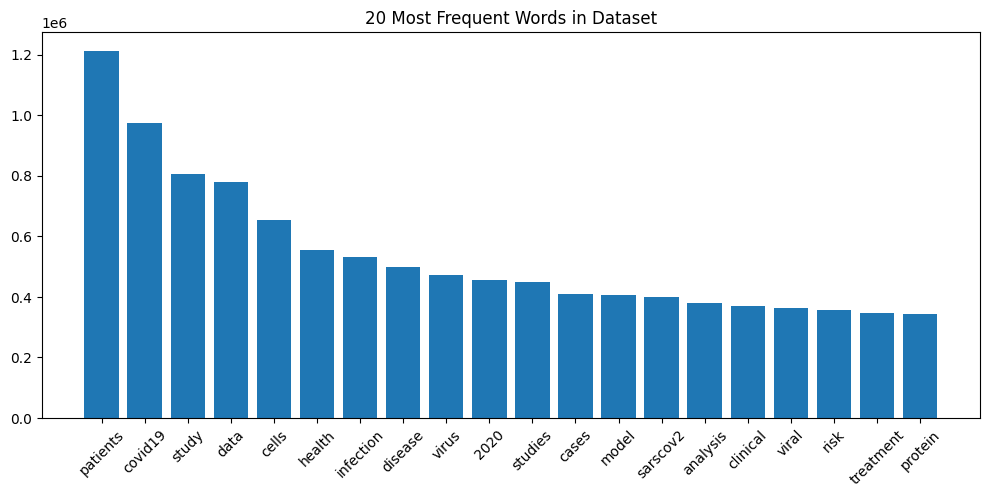

In [16]:
top_words = dict(list(sorted_counts.items())[:20])
plt.figure(figsize=(10, 5))
plt.bar(top_words.keys(), top_words.values())
plt.xticks(rotation=45)
plt.tight_layout()
plt.title("20 Most Frequent Words in Dataset")
plt.savefig("/dataNfs/wordcount_results/top20_words.png")
plt.show()

### 1.2 Benchmark

Computational tasks in a parallel environment require efficient use of cluster resources. The speed of execution can vary significantly depending on several parameters, such as the number of workers and the number of partitions. To better understand how the analysis is influenced by the cluster configuration, it is useful to implement a grid search.

In our case, we expect execution time to decrease when increasing the number of workers, provided that the number of partitions remains reasonable (too few or too many partitions may introduce overhead and reduce efficiency). For the experiment, we consider all combinations of **[1, 2, 3]** workers and **[10, 20, 50, 100, 200, 500]** partitions per bag.

Each run requires setting up a Dask cluster with different properties, so it is important to clearly specify the roles of the nodes in the `SSH_HOSTS` list. At the end of each run, the cluster must be closed to avoid errors and resource leaks.

When benchmarking, special care must be taken to avoid overload situations, particularly when running with only 1 worker and a very large number of files. For this reason, in such cases we use a smaller sample of 10k files, `all_files_bm`, defined at the start.

In [17]:
SSH_HOSTS = {
    "master": "10.67.22.102",
    "slave-1": "10.67.22.233",
    "slave-2": "10.67.22.118",
    "slave-3": "10.67.22.8"
}
# host list 
MASTER = ["master"]
SLAVES = ["slave-1", "slave-2","slave-3"]

In [18]:
# ---------- CONFIG INPUT ----------
OUTPUT_DIR = "/dataNfs/wordcount_results/benchmark_ssh_timeonly"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# grid parameters
N_WORKERS_LIST = [1, 2, 3]                    # number of workers
PARTITIONS_LIST = [10, 20, 50, 100, 200,500]     # n_partitions per bag

rows = []     # results storage
RAMs = []     # RAM storage

In [19]:
n_workers = 3
hosts = MASTER + SLAVES[:n_workers]
hosts

['master', 'slave-1', 'slave-2', 'slave-3']

In [20]:
# ---------- grid search ----------
for n_workers in N_WORKERS_LIST:
    for n_partitions in PARTITIONS_LIST:
        kill_dask_processes()
        time.sleep(3)
        print(f"\n=== RUN: n_workers={n_workers} | n_partitions={n_partitions} ===")

        # select first n_workers hosts between the slaves
        hosts = MASTER + SLAVES[:n_workers]

        cluster = SSHCluster(
            hosts,
            scheduler_options={"port": 8786, "dashboard_address": ":8899"},
            worker_options={"nthreads": 2, "nprocs": 2},
            connect_options={"known_hosts": None},
        )
        client = Client(cluster)

        bag = db.from_sequence(all_files_bm, npartitions=n_partitions)
        counters_bag = bag.map(load_json_file).map(extract_words)
        folded = counters_bag.fold(lambda x, y: x + y, initial=Counter())

        t0 = time.perf_counter()
        result = folded.compute()
        t1 = time.perf_counter()

        elapsed = t1 - t0
        print(f"Elapsed: {elapsed:.2f}s | unique words: {len(result)}")

        rows.append({
            "n_workers": n_workers,
            "n_partitions": n_partitions,
            "elapsed_s": elapsed,
            "unique_words": len(result),
        })

 


=== RUN: n_workers=1 | n_partitions=10 ===


2025-10-13 10:01:16,732 - distributed.deploy.ssh - INFO - 2025-10-13 10:01:16,731 - distributed.scheduler - INFO - State start
2025-10-13 10:01:16,739 - distributed.deploy.ssh - INFO - 2025-10-13 10:01:16,738 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 10:01:17,696 - distributed.deploy.ssh - INFO - 2025-10-13 10:01:17,697 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33881'
2025-10-13 10:01:17,699 - distributed.deploy.ssh - INFO - 2025-10-13 10:01:17,699 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33395'
2025-10-13 10:01:18,072 - distributed.deploy.ssh - INFO - 2025-10-13 10:01:18,071 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:45699
2025-10-13 10:01:18,072 - dis

Elapsed: 143.12s | unique words: 534132

=== RUN: n_workers=1 | n_partitions=20 ===


2025-10-13 10:03:45,692 - distributed.deploy.ssh - INFO - 2025-10-13 10:03:45,692 - distributed.scheduler - INFO - State start
2025-10-13 10:03:45,696 - distributed.deploy.ssh - INFO - 2025-10-13 10:03:45,696 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:03:46,649 - distributed.deploy.ssh - INFO - 2025-10-13 10:03:46,650 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36259'
2025-10-13 10:03:46,651 - distributed.deploy.ssh - INFO - 2025-10-13 10:03:46,653 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46513'
2025-10-13 10:03:47,030 - distributed.deploy.ssh - INFO - 2025-10-13 10:03:47,031 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:39783
2025-10-13 10:03:47,031 - distributed.deploy.ssh - INFO - 2025-10-13 10:03:47,031 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.233:39783
2025-10-13 10:03:47,031 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 95.32s | unique words: 534132

=== RUN: n_workers=1 | n_partitions=50 ===


2025-10-13 10:05:26,865 - distributed.deploy.ssh - INFO - 2025-10-13 10:05:26,865 - distributed.scheduler - INFO - State start
2025-10-13 10:05:26,869 - distributed.deploy.ssh - INFO - 2025-10-13 10:05:26,868 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:05:27,831 - distributed.deploy.ssh - INFO - 2025-10-13 10:05:27,833 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43789'
2025-10-13 10:05:27,833 - distributed.deploy.ssh - INFO - 2025-10-13 10:05:27,835 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46017'
2025-10-13 10:05:28,208 - distributed.deploy.ssh - INFO - 2025-10-13 10:05:28,209 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:34257
2025-10-13 10:05:28,208 - distributed.deploy.ssh - INFO - 2025-10-13 10:05:28,209 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.233:34257
2025-10-13 10:05:28,209 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 57.41s | unique words: 534132

=== RUN: n_workers=1 | n_partitions=100 ===


2025-10-13 10:06:30,122 - distributed.deploy.ssh - INFO - 2025-10-13 10:06:30,121 - distributed.scheduler - INFO - State start
2025-10-13 10:06:30,125 - distributed.deploy.ssh - INFO - 2025-10-13 10:06:30,125 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:06:31,114 - distributed.deploy.ssh - INFO - 2025-10-13 10:06:31,116 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37541'
2025-10-13 10:06:31,117 - distributed.deploy.ssh - INFO - 2025-10-13 10:06:31,119 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40473'
2025-10-13 10:06:31,502 - distributed.deploy.ssh - INFO - 2025-10-13 10:06:31,503 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:36505
2025-10-13 10:06:31,502 - distributed.deploy.ssh - INFO - 2025-10-13 10:06:31,503 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.233:36505
2025-10-13 10:06:31,503 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 50.67s | unique words: 534132

=== RUN: n_workers=1 | n_partitions=200 ===


2025-10-13 10:07:26,473 - distributed.deploy.ssh - INFO - 2025-10-13 10:07:26,473 - distributed.scheduler - INFO - State start
2025-10-13 10:07:26,477 - distributed.deploy.ssh - INFO - 2025-10-13 10:07:26,476 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:07:27,268 - distributed.deploy.ssh - INFO - 2025-10-13 10:07:27,270 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40275'
2025-10-13 10:07:27,271 - distributed.deploy.ssh - INFO - 2025-10-13 10:07:27,273 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40879'
2025-10-13 10:07:27,669 - distributed.deploy.ssh - INFO - 2025-10-13 10:07:27,671 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:36009
2025-10-13 10:07:27,671 - distributed.deploy.ssh - INFO - 2025-10-13 10:07:27,671 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.233:36009
2025-10-13 10:07:27,672 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 36.33s | unique words: 534132

=== RUN: n_workers=1 | n_partitions=500 ===


2025-10-13 10:08:08,565 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:08,564 - distributed.scheduler - INFO - State start
2025-10-13 10:08:08,568 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:08,568 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:08:09,543 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:09,545 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40603'
2025-10-13 10:08:09,545 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:09,548 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46555'
2025-10-13 10:08:09,914 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:09,916 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:46827
2025-10-13 10:08:09,915 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:09,916 - distributed.worker - INFO -          Listening to:   tcp://10.67.22.233:46827
2025-10-13 10:08:09,915 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 33.73s | unique words: 534132

=== RUN: n_workers=2 | n_partitions=10 ===


2025-10-13 10:08:47,930 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:47,929 - distributed.scheduler - INFO - State start
2025-10-13 10:08:47,934 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:47,933 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:08:48,893 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:48,895 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46363'
2025-10-13 10:08:48,896 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:48,898 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43175'
2025-10-13 10:08:49,140 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:49,137 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42749'
2025-10-13 10:08:49,143 - distributed.deploy.ssh - INFO - 2025-10-13 10:08:49,140 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37579'
2025-10-13 10:08:49,277 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 88.32s | unique words: 534132

=== RUN: n_workers=2 | n_partitions=20 ===


2025-10-13 10:10:22,350 - distributed.deploy.ssh - INFO - 2025-10-13 10:10:22,349 - distributed.scheduler - INFO - State start
2025-10-13 10:10:22,354 - distributed.deploy.ssh - INFO - 2025-10-13 10:10:22,354 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:10:23,593 - distributed.deploy.ssh - INFO - 2025-10-13 10:10:23,590 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36371'
2025-10-13 10:10:23,596 - distributed.deploy.ssh - INFO - 2025-10-13 10:10:23,593 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:32941'
2025-10-13 10:10:23,631 - distributed.deploy.ssh - INFO - 2025-10-13 10:10:23,634 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45927'
2025-10-13 10:10:23,634 - distributed.deploy.ssh - INFO - 2025-10-13 10:10:23,637 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34649'
2025-10-13 10:10:23,980 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 56.23s | unique words: 534132

=== RUN: n_workers=2 | n_partitions=50 ===


2025-10-13 10:11:24,781 - distributed.deploy.ssh - INFO - 2025-10-13 10:11:24,780 - distributed.scheduler - INFO - State start
2025-10-13 10:11:24,785 - distributed.deploy.ssh - INFO - 2025-10-13 10:11:24,784 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:11:25,984 - distributed.deploy.ssh - INFO - 2025-10-13 10:11:25,986 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36323'
2025-10-13 10:11:25,986 - distributed.deploy.ssh - INFO - 2025-10-13 10:11:25,989 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37809'
2025-10-13 10:11:26,007 - distributed.deploy.ssh - INFO - 2025-10-13 10:11:26,004 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45193'
2025-10-13 10:11:26,009 - distributed.deploy.ssh - INFO - 2025-10-13 10:11:26,007 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38789'
2025-10-13 10:11:26,363 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 31.81s | unique words: 534132

=== RUN: n_workers=2 | n_partitions=100 ===


2025-10-13 10:12:02,528 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:02,527 - distributed.scheduler - INFO - State start
2025-10-13 10:12:02,533 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:02,532 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:12:03,500 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:03,503 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37121'
2025-10-13 10:12:03,503 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:03,506 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41613'
2025-10-13 10:12:03,506 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:03,503 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38657'
2025-10-13 10:12:03,509 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:03,506 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34651'
2025-10-13 10:12:03,885 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 22.64s | unique words: 534132

=== RUN: n_workers=2 | n_partitions=200 ===


2025-10-13 10:12:31,075 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:31,075 - distributed.scheduler - INFO - State start
2025-10-13 10:12:31,079 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:31,079 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:12:32,287 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:32,290 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43555'
2025-10-13 10:12:32,289 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:32,292 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40967'
2025-10-13 10:12:32,294 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:32,291 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40219'
2025-10-13 10:12:32,296 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:32,294 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41335'
2025-10-13 10:12:32,665 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 18.18s | unique words: 534132

=== RUN: n_workers=2 | n_partitions=500 ===


2025-10-13 10:12:55,143 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:55,141 - distributed.scheduler - INFO - State start
2025-10-13 10:12:55,146 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:55,145 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:12:56,110 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:56,107 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33001'
2025-10-13 10:12:56,112 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:56,109 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36139'
2025-10-13 10:12:56,113 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:56,117 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33977'
2025-10-13 10:12:56,116 - distributed.deploy.ssh - INFO - 2025-10-13 10:12:56,119 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44151'
2025-10-13 10:12:56,490 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 16.35s | unique words: 534132

=== RUN: n_workers=3 | n_partitions=10 ===


2025-10-13 10:13:17,137 - distributed.deploy.ssh - INFO - 2025-10-13 10:13:17,136 - distributed.scheduler - INFO - State start
2025-10-13 10:13:17,141 - distributed.deploy.ssh - INFO - 2025-10-13 10:13:17,140 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:13:18,339 - distributed.deploy.ssh - INFO - 2025-10-13 10:13:18,342 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42455'
2025-10-13 10:13:18,341 - distributed.deploy.ssh - INFO - 2025-10-13 10:13:18,344 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41845'
2025-10-13 10:13:18,349 - distributed.deploy.ssh - INFO - 2025-10-13 10:13:18,346 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36531'
2025-10-13 10:13:18,351 - distributed.deploy.ssh - INFO - 2025-10-13 10:13:18,349 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38299'
2025-10-13 10:13:18,638 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 60.63s | unique words: 534132

=== RUN: n_workers=3 | n_partitions=20 ===


2025-10-13 10:14:24,229 - distributed.deploy.ssh - INFO - 2025-10-13 10:14:24,229 - distributed.scheduler - INFO - State start
2025-10-13 10:14:24,233 - distributed.deploy.ssh - INFO - 2025-10-13 10:14:24,232 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:14:25,648 - distributed.deploy.ssh - INFO - 2025-10-13 10:14:25,651 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38411'
2025-10-13 10:14:25,650 - distributed.deploy.ssh - INFO - 2025-10-13 10:14:25,654 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42551'
2025-10-13 10:14:25,659 - distributed.deploy.ssh - INFO - 2025-10-13 10:14:25,660 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38555'
2025-10-13 10:14:25,661 - distributed.deploy.ssh - INFO - 2025-10-13 10:14:25,662 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45369'
2025-10-13 10:14:25,675 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 41.98s | unique words: 534132

=== RUN: n_workers=3 | n_partitions=50 ===


2025-10-13 10:15:12,319 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:12,318 - distributed.scheduler - INFO - State start
2025-10-13 10:15:12,323 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:12,322 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:15:13,745 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:13,748 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41847'
2025-10-13 10:15:13,747 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:13,751 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34301'
2025-10-13 10:15:13,757 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:13,757 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34437'
2025-10-13 10:15:13,760 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:13,760 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35501'
2025-10-13 10:15:13,784 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 23.58s | unique words: 534132

=== RUN: n_workers=3 | n_partitions=100 ===


2025-10-13 10:15:42,305 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:42,304 - distributed.scheduler - INFO - State start
2025-10-13 10:15:42,309 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:42,308 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:15:43,743 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:43,743 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45507'
2025-10-13 10:15:43,745 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:43,746 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38485'
2025-10-13 10:15:43,804 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:43,801 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:35737'
2025-10-13 10:15:43,806 - distributed.deploy.ssh - INFO - 2025-10-13 10:15:43,804 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39557'
2025-10-13 10:15:43,852 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 17.04s | unique words: 534132

=== RUN: n_workers=3 | n_partitions=200 ===


2025-10-13 10:16:05,543 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:05,542 - distributed.scheduler - INFO - State start
2025-10-13 10:16:05,547 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:05,546 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:16:06,744 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:06,748 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46115'
2025-10-13 10:16:06,745 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:06,745 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39799'
2025-10-13 10:16:06,747 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:06,750 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45119'
2025-10-13 10:16:06,747 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:06,748 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34821'
2025-10-13 10:16:06,779 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 13.77s | unique words: 534132

=== RUN: n_workers=3 | n_partitions=500 ===


2025-10-13 10:16:25,237 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:25,237 - distributed.scheduler - INFO - State start
2025-10-13 10:16:25,241 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:25,240 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:16:26,445 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:26,446 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39229'
2025-10-13 10:16:26,447 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:26,448 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46821'
2025-10-13 10:16:26,458 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:26,456 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44275'
2025-10-13 10:16:26,461 - distributed.deploy.ssh - INFO - 2025-10-13 10:16:26,459 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40765'
2025-10-13 10:16:26,501 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 13.06s | unique words: 534132


2025-10-13 11:24:09,821 - distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client


In [21]:
# ---------- save results ----------
df = pd.DataFrame(rows)
csv_path = os.path.join(OUTPUT_DIR, "benchmark_ssh_timeonly.csv")
df.to_csv(csv_path, index=False)
print("\nSaved results to:", csv_path)
print("\n")
df


Saved results to: /dataNfs/wordcount_results/benchmark_ssh_timeonly/benchmark_ssh_timeonly.csv




,n_workers,n_partitions,elapsed_s,unique_words
0,1,10,143.124521,534132
1,1,20,95.318310,534132
2,1,50,57.412235,534132
3,1,100,50.668057,534132
4,1,200,36.330516,534132
5,1,500,33.732100,534132
6,2,10,88.319691,534132
7,2,20,56.225168,534132
8,2,50,31.808070,534132
9,2,100,22.638070,534132


Saved plot: /dataNfs/wordcount_results/benchmark_ssh_timeonly/elapsed_vs_partitions_ssh_timeonly.png




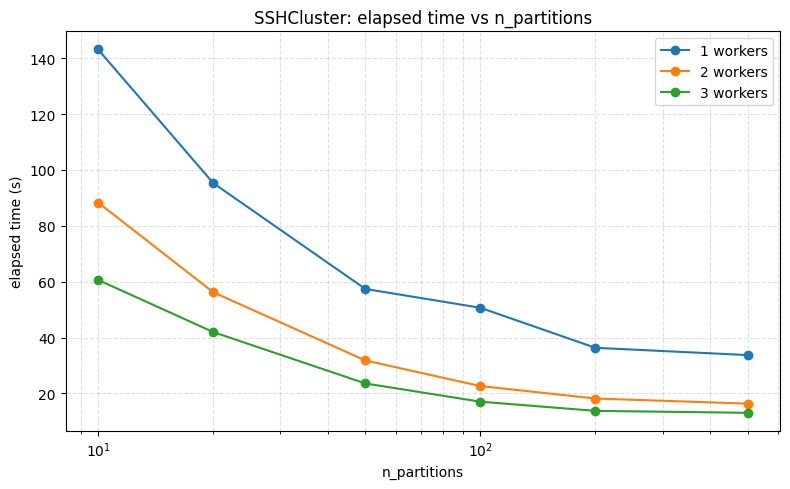

In [22]:
# ---------- plot ----------
plt.figure(figsize=(8,5))
for n in sorted(df["n_workers"].unique()):
    sub = df[df["n_workers"]==n].sort_values("n_partitions")
    plt.plot(sub["n_partitions"], sub["elapsed_s"], marker="o", label=f"{n} workers")
plt.xscale("log")
plt.xlabel("n_partitions")
plt.ylabel("elapsed time (s)")
plt.title("SSHCluster: elapsed time vs n_partitions")
plt.legend()
plt.grid(True, which="both", ls="--", alpha=0.4)
plt.tight_layout()
png_path = os.path.join(OUTPUT_DIR, "elapsed_vs_partitions_ssh_timeonly.png")
plt.savefig(png_path)

print("Saved plot:", png_path)
print("\n")

plt.show()


As expected, clusters become progressively faster when increasing both the number of workers and the number of partitions.

However, we also expect that each cluster configuration reaches an optimal point (the minimum execution time), after which performance may degrade due to the overhead introduced by task scheduling and communication between workers.

### Benchmark with full size dataset

The previous benchmark is crucial to observe the decrease in execution time as the number of workers increases. It also makes clear that the number of partitions plays an important role.
However, we cannot fully rely on these results, because the dataset used was too small compared to the one intended for the actual analysis. We also know that the elapsed time can be influenced by the number of partitions in different ways depending on the dataset size.

For this reason, we consider it reasonable to perform another benchmark using the full dataset of 100k files. In this case, we will vary the number of partitions while keeping the cluster configuration fixed at 3 workers, which we identified earlier as the optimal choice.


In [23]:
n_partitions_test = [200,500,1000,1500,2000,5000,7000,10000,20000,50000,60000]
result_test = []
RAMs_test = []
rows_test = []
# ---------- grid search ----------
for n_partitions in n_partitions_test:
    kill_dask_processes()
    time.sleep(3)
    print(f"\n=== RUN: n_workers= {3} | n_partitions={n_partitions} ===")

    hosts = MASTER + SLAVES

    cluster = SSHCluster(
        hosts,
        scheduler_options={"port": 8786 , "dashboard_address": ":8899"},
        worker_options={"nthreads": 2, "nprocs": 2},
        connect_options={"known_hosts": None},
        )
    client = Client(cluster)
   
    bag = db.from_sequence(all_files, npartitions=n_partitions)
    counters_bag = bag.map(load_json_file).map(extract_words)
    folded = counters_bag.fold(lambda x, y: x + y, initial=Counter())

    t0 = time.perf_counter()
    result_test = folded.compute()
    t1 = time.perf_counter()

    # RAM 
    RAMs_test.append(process.memory_info().rss / 1e6)

    elapsed = t1 - t0
    print(f"Elapsed: {elapsed:.2f}s ")

    rows_test.append({
        "n_partitions": n_partitions,
        "elapsed_s": elapsed,
        #"unique_words": len(result),
    })


=== RUN: n_workers= 3 | n_partitions=200 ===


2025-10-13 10:20:06,449 - distributed.deploy.ssh - INFO - 2025-10-13 10:20:06,449 - distributed.scheduler - INFO - State start
2025-10-13 10:20:06,453 - distributed.deploy.ssh - INFO - 2025-10-13 10:20:06,452 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 10:20:07,879 - distributed.deploy.ssh - INFO - 2025-10-13 10:20:07,880 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42603'
2025-10-13 10:20:07,881 - distributed.deploy.ssh - INFO - 2025-10-13 10:20:07,883 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45947'
2025-10-13 10:20:07,890 - distributed.deploy.ssh - INFO - 2025-10-13 10:20:07,889 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41839'
2025-10-13 10:20:07,893 - distrib

Elapsed: 385.01s 

=== RUN: n_workers= 3 | n_partitions=500 ===


2025-10-13 10:26:37,896 - distributed.deploy.ssh - INFO - 2025-10-13 10:26:37,895 - distributed.scheduler - INFO - State start
2025-10-13 10:26:37,899 - distributed.deploy.ssh - INFO - 2025-10-13 10:26:37,898 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:26:39,321 - distributed.deploy.ssh - INFO - 2025-10-13 10:26:39,324 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38367'
2025-10-13 10:26:39,323 - distributed.deploy.ssh - INFO - 2025-10-13 10:26:39,326 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36677'
2025-10-13 10:26:39,333 - distributed.deploy.ssh - INFO - 2025-10-13 10:26:39,334 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44621'
2025-10-13 10:26:39,336 - distributed.deploy.ssh - INFO - 2025-10-13 10:26:39,336 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44725'
2025-10-13 10:26:39,378 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 274.95s 

=== RUN: n_workers= 3 | n_partitions=1000 ===


2025-10-13 10:31:19,524 - distributed.deploy.ssh - INFO - 2025-10-13 10:31:19,524 - distributed.scheduler - INFO - State start
2025-10-13 10:31:19,528 - distributed.deploy.ssh - INFO - 2025-10-13 10:31:19,528 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:31:20,966 - distributed.deploy.ssh - INFO - 2025-10-13 10:31:20,967 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37755'
2025-10-13 10:31:20,968 - distributed.deploy.ssh - INFO - 2025-10-13 10:31:20,970 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42955'
2025-10-13 10:31:20,970 - distributed.deploy.ssh - INFO - 2025-10-13 10:31:20,974 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36037'
2025-10-13 10:31:20,973 - distributed.deploy.ssh - INFO - 2025-10-13 10:31:20,976 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33399'
2025-10-13 10:31:20,999 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 237.93s 

=== RUN: n_workers= 3 | n_partitions=1500 ===


2025-10-13 10:35:23,572 - distributed.deploy.ssh - INFO - 2025-10-13 10:35:23,572 - distributed.scheduler - INFO - State start
2025-10-13 10:35:23,575 - distributed.deploy.ssh - INFO - 2025-10-13 10:35:23,575 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:35:25,010 - distributed.deploy.ssh - INFO - 2025-10-13 10:35:25,013 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:32969'
2025-10-13 10:35:25,012 - distributed.deploy.ssh - INFO - 2025-10-13 10:35:25,016 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34425'
2025-10-13 10:35:25,020 - distributed.deploy.ssh - INFO - 2025-10-13 10:35:25,023 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43805'
2025-10-13 10:35:25,023 - distributed.deploy.ssh - INFO - 2025-10-13 10:35:25,025 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40265'
2025-10-13 10:35:25,024 - distributed.deploy.ssh - INFO - 2025-10-13

Elapsed: 215.41s 

=== RUN: n_workers= 3 | n_partitions=2000 ===


2025-10-13 10:39:05,163 - distributed.deploy.ssh - INFO - 2025-10-13 10:39:05,163 - distributed.scheduler - INFO - State start
2025-10-13 10:39:05,166 - distributed.deploy.ssh - INFO - 2025-10-13 10:39:05,166 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:39:06,604 - distributed.deploy.ssh - INFO - 2025-10-13 10:39:06,606 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33249'
2025-10-13 10:39:06,606 - distributed.deploy.ssh - INFO - 2025-10-13 10:39:06,609 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39253'
2025-10-13 10:39:06,618 - distributed.deploy.ssh - INFO - 2025-10-13 10:39:06,620 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46865'
2025-10-13 10:39:06,620 - distributed.deploy.ssh - INFO - 2025-10-13 10:39:06,622 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35047'
2025-10-13 10:39:06,627 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 198.62s 

=== RUN: n_workers= 3 | n_partitions=5000 ===


2025-10-13 10:42:30,379 - distributed.deploy.ssh - INFO - 2025-10-13 10:42:30,379 - distributed.scheduler - INFO - State start
2025-10-13 10:42:30,384 - distributed.deploy.ssh - INFO - 2025-10-13 10:42:30,384 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:42:31,865 - distributed.deploy.ssh - INFO - 2025-10-13 10:42:31,866 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43077'
2025-10-13 10:42:31,868 - distributed.deploy.ssh - INFO - 2025-10-13 10:42:31,869 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45727'
2025-10-13 10:42:31,868 - distributed.deploy.ssh - INFO - 2025-10-13 10:42:31,869 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39549'
2025-10-13 10:42:31,870 - distributed.deploy.ssh - INFO - 2025-10-13 10:42:31,872 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41281'
2025-10-13 10:42:31,880 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 185.31s 

=== RUN: n_workers= 3 | n_partitions=7000 ===


2025-10-13 10:45:42,056 - distributed.deploy.ssh - INFO - 2025-10-13 10:45:42,055 - distributed.scheduler - INFO - State start
2025-10-13 10:45:42,063 - distributed.deploy.ssh - INFO - 2025-10-13 10:45:42,062 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:45:43,499 - distributed.deploy.ssh - INFO - 2025-10-13 10:45:43,500 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39455'
2025-10-13 10:45:43,502 - distributed.deploy.ssh - INFO - 2025-10-13 10:45:43,503 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33141'
2025-10-13 10:45:43,505 - distributed.deploy.ssh - INFO - 2025-10-13 10:45:43,506 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37467'
2025-10-13 10:45:43,507 - distributed.deploy.ssh - INFO - 2025-10-13 10:45:43,508 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38039'
2025-10-13 10:45:43,538 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 174.07s 

=== RUN: n_workers= 3 | n_partitions=10000 ===


2025-10-13 10:48:42,698 - distributed.deploy.ssh - INFO - 2025-10-13 10:48:42,697 - distributed.scheduler - INFO - State start
2025-10-13 10:48:42,702 - distributed.deploy.ssh - INFO - 2025-10-13 10:48:42,701 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:48:44,143 - distributed.deploy.ssh - INFO - 2025-10-13 10:48:44,143 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41053'
2025-10-13 10:48:44,145 - distributed.deploy.ssh - INFO - 2025-10-13 10:48:44,146 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43237'
2025-10-13 10:48:44,146 - distributed.deploy.ssh - INFO - 2025-10-13 10:48:44,146 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44997'
2025-10-13 10:48:44,148 - distributed.deploy.ssh - INFO - 2025-10-13 10:48:44,148 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40671'
2025-10-13 10:48:44,152 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 176.12s 

=== RUN: n_workers= 3 | n_partitions=20000 ===


2025-10-13 10:51:45,364 - distributed.deploy.ssh - INFO - 2025-10-13 10:51:45,364 - distributed.scheduler - INFO - State start
2025-10-13 10:51:45,368 - distributed.deploy.ssh - INFO - 2025-10-13 10:51:45,368 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:51:46,805 - distributed.deploy.ssh - INFO - 2025-10-13 10:51:46,806 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37205'
2025-10-13 10:51:46,807 - distributed.deploy.ssh - INFO - 2025-10-13 10:51:46,808 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34661'
2025-10-13 10:51:46,809 - distributed.deploy.ssh - INFO - 2025-10-13 10:51:46,809 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42061'
2025-10-13 10:51:46,809 - distributed.deploy.ssh - INFO - 2025-10-13 10:51:46,809 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34735'
2025-10-13 10:51:46,811 - distributed.deploy.ssh - INFO - 2025-10-13 1

Elapsed: 186.27s 

=== RUN: n_workers= 3 | n_partitions=50000 ===


2025-10-13 10:54:58,483 - distributed.deploy.ssh - INFO - 2025-10-13 10:54:58,483 - distributed.scheduler - INFO - State start
2025-10-13 10:54:58,487 - distributed.deploy.ssh - INFO - 2025-10-13 10:54:58,487 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:54:59,946 - distributed.deploy.ssh - INFO - 2025-10-13 10:54:59,946 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33279'
2025-10-13 10:54:59,949 - distributed.deploy.ssh - INFO - 2025-10-13 10:54:59,948 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44967'
2025-10-13 10:54:59,950 - distributed.deploy.ssh - INFO - 2025-10-13 10:54:59,951 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44069'
2025-10-13 10:54:59,953 - distributed.deploy.ssh - INFO - 2025-10-13 10:54:59,953 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33429'
2025-10-13 10:54:59,962 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 224.47s 

=== RUN: n_workers= 3 | n_partitions=60000 ===


2025-10-13 10:58:50,032 - distributed.deploy.ssh - INFO - 2025-10-13 10:58:50,031 - distributed.scheduler - INFO - State start
2025-10-13 10:58:50,036 - distributed.deploy.ssh - INFO - 2025-10-13 10:58:50,036 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 10:58:51,485 - distributed.deploy.ssh - INFO - 2025-10-13 10:58:51,485 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44115'
2025-10-13 10:58:51,488 - distributed.deploy.ssh - INFO - 2025-10-13 10:58:51,487 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33323'
2025-10-13 10:58:51,500 - distributed.deploy.ssh - INFO - 2025-10-13 10:58:51,501 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35463'
2025-10-13 10:58:51,503 - distributed.deploy.ssh - INFO - 2025-10-13 10:58:51,504 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35029'
2025-10-13 10:58:51,521 - distributed.deploy.ssh - INFO - 2025-10-13 10:

Elapsed: 304.84s 


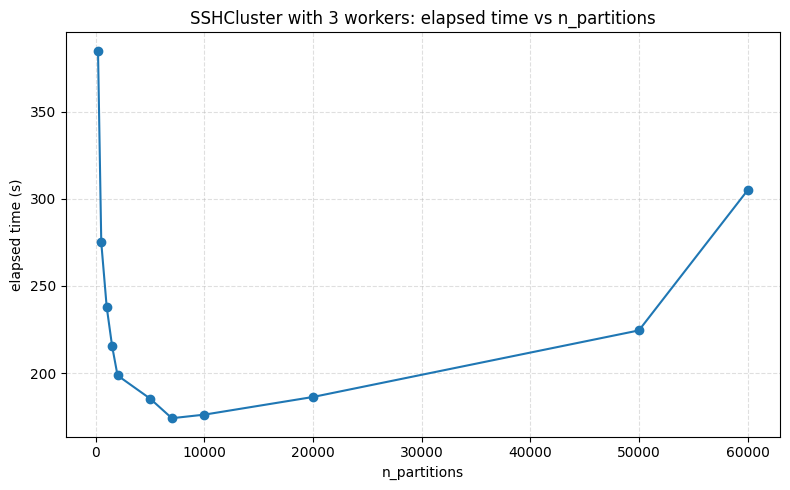

In [24]:
df_test = pd.DataFrame(rows_test)
 # ---------- plot ----------
plt.figure(figsize=(8,5))
plt.plot(df_test["n_partitions"], df_test["elapsed_s"], marker="o")
plt.xlabel("n_partitions")
plt.ylabel("elapsed time (s)")
plt.title("SSHCluster with 3 workers: elapsed time vs n_partitions")
plt.grid(True, which="both", ls="--", alpha=0.4)
plt.tight_layout()
plt.show()

The benchmark clearly shows that the execution time strongly depends on the number of partitions.

* With too few partitions, execution is slow due to poor load balancing across workers.
* The best performance is reached between **5k and 10k partitions**, where execution time stabilizes around 160–180s.
* Increasing partitions beyond this point leads to higher overhead in scheduling and communication, which increases the total execution time.

Overall, the optimal trade-off for the 3-worker cluster lies in the 5k–10k partition range. We choose to work with **7000** partitions, as it seems reasonable to us from this considerations.

Although 7000 partitions might seem a large number — given that with a dataset of 100k files, this means roughly 15 files per partition, or about 7.5 MB of data each (assuming 0.5 MB per file) — this actually matches well with Dask’s preferred workload granularity.

Smaller partitions allow Dask to:

- Keep all worker cores busy,

- Recover more efficiently from stragglers (slow tasks)

- Pipeline computations more effectively in memory.

Thus, 7000 partitions are faster because they provide the right level of parallelism without overloading the scheduler, making computation both well-distributed and still lightweight to manage.

#### 1.1.2 RAM Usage

For the full dataset benchmark, at each run we computed also the RAM usage.

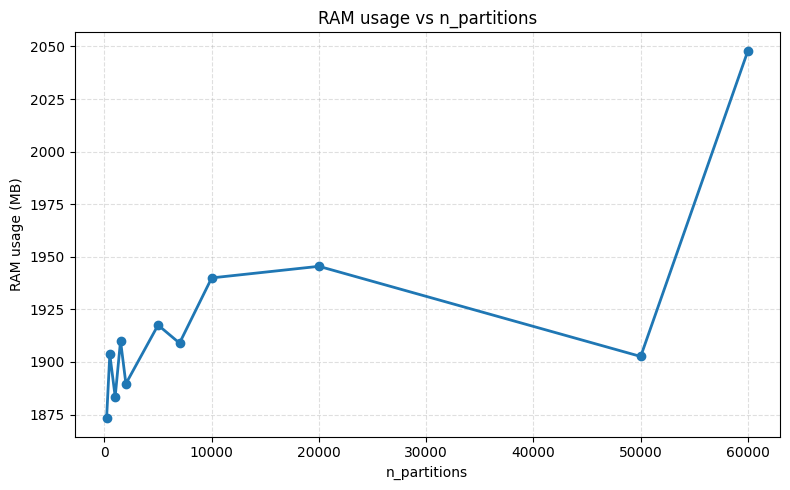

In [25]:
plt.figure(figsize=(8,5))
plt.plot(n_partitions_test, RAMs_test, marker='o', linestyle='-', linewidth=2)
plt.title("RAM usage vs n_partitions")
plt.xlabel("n_partitions")
plt.ylabel("RAM usage (MB)")
plt.grid(True, which="both", ls="--", alpha=0.4)
plt.tight_layout()
plt.show()


This plot shows **RAM usage vs. the number of partitions** for the full-dataset benchmark.

RAM consumption remains mostly stable between ~1.8 GB and 1.9 GB up to around 20k partitions, indicating efficient task distribution and balanced memory usage.
Beyond this range, particularly past 50k partitions, RAM usage increases sharply — a clear sign of scheduler and graph overhead from managing too many small tasks.

Overall, this confirms that the configuration around 7000 partitions provides the best trade-off between memory efficiency and parallelism.

### 1.3 Cluster restart

At the end of the benchmark, we must close and restart the whole cluster

In [9]:
kill_dask_processes()

In [10]:
cluster = SSHCluster(
    ["master", "slave-1", "slave-2", "slave-3"],
    connect_options={"known_hosts": None},
    worker_options={"nprocs": 2, "nthreads": 2},  # options for workers
    scheduler_options={"port": 8786, "dashboard_address": ":8899"} 
)

client = Client(cluster)


2025-10-14 09:19:47,200 - distributed.deploy.ssh - INFO - 2025-10-14 09:19:47,200 - distributed.scheduler - INFO - State start
2025-10-14 09:19:47,203 - distributed.deploy.ssh - INFO - 2025-10-14 09:19:47,203 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:19:48,619 - distributed.deploy.ssh - INFO - 2025-10-14 09:19:48,626 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46753'
2025-10-14 09:19:48,621 - distributed.deploy.ssh - INFO - 2025-10-14 09:19:48,624 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46093'
2025-10-14 09:19:48,621 - distributed.deploy.ssh - INFO - 2025-10-14 09:19:48,628 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34889'
2025-10-14 09:19:48,623 - distr

## Assignment 2

### 2.1 Country Representation

The second task of the project is to extract statistics about the countries and institutions affiliated with the authors of the papers, in order to identify which countries and institutions have been the most (and least) influential in COVID research.

To achieve this, we need to focus on the "authors" key of each JSON file, where affiliations can be found under the sub-key "affiliations". We are asked to organize the data into a Dask DataFrame, which will eventually contain the following columns: `article_id`, `institution`, and `country`.

Let's start by examining the structure of the key of interest, `authors`.

In [11]:
# Taking random json file

directory = "/dataNfs/document_parses/pdf_json"

all_files =  [
    os.path.join(directory, f)
    for f in os.listdir(directory)
    if os.path.isfile(os.path.join(directory, f))
]  

idx = np.random.choice(len(all_files), size = n_sample, replace=False)
all_files = [all_files[i] for i in idx]  

random_file = random.choice(all_files)
with open(random_file, "r", encoding="utf-8") as f:
    data = json.load(f)

# Extract affiliations
authors = data.get("metadata", {}).get("authors", [])
affiliations = []

for author in authors:
    name = author.get("last", '')
    aff = author.get("affiliation", {})
    institution = aff.get("institution", "")
    country = aff.get("location", {}).get("country", "")
    if institution or name or country:
        affiliations.append((name, institution, country.strip()))

print(f"Example of an article affiliations' authors:{affiliations}")
print(f"\n Total number of files: {len(all_files)}")

Example of an article affiliations' authors:[('Verine Boulon', 'University of Dundee', 'UK'), ('Westman', 'University of Dundee', 'UK'), ('Hutten', 'University of Dundee', 'UK'), ('Boisvert', 'University of Dundee', 'UK'), ('Lamond', 'University of Dundee', 'UK')]

 Total number of files: 100000


We can immediately see that multiple authors can be associated to a single paper. 
Furthermore, the countries and institutes have to be "cleaned" and filtered, similar to what we have previously done with the word counts; otherwise, for example, countries labeled as "RUSSIA" and "RUSSIAN FEDERATION" will be considered as different, and we don't want that.

The following function filters the relevant informations from the whole dictionary.

In [12]:
def extract_country_inst(file):
    records = []
    
    with open(file, "r", encoding="utf-8") as f:
        data = json.load(f)

    article_id = data.get("paper_id")
    authors = data.get("metadata", {}).get("authors", [])

    for author in authors:
        #name = author.get("last", '')
        aff = author.get("affiliation", {})
        institution = aff.get("institution", "")
        country = aff.get("location", {}).get("country", "")
        
        if institution or country:
            records.append((article_id, institution, country.strip()))
    return records


In [13]:
import pycountry  # official country list

# Cleaning function
# -----------------------------
# official country list 
official_countries = {c.name.upper() for c in pycountry.countries}
country_aliases = {
    "U.S.": "USA",
    "U.S.A": "USA",
    "USA" : "USA",
    "US": "USA",
    "Usa" : "USA",
    "United States of America" : "USA",
    "United States" : "USA",
    "UNITED STATES" : "USA",
    "UK": "UNITED KINGDOM",
    "Great Britain": "UNITED KINGDOM",
    "great britain": "UNITED KINGDOM",
    "italia" : "ITALY",
    "Italia" : "ITALY",
    "U.K.": "UNITED KINGDOM",
    "KOREA, SOUTH": "SOUTH KOREA",
    "IRAN, ISLAMIC REPUBLIC OF": "IRAN",
    "RUSSIA": "RUSSIAN FEDERATION",
    "australia":"AUSTRALIA",
    'España': 'SPAIN'
    
}

def clean_country(country_raw):

    if not country_raw:
        return None
    # Remove strange characters
    country = re.sub(r"[^A-Za-z\s]", "", country_raw)
    country = re.sub(r"\s+", " ", country)
    country = country.strip().upper()
    # apply aliases
    if country in country_aliases:
        return country_aliases[country]
    # verify if it exists in the official list
    return country if country in official_countries else None

def clean_institution(inst_raw:str) -> str | None:
    if not inst_raw:
        return None
    
    inst = re.sub(r"[^A-Za-z0-9\s]", "", inst_raw) 
    inst = re.sub(r"\s+", " ", inst)
    
    return inst.strip().upper()


Now, let's create the Dask dataframe.  
As already stated, we chose to run the following cluster configuration, estimated *a posteriori* from the benchmark:

- `Number of workers:`  3  
- `Partitions:` 1500


In [14]:
%%time
npartitions = 1500
data_df = (db.from_sequence(all_files, npartitions)
            .map(extract_country_inst)
            .flatten()
            .to_dataframe(columns=["article_id","institution", "country"])
          )

print("\n",data_df.head(10).to_markdown(index = False),"\n")


 | article_id                               | institution                    | country   |
|:-----------------------------------------|:-------------------------------|:----------|
| a2481a47e9f2a4ce0cf4e753aa86978768d4161d | Universiti Kebangsaan Malaysia | Malaysia  |
| a2481a47e9f2a4ce0cf4e753aa86978768d4161d | Universiti Kebangsaan Malaysia | Malaysia  |
| a2481a47e9f2a4ce0cf4e753aa86978768d4161d | Universiti Kebangsaan Malaysia | Malaysia  |
| a2481a47e9f2a4ce0cf4e753aa86978768d4161d | Universiti Kebangsaan Malaysia | Malaysia  |
| a2481a47e9f2a4ce0cf4e753aa86978768d4161d | Universiti Kebangsaan Malaysia | Malaysia  |
| a2481a47e9f2a4ce0cf4e753aa86978768d4161d | Universiti                     | Malaysia  |
| a2481a47e9f2a4ce0cf4e753aa86978768d4161d | Universiti Kebangsaan Malaysia | Malaysia  |
| fd4fcb1918d1377ac8060224c41be5a6d3378add | Zhengzhou University           | China     |
| fd4fcb1918d1377ac8060224c41be5a6d3378add | Zhengzhou University           | China     |
| fd4fcb

After data cleaning and filtering:

In [15]:
# To better visualize results:

pd.set_option("display.max_columns", None)   # show all columns
pd.set_option("display.max_rows", 20)        
pd.set_option("display.width", 1000)        

In [16]:
%%time
# dataset cleaning and filtering
import dask

data_ddf = (
    db.from_sequence(all_files, npartitions=npartitions)
      .map(extract_country_inst)
      .flatten()
      .to_dataframe(columns=["article_id", "institution", "country"])
      .map_partitions(
          lambda df: df.assign(
              country=df["country"].apply(clean_country),
              institution=df["institution"].apply(clean_institution),
          )
      )
)

print(data_ddf.head(10))

n_rows = data_ddf.shape[0].compute()  
nunique_country = data_ddf["country"].nunique()
nunique_institution = data_ddf["institution"].nunique()

# Compute (just once)
res_country, res_institution = dask.compute(nunique_country, nunique_institution)

# Print
print(f"\nNumber of rows: {n_rows:,}")
print(f"Unique countries: {res_country}")
print(f"Unique institutions: {res_institution}\n")


                                 article_id                     institution   country
0  a2481a47e9f2a4ce0cf4e753aa86978768d4161d  UNIVERSITI KEBANGSAAN MALAYSIA  MALAYSIA
1  a2481a47e9f2a4ce0cf4e753aa86978768d4161d  UNIVERSITI KEBANGSAAN MALAYSIA  MALAYSIA
2  a2481a47e9f2a4ce0cf4e753aa86978768d4161d  UNIVERSITI KEBANGSAAN MALAYSIA  MALAYSIA
3  a2481a47e9f2a4ce0cf4e753aa86978768d4161d  UNIVERSITI KEBANGSAAN MALAYSIA  MALAYSIA
4  a2481a47e9f2a4ce0cf4e753aa86978768d4161d  UNIVERSITI KEBANGSAAN MALAYSIA  MALAYSIA
5  a2481a47e9f2a4ce0cf4e753aa86978768d4161d                      UNIVERSITI  MALAYSIA
6  a2481a47e9f2a4ce0cf4e753aa86978768d4161d  UNIVERSITI KEBANGSAAN MALAYSIA  MALAYSIA
7  fd4fcb1918d1377ac8060224c41be5a6d3378add            ZHENGZHOU UNIVERSITY     CHINA
8  fd4fcb1918d1377ac8060224c41be5a6d3378add            ZHENGZHOU UNIVERSITY     CHINA
9  fd4fcb1918d1377ac8060224c41be5a6d3378add            ZHENGZHOU UNIVERSITY     CHINA

Number of rows: 385,552
Unique countries: 159
Unique 

Now we use the group-by function of Dask dataframe to count the country and institute contributions

In [17]:
%%time
country_counts = (
    data_ddf.groupby("country")
      .article_id.count()
      .compute()
      .sort_values(ascending=False)
)

# .. to DataFrame
country_df = country_counts.reset_index()
country_df.columns = ["country", "count"]

print("\nMost active countries:")
display(country_df.head(10))   

print("\n Least active countries:")
display(country_df.tail(10))



Most active countries:


,country,count
0,USA,57191
1,CHINA,36268
2,ITALY,26054
3,UNITED KINGDOM,22713
4,GERMANY,11517
5,FRANCE,11443
6,SPAIN,10720
7,CANADA,9559
8,INDIA,8587
9,JAPAN,7692



 Least active countries:


,country,count
149,CENTRAL AFRICAN REPUBLIC,1
150,SOUTH SUDAN,1
151,KYRGYZSTAN,1
152,PUERTO RICO,1
153,LESOTHO,1
154,ERITREA,1
155,SOLOMON ISLANDS,1
156,BRUNEI DARUSSALAM,1
157,BELIZE,1
158,CHAD,1


CPU times: user 596 ms, sys: 72.3 ms, total: 668 ms
Wall time: 2min 23s


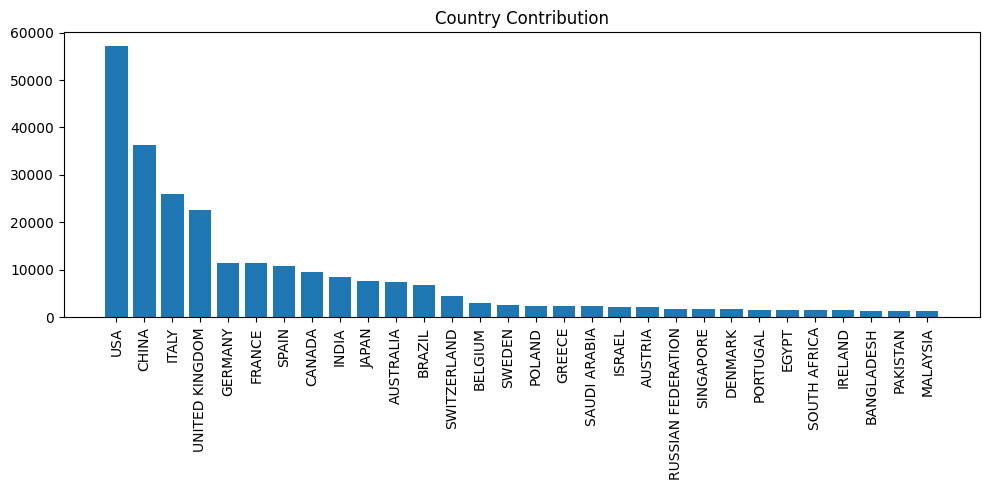

In [18]:
top_words = dict(list(country_counts.items())[:30])
plt.figure(figsize=(10, 5))
plt.bar(top_words.keys(), top_words.values())
plt.xticks(rotation=90)
plt.title("Country Contribution")
plt.tight_layout()
plt.savefig("/dataNfs/wordcount_results/top20_countries.png")
plt.show()

Same analysis for the institute contributions

In [19]:
inst_counts = (
    data_ddf.groupby("institution")
      .article_id.count()
      .compute()
      .sort_values(ascending=False)
)

inst_df = inst_counts.reset_index()
inst_df.columns = ["institution", "count"]

# Show first and last 10
print("\nMost active institutes:")
display(inst_df.head(10))   

print("\n Less active institutes:")
display(inst_df.tail(10))


Most active institutes:


,institution,count
0,UNIVERSITY OF CALIFORNIA,3349
1,HUAZHONG UNIVERSITY OF SCIENCE AND TECHNOLOGY,2553
2,CHINESE ACADEMY OF SCIENCES,2257
3,UNIVERSITY OF OXFORD,1778
4,HARVARD MEDICAL SCHOOL,1729
5,IMPERIAL COLLEGE LONDON,1603
6,NATIONAL INSTITUTES OF HEALTH,1564
7,UNIVERSITY OF WASHINGTON,1543
8,THE UNIVERSITY OF HONG KONG,1376
9,MAYO CLINIC,1301



 Less active institutes:


,institution,count
38290,BIOVO ANIMAL HEALTH LTD,1
38291,HUNAN INSTITUTE OF MICROBIOLOGY TESTING CENTER,1
38292,BJRKNES UNIVERSITY COLLEGE,1
38293,PIAZZA DEL VIMINALE,1
38294,NASARAWA STATE POLYTECHNIC,1
38295,KAROLINSKA INSTITUTE AT KAROLINSKA UNIVERSITY ...,1
38296,RESERACH UNIT EPIDERME,1
38297,USGS ASTROGEOLOGY SCIENCE CENTER,1
38298,FEDERAL UNIVERSITY OF AMAZONAS UFAM,1
38299,WEILL CORNELL MEDICINE MASUD,1


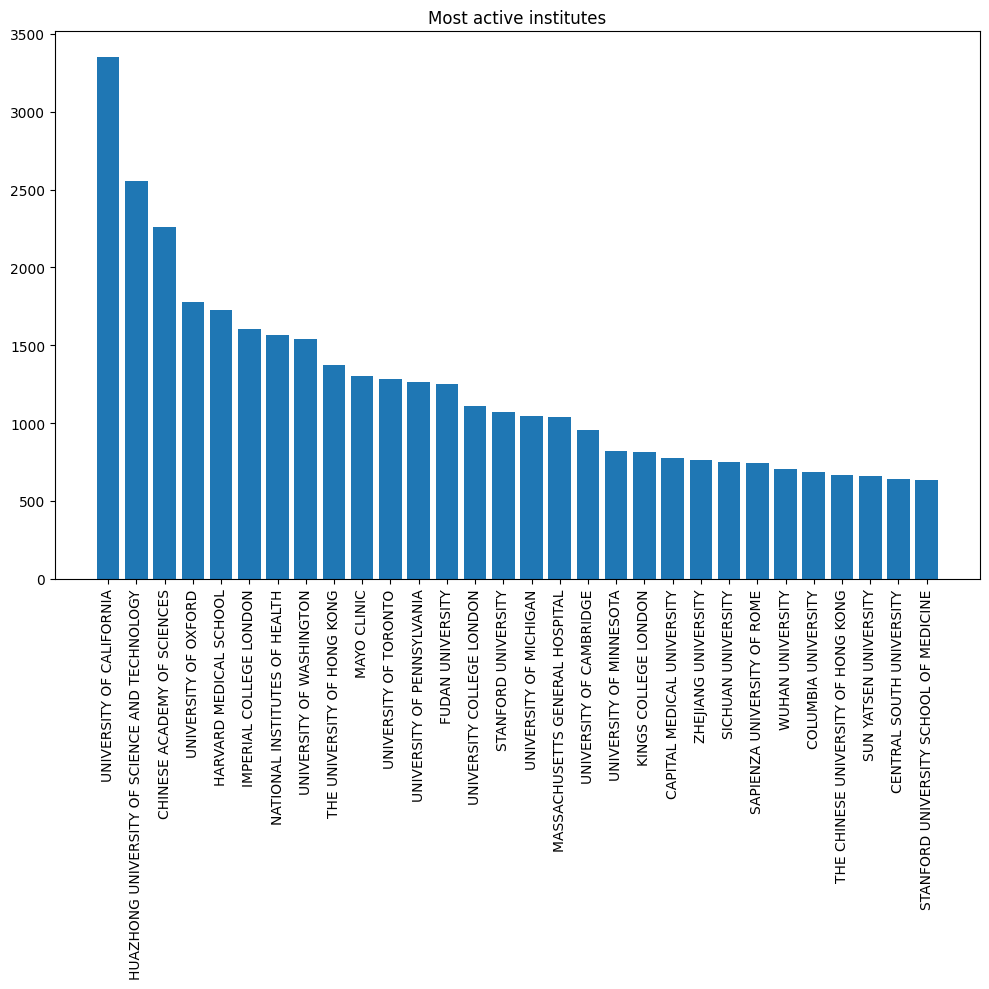

In [20]:
top_words = dict(list(inst_counts.items())[:30])
plt.figure(figsize=(10, 10))
plt.bar(top_words.keys(), top_words.values())
plt.xticks(rotation=90)
plt.title("Most active institutes")
plt.tight_layout()
plt.savefig("/dataNfs/wordcount_results/top20_institutes.png")
plt.show()

### 2.2 Benchmark

We performed a grid search over the same parameters used previously, applying the functions already defined in sequence:  
first `extract_country_list`, then `clean_country`, and finally `clean_institution`.  

The results were then converted into a DataFrame.


In [21]:
# ---------- CONFIG INPUT ----------
OUTPUT_DIR = "/dataNfs/wordcount_results/benchmark_ssh_timeonly"
os.makedirs(OUTPUT_DIR, exist_ok=True)

SSH_HOSTS = {
    "master": "10.67.22.102",
    "slave-1": "10.67.22.233",
    "slave-2": "10.67.22.118",
    "slave-3": "10.67.22.8"
}
# host list 
MASTER = ["master"]
SLAVES = ["slave-1", "slave-2","slave-3"]

# grid parameters
N_WORKERS_LIST = [1, 2, 3]                    # number of workers
PARTITIONS_LIST = [10, 20, 50, 100, 200,500]     # n_partitions per bag

rows = []     # results storage
n_workers = 3
hosts = MASTER + SLAVES[:n_workers]
hosts
process = psutil.Process()

In [22]:
# ---------- grid search ----------
for n_workers in N_WORKERS_LIST:
    for n_partitions in PARTITIONS_LIST:
        kill_dask_processes()
        time.sleep(3)
        print(f"\n=== RUN: n_workers={n_workers} | n_partitions={n_partitions} ===")

        hosts = MASTER + SLAVES[:n_workers]

        cluster = SSHCluster(
            hosts,
            scheduler_options={"port": 8786, "dashboard_address": ":8899"},
            worker_options={"nthreads": 2, "nprocs": 2},
            connect_options={"known_hosts": None},
        )
        client = Client(cluster)

        # pipeline Bag
        t0 = time.perf_counter()
        data_ddf = (db.from_sequence(all_files_bm, npartitions=n_partitions)
                      .map(extract_country_inst)
                      .flatten()
                      .to_dataframe(columns=["article_id","institution","country"])
                    )
        country_counts = (data_ddf.groupby("country")
                                  .article_id.count()
                                  .compute()
                                  .sort_values(ascending=False))

        
        t1 = time.perf_counter()
            
        # measure execution time
        elapsed = t1 - t0

        print(f"Elapsed: {elapsed:.2f}s")
        rows.append({
            "n_workers": n_workers,
            "n_partitions": n_partitions,
            "elapsed_s": elapsed,
            #"unique_words": len(result),
        })

df_results_gridsearch = pd.DataFrame(rows)


=== RUN: n_workers=1 | n_partitions=10 ===


2025-10-14 09:33:50,762 - distributed.deploy.ssh - INFO - 2025-10-14 09:33:50,762 - distributed.scheduler - INFO - State start
2025-10-14 09:33:50,766 - distributed.deploy.ssh - INFO - 2025-10-14 09:33:50,766 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:33:51,823 - distributed.deploy.ssh - INFO - 2025-10-14 09:33:51,826 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42643'
2025-10-14 09:33:51,826 - distributed.deploy.ssh - INFO - 2025-10-14 09:33:51,828 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33769'
2025-10-14 09:33:52,215 - distributed.deploy.ssh - INFO - 2025-10-14 09:33:52,217 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:44859
2025-10-14 09:33:52,216 - dis

Elapsed: 61.56s

=== RUN: n_workers=1 | n_partitions=20 ===


2025-10-14 09:34:58,050 - distributed.deploy.ssh - INFO - 2025-10-14 09:34:58,050 - distributed.scheduler - INFO - State start
2025-10-14 09:34:58,053 - distributed.deploy.ssh - INFO - 2025-10-14 09:34:58,053 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:34:59,076 - distributed.deploy.ssh - INFO - 2025-10-14 09:34:59,078 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46089'
2025-10-14 09:34:59,078 - distributed.deploy.ssh - INFO - 2025-10-14 09:34:59,080 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45259'
2025-10-14 09:34:59,464 - distributed.deploy.ssh - INFO - 2025-10-14 09:34:59,466 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:40911
2025-10-14 09:34:59,465 - dis

Elapsed: 7.62s

=== RUN: n_workers=1 | n_partitions=50 ===


2025-10-14 09:35:11,545 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:11,544 - distributed.scheduler - INFO - State start
2025-10-14 09:35:11,549 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:11,548 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:35:12,292 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:12,294 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38573'
2025-10-14 09:35:12,295 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:12,297 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43837'
2025-10-14 09:35:12,676 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:12,678 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:41373
2025-10-14 09:35:12,677 - dis

Elapsed: 7.23s

=== RUN: n_workers=1 | n_partitions=100 ===


2025-10-14 09:35:24,076 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:24,075 - distributed.scheduler - INFO - State start
2025-10-14 09:35:24,079 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:24,078 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:35:24,804 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:24,806 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38747'
2025-10-14 09:35:24,806 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:24,808 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45809'
2025-10-14 09:35:25,182 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:25,184 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:46577
2025-10-14 09:35:25,183 - dis

Elapsed: 7.23s

=== RUN: n_workers=1 | n_partitions=200 ===


2025-10-14 09:35:36,591 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:36,591 - distributed.scheduler - INFO - State start
2025-10-14 09:35:36,594 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:36,594 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:35:37,316 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:37,318 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39047'
2025-10-14 09:35:37,318 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:37,321 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45395'
2025-10-14 09:35:37,693 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:37,695 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:40157
2025-10-14 09:35:37,694 - dis

Elapsed: 9.65s

=== RUN: n_workers=1 | n_partitions=500 ===


2025-10-14 09:35:51,527 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:51,527 - distributed.scheduler - INFO - State start
2025-10-14 09:35:51,530 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:51,530 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:35:52,252 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:52,254 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36391'
2025-10-14 09:35:52,254 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:52,257 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36041'
2025-10-14 09:35:52,631 - distributed.deploy.ssh - INFO - 2025-10-14 09:35:52,633 - distributed.worker - INFO -       Start worker at:   tcp://10.67.22.233:45207
2025-10-14 09:35:52,631 - dis

Elapsed: 17.48s

=== RUN: n_workers=2 | n_partitions=10 ===


2025-10-14 09:36:14,530 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:14,530 - distributed.scheduler - INFO - State start
2025-10-14 09:36:14,534 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:14,534 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:36:15,771 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:15,773 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40827'
2025-10-14 09:36:15,774 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:15,776 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40319'
2025-10-14 09:36:15,831 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:15,831 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39653'
2025-10-14 09:36:15,835 - dis

Elapsed: 6.42s

=== RUN: n_workers=2 | n_partitions=20 ===


2025-10-14 09:36:26,864 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:26,863 - distributed.scheduler - INFO - State start
2025-10-14 09:36:26,868 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:26,867 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:36:27,833 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:27,835 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43329'
2025-10-14 09:36:27,835 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:27,837 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36139'
2025-10-14 09:36:27,840 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:27,840 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39511'
2025-10-14 09:36:27,843 - dis

Elapsed: 6.47s

=== RUN: n_workers=2 | n_partitions=50 ===


2025-10-14 09:36:38,868 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:38,867 - distributed.scheduler - INFO - State start
2025-10-14 09:36:38,870 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:38,870 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:36:39,846 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:39,846 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42595'
2025-10-14 09:36:39,848 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:39,848 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:35821'
2025-10-14 09:36:39,890 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:39,892 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35201'
2025-10-14 09:36:39,893 - dis

Elapsed: 5.28s

=== RUN: n_workers=2 | n_partitions=100 ===


2025-10-14 09:36:49,775 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:49,774 - distributed.scheduler - INFO - State start
2025-10-14 09:36:49,778 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:49,778 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:36:50,759 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:50,759 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:35529'
2025-10-14 09:36:50,761 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:50,761 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45901'
2025-10-14 09:36:50,767 - distributed.deploy.ssh - INFO - 2025-10-14 09:36:50,769 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36145'
2025-10-14 09:36:50,770 - dis

Elapsed: 5.20s

=== RUN: n_workers=2 | n_partitions=200 ===


2025-10-14 09:37:00,558 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:00,557 - distributed.scheduler - INFO - State start
2025-10-14 09:37:00,561 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:00,560 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:37:01,510 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:01,512 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45809'
2025-10-14 09:37:01,513 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:01,515 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:32887'
2025-10-14 09:37:01,526 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:01,526 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36923'
2025-10-14 09:37:01,530 - dis

Elapsed: 6.44s

=== RUN: n_workers=2 | n_partitions=500 ===


2025-10-14 09:37:12,532 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:12,532 - distributed.scheduler - INFO - State start
2025-10-14 09:37:12,537 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:12,536 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:37:13,496 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:13,495 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38189'
2025-10-14 09:37:13,498 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:13,498 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34453'
2025-10-14 09:37:13,531 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:13,533 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42059'
2025-10-14 09:37:13,533 - dis

Elapsed: 10.24s

=== RUN: n_workers=3 | n_partitions=10 ===


2025-10-14 09:37:28,558 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:28,557 - distributed.scheduler - INFO - State start
2025-10-14 09:37:28,561 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:28,561 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:37:29,998 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:29,998 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43641'
2025-10-14 09:37:30,001 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:30,000 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43435'
2025-10-14 09:37:30,001 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:30,003 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35055'
2025-10-14 09:37:30,004 - dis

Elapsed: 4.90s

=== RUN: n_workers=3 | n_partitions=20 ===


2025-10-14 09:37:39,592 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:39,592 - distributed.scheduler - INFO - State start
2025-10-14 09:37:39,596 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:39,595 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:37:40,797 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:40,797 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33025'
2025-10-14 09:37:40,801 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:40,800 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38049'
2025-10-14 09:37:40,818 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:40,820 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46399'
2025-10-14 09:37:40,821 - dis

Elapsed: 3.85s

=== RUN: n_workers=3 | n_partitions=50 ===


2025-10-14 09:37:49,262 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:49,261 - distributed.scheduler - INFO - State start
2025-10-14 09:37:49,266 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:49,265 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:37:50,474 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:50,474 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34465'
2025-10-14 09:37:50,477 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:50,476 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41663'
2025-10-14 09:37:50,485 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:50,487 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:32805'
2025-10-14 09:37:50,488 - dis

Elapsed: 3.81s

=== RUN: n_workers=3 | n_partitions=100 ===


2025-10-14 09:37:58,908 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:58,907 - distributed.scheduler - INFO - State start
2025-10-14 09:37:58,911 - distributed.deploy.ssh - INFO - 2025-10-14 09:37:58,911 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:38:00,131 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:00,130 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33687'
2025-10-14 09:38:00,134 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:00,134 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37625'
2025-10-14 09:38:00,136 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:00,138 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42963'
2025-10-14 09:38:00,138 - dis

Elapsed: 4.33s

=== RUN: n_workers=3 | n_partitions=200 ===


2025-10-14 09:38:09,211 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:09,210 - distributed.scheduler - INFO - State start
2025-10-14 09:38:09,215 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:09,215 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:38:10,424 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:10,424 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44943'
2025-10-14 09:38:10,427 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:10,426 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40883'
2025-10-14 09:38:10,431 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:10,433 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40967'
2025-10-14 09:38:10,434 - dis

Elapsed: 5.76s

=== RUN: n_workers=3 | n_partitions=500 ===


2025-10-14 09:38:20,842 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:20,841 - distributed.scheduler - INFO - State start
2025-10-14 09:38:20,846 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:20,845 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-14 09:38:22,091 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:22,091 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:32883'
2025-10-14 09:38:22,095 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:22,094 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43763'
2025-10-14 09:38:22,115 - distributed.deploy.ssh - INFO - 2025-10-14 09:38:22,113 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45759'
2025-10-14 09:38:22,119 - distr

Elapsed: 8.75s


In [23]:
df_results_gridsearch

,n_workers,n_partitions,elapsed_s
0,1,10,61.559490
1,1,20,7.617370
2,1,50,7.232393
3,1,100,7.231167
4,1,200,9.649777
5,1,500,17.483926
6,2,10,6.422389
7,2,20,6.465573
8,2,50,5.283728
9,2,100,5.202264


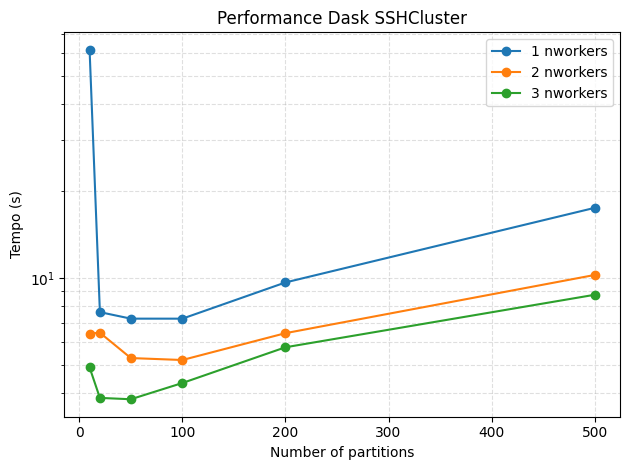

In [28]:
for n in df_results_gridsearch["n_workers"].unique():
    subset = df_results_gridsearch[df_results_gridsearch["n_workers"] == n]
    plt.plot(subset["n_partitions"], subset["elapsed_s"], marker="o", label=f"{n} nworkers")

plt.xlabel("Number of partitions")
#plt.xscale("log")
plt.yscale("log")
plt.grid(True, which="both", ls="--", alpha=0.4)
plt.ylabel("Tempo (s)")
plt.legend()
plt.title("Performance Dask SSHCluster")
plt.tight_layout()
plt.show()

This plot shows how execution time varies with the number of partitions for different Dask SSHCluster configurations (1, 2, and 3 workers).

The situation appears similar to that in Assignment 1, with the elapsed time decreasing as the number of workers increases. However, the difference in execution time between configurations is very small (on the order of one second). In fact, running this benchmark multiple times yields slightly different results, and it is common to observe cases where the 2-worker cluster performs faster than the 3-worker one, likely due to the small dataset size.

Since we do not plan to adjust any parameters based on this benchmark, we include it here merely for observational purposes.

### 2.3 Benchmark Full dataset size

As in the first point, we proceed to perform the benchmark with the full dataset.

In [42]:
n_workers = 3
hosts = MASTER + SLAVES[:n_workers]
hosts

['master', 'slave-1', 'slave-2', 'slave-3']

In [43]:
n_partitions_test = [200,500,1000,1200,1500,2000,5000,7000,10000]
rows_test2 = []
RAMs_test2 = []

for n_partitions in n_partitions_test:
    kill_dask_processes()
    time.sleep(3)
    print(f"\n=== RUN: n_workers=3 | n_partitions={n_partitions} ===")

    hosts = MASTER + SLAVES
    cluster = SSHCluster(
        hosts,
        scheduler_options={"port": 8786 , "dashboard_address": ":8899"},
        worker_options={"nthreads": 2, "nprocs": 2},
        connect_options={"known_hosts": None},
    )
    client = Client(cluster)

    # pipeline Bag
    t0 = time.perf_counter()
    data_ddf = (db.from_sequence(all_files, npartitions=n_partitions)
                  .map(extract_country_inst)
                  .flatten()
                  .to_dataframe(columns=["article_id","institution","country"])
                )
    country_counts = (data_ddf.groupby("country")
                              .article_id.count()
                              .compute()
                              .sort_values(ascending=False))
    t1 = time.perf_counter()

    elapsed = t1 - t0
    print(f"Elapsed: {elapsed:.2f}s")
        
    # RAM
    RAMs_test2.append(process.memory_info().rss / 1e6)
    
    rows_test2.append({
        "n_partitions": n_partitions,
        "elapsed_s": elapsed,
    })



=== RUN: n_workers=3 | n_partitions=200 ===


2025-10-13 11:24:11,890 - distributed.deploy.ssh - INFO - 2025-10-13 11:24:11,889 - distributed.scheduler - INFO - State start
2025-10-13 11:24:11,894 - distributed.deploy.ssh - INFO - 2025-10-13 11:24:11,893 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:24:13,140 - distributed.deploy.ssh - INFO - 2025-10-13 11:24:13,137 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:46423'
2025-10-13 11:24:13,143 - distributed.deploy.ssh - INFO - 2025-10-13 11:24:13,139 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:32989'
2025-10-13 11:24:13,157 - distributed.deploy.ssh - INFO - 2025-10-13 11:24:13,156 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33499'
2025-10-13 11:24:13,160 - distr

Elapsed: 142.92s

=== RUN: n_workers=3 | n_partitions=500 ===


2025-10-13 11:26:40,832 - distributed.deploy.ssh - INFO - 2025-10-13 11:26:40,830 - distributed.scheduler - INFO - State start
2025-10-13 11:26:40,839 - distributed.deploy.ssh - INFO - 2025-10-13 11:26:40,835 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:26:42,308 - distributed.deploy.ssh - INFO - 2025-10-13 11:26:42,309 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45297'
2025-10-13 11:26:42,311 - distributed.deploy.ssh - INFO - 2025-10-13 11:26:42,312 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35057'
2025-10-13 11:26:42,340 - distributed.deploy.ssh - INFO - 2025-10-13 11:26:42,336 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40637'
2025-10-13 11:26:42,342 - dis

Elapsed: 133.28s

=== RUN: n_workers=3 | n_partitions=1000 ===


2025-10-13 11:29:00,265 - distributed.deploy.ssh - INFO - 2025-10-13 11:29:00,265 - distributed.scheduler - INFO - State start
2025-10-13 11:29:00,269 - distributed.deploy.ssh - INFO - 2025-10-13 11:29:00,268 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:29:01,733 - distributed.deploy.ssh - INFO - 2025-10-13 11:29:01,734 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36285'
2025-10-13 11:29:01,736 - distributed.deploy.ssh - INFO - 2025-10-13 11:29:01,737 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43867'
2025-10-13 11:29:01,740 - distributed.deploy.ssh - INFO - 2025-10-13 11:29:01,736 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:46135'
2025-10-13 11:29:01,743 - dis

Elapsed: 125.70s

=== RUN: n_workers=3 | n_partitions=1200 ===


2025-10-13 11:31:12,282 - distributed.deploy.ssh - INFO - 2025-10-13 11:31:12,281 - distributed.scheduler - INFO - State start
2025-10-13 11:31:12,286 - distributed.deploy.ssh - INFO - 2025-10-13 11:31:12,286 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:31:13,772 - distributed.deploy.ssh - INFO - 2025-10-13 11:31:13,770 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:36913'
2025-10-13 11:31:13,775 - distributed.deploy.ssh - INFO - 2025-10-13 11:31:13,772 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39327'
2025-10-13 11:31:13,782 - distributed.deploy.ssh - INFO - 2025-10-13 11:31:13,782 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44357'
2025-10-13 11:31:13,784 - distrib

Elapsed: 115.56s

=== RUN: n_workers=3 | n_partitions=1500 ===


2025-10-13 11:33:14,043 - distributed.deploy.ssh - INFO - 2025-10-13 11:33:14,042 - distributed.scheduler - INFO - State start
2025-10-13 11:33:14,047 - distributed.deploy.ssh - INFO - 2025-10-13 11:33:14,046 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:33:15,545 - distributed.deploy.ssh - INFO - 2025-10-13 11:33:15,542 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33437'
2025-10-13 11:33:15,548 - distributed.deploy.ssh - INFO - 2025-10-13 11:33:15,544 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42957'
2025-10-13 11:33:15,577 - distributed.deploy.ssh - INFO - 2025-10-13 11:33:15,577 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44253'
2025-10-13 11:33:15,579 - dis

Elapsed: 112.53s

=== RUN: n_workers=3 | n_partitions=2000 ===


2025-10-13 11:35:12,786 - distributed.deploy.ssh - INFO - 2025-10-13 11:35:12,785 - distributed.scheduler - INFO - State start
2025-10-13 11:35:12,789 - distributed.deploy.ssh - INFO - 2025-10-13 11:35:12,789 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:35:14,296 - distributed.deploy.ssh - INFO - 2025-10-13 11:35:14,296 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37113'
2025-10-13 11:35:14,298 - distributed.deploy.ssh - INFO - 2025-10-13 11:35:14,298 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42871'
2025-10-13 11:35:14,307 - distributed.deploy.ssh - INFO - 2025-10-13 11:35:14,304 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37213'
2025-10-13 11:35:14,310 - dis

Elapsed: 110.89s

=== RUN: n_workers=3 | n_partitions=5000 ===


2025-10-13 11:37:09,919 - distributed.deploy.ssh - INFO - 2025-10-13 11:37:09,919 - distributed.scheduler - INFO - State start
2025-10-13 11:37:09,923 - distributed.deploy.ssh - INFO - 2025-10-13 11:37:09,923 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:37:11,401 - distributed.deploy.ssh - INFO - 2025-10-13 11:37:11,398 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34709'
2025-10-13 11:37:11,403 - distributed.deploy.ssh - INFO - 2025-10-13 11:37:11,400 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36817'
2025-10-13 11:37:11,473 - distributed.deploy.ssh - INFO - 2025-10-13 11:37:11,471 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34039'
2025-10-13 11:37:11,478 - distr

Elapsed: 126.47s

=== RUN: n_workers=3 | n_partitions=7000 ===


2025-10-13 11:39:22,728 - distributed.deploy.ssh - INFO - 2025-10-13 11:39:22,728 - distributed.scheduler - INFO - State start
2025-10-13 11:39:22,733 - distributed.deploy.ssh - INFO - 2025-10-13 11:39:22,732 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:39:24,213 - distributed.deploy.ssh - INFO - 2025-10-13 11:39:24,210 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39817'
2025-10-13 11:39:24,216 - distributed.deploy.ssh - INFO - 2025-10-13 11:39:24,213 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40581'
2025-10-13 11:39:24,232 - distributed.deploy.ssh - INFO - 2025-10-13 11:39:24,232 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34287'
2025-10-13 11:39:24,234 - dis

Elapsed: 141.02s

=== RUN: n_workers=3 | n_partitions=10000 ===


2025-10-13 11:41:49,914 - distributed.deploy.ssh - INFO - 2025-10-13 11:41:49,914 - distributed.scheduler - INFO - State start
2025-10-13 11:41:49,918 - distributed.deploy.ssh - INFO - 2025-10-13 11:41:49,918 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 11:41:51,422 - distributed.deploy.ssh - INFO - 2025-10-13 11:41:51,420 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:32827'
2025-10-13 11:41:51,425 - distributed.deploy.ssh - INFO - 2025-10-13 11:41:51,422 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41625'
2025-10-13 11:41:51,430 - distributed.deploy.ssh - INFO - 2025-10-13 11:41:51,428 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44017'
2025-10-13 11:41:51,434 - distr

Elapsed: 165.43s


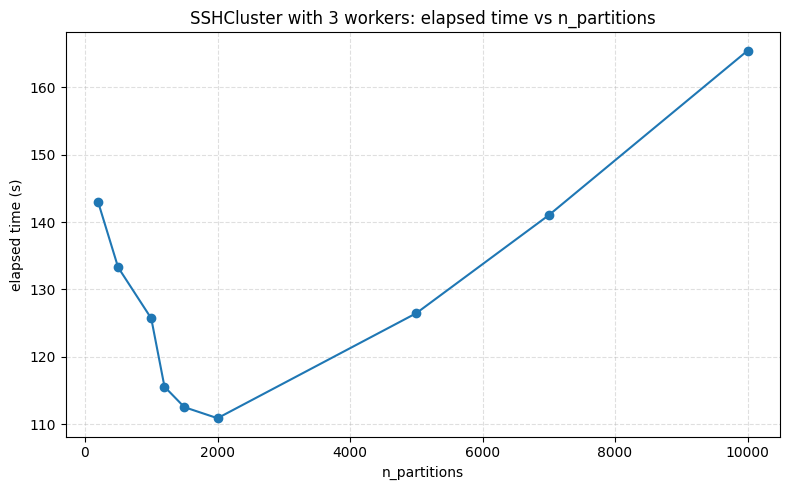

In [44]:
df_test = pd.DataFrame(rows_test2)
 # ---------- plot ----------
plt.figure(figsize=(8,5))
plt.plot(df_test["n_partitions"], df_test["elapsed_s"], marker="o")
plt.xlabel("n_partitions")
plt.ylabel("elapsed time (s)")
plt.title("SSHCluster with 3 workers: elapsed time vs n_partitions")
plt.grid(True, which="both", ls="--", alpha=0.4)
plt.tight_layout()
plt.show()

The output of this benchmark shows a similar trend to the previous one but with a more pronounced curve.
The best performance occurs in the range of **1000–2000** partitions, where the execution time reaches its minimum.
For both fewer and higher numbers of partitions, the execution time increases by 40%-50%, indicating that:

- with too few partitions, the workload is not evenly distributed among workers;

- with too many partitions, scheduling and communication overhead dominate the computation.

This confirms that **1500 partitions** provides a very good balance between parallel efficiency and system overhead for this 3-worker configuration.

### 2.3 RAM usage

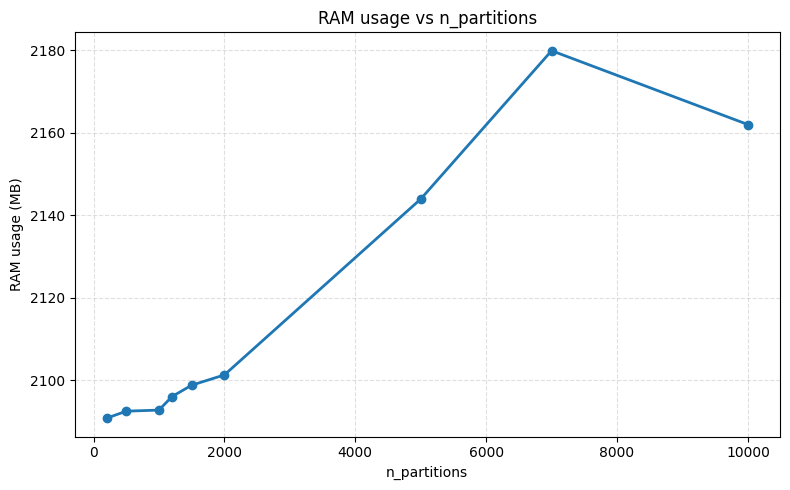

In [45]:
plt.figure(figsize=(8,5))
plt.plot(n_partitions_test, RAMs_test2, marker='o', linestyle='-', linewidth=2)
plt.title("RAM usage vs n_partitions")
plt.xlabel("n_partitions")
plt.ylabel("RAM usage (MB)")
plt.grid(True, which="both", ls="--", alpha=0.4)
plt.tight_layout()
plt.show()


**RAM usage** increases monotonically with the number of partitions, as we expected, because each partition adds overhead in task management and memory bookkeeping.

### 2.4 Cluster restarting

restarting the cluster again, for the next assignment.

In [46]:
kill_dask_processes()

In [47]:
cluster = SSHCluster(
    ["master", "slave-1", "slave-2", "slave-3"],
    connect_options={"known_hosts": None},
    worker_options={"n_workers": 2, "nthreads": 2},  # options for workers
    scheduler_options={"port": 8786, "dashboard_address": ":8899"} 
)

client = Client(cluster)

2025-10-13 11:47:56,498 - distributed.deploy.ssh - INFO - 2025-10-13 11:47:56,497 - distributed.scheduler - INFO - State start
2025-10-13 11:47:56,502 - distributed.deploy.ssh - INFO - 2025-10-13 11:47:56,502 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 11:47:58,063 - distributed.deploy.ssh - INFO - 2025-10-13 11:47:58,063 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35885'
2025-10-13 11:47:58,066 - distributed.deploy.ssh - INFO - 2025-10-13 11:47:58,066 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35981'
2025-10-13 11:47:58,069 - distributed.deploy.ssh - INFO - 2025-10-13 11:47:58,066 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43617'
2025-10-13 11:47:58,072 - distributed.deploy.ssh - INFO - 2025-10-13 11:47:58,069 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40979'
2025-10-13 11:47:58,084 - distributed.deploy.ssh - INFO - 2025-10-13

## Assignment 3

### 3.1 Embedding for paper titles

### Paper Title Embeddings

For the last part of the analysis, we aim to obtain embedding vectors for paper titles—a common and useful technique in Natural Language Processing (NLP).  

We use the **pre-trained WikiVec English model**, which contains 1 million words along with their corresponding embedding vectors.  

The procedure follows this scheme:

1. **Create a raw dataframe** containing only `paper_id` and `title`.  
2. **Clean and filter titles**, splitting each into a list of individual words.  
3. **Load the WikiVec dictionary**, filtered to include only the words that actually appear in our titles.  
4. **Explode the dataframe** so that each row corresponds to a single word, then merge it with its embedding vector.  
5. **Aggregate word embeddings** by computing the mean vector for each title, resulting in one embedding per paper.  
6. **Explore semantic similarity** between titles using cosine similarity on their embedding vectors.


Again, we decided to run this part of the algorithm with the configuration estimated *a posteriori* from the benchmark:

- `blocksize`= 32 MB  
- `n_partitions` = 700


#### 1. 

In [10]:
# Taking random json file

directory = "/dataNfs/document_parses/pdf_json"

all_files =  [
    os.path.join(directory, f)
    for f in os.listdir(directory)
    if os.path.isfile(os.path.join(directory, f))
]  

idx = np.random.choice(len(all_files), size = n_sample, replace=False)
all_files = [all_files[i] for i in idx]  

random_file = random.choice(all_files)
with open(random_file, "r", encoding="utf-8") as f:
    data = json.load(f)


The following functions extract the relevant informations, meaning `paper_id` and `title`, and clean the titles

In [11]:

def clean_title(t_raw:str) -> str | None:
    if not t_raw:
        return None
        
    """Remove strange characters, multiple spaces and put everything in  lower case"""
    title = re.sub(r"[^A-Za-z0-9\s]", "", t_raw)  # leave letters, numbers and spaces
    title = re.sub(r"\s+", " ", title)
    # collapse sequences of single letters (≥3 letters long) into one word
    def collapse_spaced_chars(match):
        chars = match.group().split()
        return "".join(chars)

    # regex: matches "a c a d e m i c", "e c o l o g y", etc.
    title = re.sub(r"(?:\b[a-zA-Z]\b\s+){2,}[a-zA-Z]\b", collapse_spaced_chars, title)
    return title.strip().lower()


def extract_title_id(file):
    
    with open(file, "r", encoding="utf-8") as f:
        data = json.load(f)

    article_id = data.get("paper_id")
    title = data.get("metadata", {}).get("title")
    if not article_id or not title:
        return []
    return [(article_id, title)]


We filter by considering only the same title once

In [12]:
%%time
npartitions=700
df_id_title = (
    db.from_sequence(all_files, npartitions=npartitions)
      .map(extract_title_id)
      .flatten()
      .to_dataframe(columns=["article_id","title"])
      .map_partitions(
          lambda df: df.assign(
              title=df["title"].apply(clean_title),
          )
      ).drop_duplicates(subset=["title"])
)

print(df_id_title.head(10))
print('\n')

                                   article_id  \
116  931b57a906251b5ce0da95b2f43626d9261e5385   
11   4703c8b564519c0df971553891e4aa688f7f460e   
15   3d87e960199b59aae86aeee5702121fd382b35ca   
98   056f1f8bbefab0d8b123477d2769a1ecf159f2e6   
86   d21394ea2747c7b08fc66d526e9b9655f5dc4b04   
60   36adf68a4c1d2dd201b8d567459dcdee427ca632   
100  29f6678d5ddd5a377953b2f8f1b9cf3477eeeb03   
86   89ddfe5c34f20bc9b476ba3ad2baf268ff0f293b   
62   bbdd984b1e27a29921e48a583ba672a99bfd6ff6   
56   25df5c788e8816330648fc2fe9696504759370fa   

                                                 title  
116  early institutional head and neck oncologic an...  
11   a quantitative framework for exploring exit st...  
15   distinct early iga profile may determine sever...  
98   impact of porcine arterivirus influenza b and ...  
86   how macroeconomic shocks impact employment com...  
60   population mobility trends deprivation index a...  
100  spatial temporal distribution of covid19 risk ...  
86  

#### 2.

To perform the embedding from the wikivec dictionary it's necessary to split the title into a list of single separated words

In [13]:
%%time
def split_title(title: str) -> list:
    if not title:
        return []
    return title.split()     # separa sugli spazi

df_id_title = df_id_title.map_partitions(
    lambda df: df.assign(
        title_words = df["title"].apply(split_title)
    )
)

print(df_id_title.head(10))

                                   article_id  \
116  931b57a906251b5ce0da95b2f43626d9261e5385   
11   4703c8b564519c0df971553891e4aa688f7f460e   
15   3d87e960199b59aae86aeee5702121fd382b35ca   
98   056f1f8bbefab0d8b123477d2769a1ecf159f2e6   
86   d21394ea2747c7b08fc66d526e9b9655f5dc4b04   
60   36adf68a4c1d2dd201b8d567459dcdee427ca632   
100  29f6678d5ddd5a377953b2f8f1b9cf3477eeeb03   
86   89ddfe5c34f20bc9b476ba3ad2baf268ff0f293b   
62   bbdd984b1e27a29921e48a583ba672a99bfd6ff6   
56   25df5c788e8816330648fc2fe9696504759370fa   

                                                 title  \
116  early institutional head and neck oncologic an...   
11   a quantitative framework for exploring exit st...   
15   distinct early iga profile may determine sever...   
98   impact of porcine arterivirus influenza b and ...   
86   how macroeconomic shocks impact employment com...   
60   population mobility trends deprivation index a...   
100  spatial temporal distribution of covid19 risk ...

#### 3.

When uploading the wikivec dictionary, we can either load it entirely, meaning one million words along with their corresponding embedding vectors, or first filter the words we actually need and load only those.
<br>The latter approach saves memory and speeds up the process.

In [14]:
def parse_vec_line(line: str):
    parts = line.rstrip().split()
    if len(parts) < 301:
        return None               # to avoid header and illformatted rows

    word = parts[0]
    vec = list(map(float,parts[1:]))
    return (word, vec)
    

In [15]:
%%time

path_model = "/dataNfs/wiki-news-300d-1M.vec"
# Extract used words from titles
unique_words = set(df_id_title["title_words"].explode().dropna().unique().compute().tolist())

# Read embedding file and filter immediately
bag = db.read_text(path_model, blocksize="32MB") \
        .map(parse_vec_line) \
        .filter(lambda x: (x is not None) and (x[0] in unique_words))

# convert to dataframe
wiki_vec_small = bag.to_dataframe(meta=[("word", str), ("vec", object)]) \
                    .rename(columns={0: "word", 1: "vec"}) \
                    .persist()


CPU times: user 2.04 s, sys: 74 ms, total: 2.12 s
Wall time: 2min 27s


In [16]:
print(f"Filtered model dimensions: {len(wiki_vec_small)} words")

Filtered model dimensions: 33566 words


As expected, we get a dictionary from wikivec which is much smaller then the original one. Here we have, for example, a sample of around 30k words, against the original of 1 million.

#### 4. & 5.

In this section, we perform the actual loading and filtering of the wikivec dictionary using our title database. The filters we apply are quite strict: as will be shown later, the original dataset can be reduced by a factor of 3–4. This ensures that we only consider well-formatted titles.

In [17]:
%%time

# load in memory
df_id_title_local = df_id_title[["article_id", "title", "title_words"]].compute()
embedding_dict = dict(zip(wiki_vec_small['word'].compute(), wiki_vec_small['vec'].compute()))

#  Computing mean embedding for paper
def calculate_article_embedding(row):
    title_words = row['title_words']
    if not title_words:
        return None
        
     # check all words are contained in the dictionary
    if not all(word in embedding_dict for word in title_words):
        return None   # if at least one word is not present, discart the full title
    
    
    vectors = [np.array(embedding_dict[word]) for word in title_words]
    return np.mean(vectors, axis=0).tolist()
    

# Apply function to every paper
df_id_title_local['embedding'] = df_id_title_local.apply(calculate_article_embedding, axis=1)

# create final df
df_embeddings = (
    df_id_title_local
    .dropna(subset=['embedding'])
    [['article_id', 'title', 'embedding']]
    .copy()
)
n = len(df_embeddings)

print(df_embeddings.head(),"\n")
print("Total lenghth of embeddings",n,"\n")

                                  article_id  \
86  d21394ea2747c7b08fc66d526e9b9655f5dc4b04   
60  36adf68a4c1d2dd201b8d567459dcdee427ca632   
62  bbdd984b1e27a29921e48a583ba672a99bfd6ff6   
38  1ef660b33019b21f9aa9059fcbc4640c9dcaed54   
67  51ef605da93429c3489f0a4b0a4eb6fd227b28b1   

                                                title  \
86  how macroeconomic shocks impact employment com...   
60  population mobility trends deprivation index a...   
62  closing the circle of reverse genetics in repr...   
38  middle east respiratory syndrome coronavirus w...   
67  microbial exchange via fomites and implication...   

                                            embedding  
86  [-0.031238461538461534, -0.021853846153846147,...  
60  [-0.002560000000000001, 0.02445333333333334, -...  
62  [-0.011211111111111113, 0.030511111111111114, ...  
38  [-0.09545555555555557, 0.03908888888888889, -0...  
67  [0.013766666666666667, 0.04201111111111112, 0....   

Total lenghth of embeddings 22

We notice that this number is not the same as the lenght of our taken dataset, 100k. This is due to the fact that probably not all the papers have a title, or if they do have it, maybe it's in another language, so the wiki dictionary, which is only in english, cannot find them.

### Benchmark

For this assignment, we decided to run the full dataset while exploring different configurations by changing the number of partitions and the block size of the wiki_vec dictionary.
We kept the configuration `(n_procs = 2; n_threads = 2)` with three workers, discarding the one- and two-worker clusters, which were unable to handle the job.

The following function, `run_pipeline`, simply combines the previously defined functions into one, allowing us to execute the full task for the benchmark.

In [18]:
def run_pipeline(npartitions: int, blocksize: str, client=None):
    t0 = time.perf_counter()

    # --- STEP 1: Loading and cleaning titles ---
    df_id_title = (
        db.from_sequence(all_files, npartitions=npartitions)
          .map(extract_title_id)
          .flatten()
          .to_dataframe(columns=["article_id", "title"])
          .map_partitions(lambda df: df.assign(
              title=df["title"].apply(clean_title)
          ))
          .drop_duplicates(subset=["title"])
    )

    # --- STEP 2: Splitting titles ---
    df_id_title = df_id_title.map_partitions(
        lambda df: df.assign(
            title_words=df["title"].apply(split_title)
        )
    )

    # --- STEP 3: Creation unique words sets ---
    unique_words = set(
        df_id_title["title_words"]
        .explode()
        .dropna()
        .unique()
        .compute()
        .tolist()
    )

    # --- STEP 4: Reading and filtering wikivec ---
    bag = (
        db.read_text(path_model, blocksize=blocksize)
          .map(parse_vec_line)
          .filter(lambda x: (x is not None) and (x[0] in unique_words))
    )

    wiki_vec_small = (
        bag.to_dataframe(meta=[("word", str), ("vec", object)])
           .rename(columns={0: "word", 1: "vec"})
           .persist()
    )

    # --- STEP 5: Joining and finding the embedding vectors ---
    df_id_title_local = df_id_title[["article_id", "title", "title_words"]].compute()

    embedding_dict = dict(
        zip(
            wiki_vec_small["word"].compute(),
            wiki_vec_small["vec"].compute()
        )
    )

    df_id_title_local["embedding"] = df_id_title_local.apply(
        calculate_article_embedding, axis=1
    )

    # --- STEP 6: final dataframe creation ---
    df_embeddings = (
        df_id_title_local
        .dropna(subset=["embedding"])
        [["article_id", "title", "embedding"]]
        .copy()
    )

    t1 = time.perf_counter()
    elapsed = t1 - t0

    # --- METRICS ---
    metrics = {
        "n_articles": len(df_embeddings),
        "n_unique_words": len(unique_words),
        "n_embeddings": len(embedding_dict),
    }

    return elapsed, metrics


In [19]:
# CLUSTER AND PARAMETERS CONFIGURATION 

MASTER = ["master"]
SLAVES = ["slave-1", "slave-2", "slave-3"]

npartitions_list = [300, 500, 700, 1000,1200]
blocksize_list = ["8MB","32MB", "128MB"]

results = []

# MAIN BENCHMARK LOOP

for npart, bsize in itertools.product(npartitions_list, blocksize_list):
    # --- Cleanup e setup ---
    kill_dask_processes()
    time.sleep(3)
    hosts = MASTER + SLAVES

    print(f"\n=== RUN: n_partitions={npart} | blocksize={bsize} ===\n")

    cluster = SSHCluster(
        hosts,
        connect_options={"known_hosts": None},
        worker_options={"nprocs": 2, "nthreads": 2},
        scheduler_options={"port": 8786, "dashboard_address": ":8899"},
    )
    client = Client(cluster)

    try:
        # --- Execute pipeline ---
        elapsed, metrics = run_pipeline(
            npartitions=npart,
            blocksize=bsize,
            client=client
        )

        entry = {
            "npartitions": npart,
            "blocksize": bsize,
            "elapsed_s": elapsed,
            **metrics
        }

        print(f"Completed: {entry}")
        results.append(entry)

    except Exception as e:
        print(f"Errore in npart={npart}, blocksize={bsize}: {e}")
        results.append({
            "npartitions": npart,
            "blocksize": bsize,
            "elapsed_s": None,
            "error": str(e),
        })

    finally:
        client.close()
        cluster.close()

df_results = pd.DataFrame(results)

# Save on CSV 
df_results.to_csv("benchmark_results.csv", index=False)
print("\nSaved in: benchmark_results.csv")



=== RUN: n_partitions=300 | blocksize=8MB ===



2025-10-13 13:56:21,741 - distributed.deploy.ssh - INFO - 2025-10-13 13:56:21,740 - distributed.scheduler - INFO - State start
2025-10-13 13:56:21,746 - distributed.deploy.ssh - INFO - 2025-10-13 13:56:21,746 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 13:56:23,278 - distributed.deploy.ssh - INFO - 2025-10-13 13:56:23,272 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39169'
2025-10-13 13:56:23,280 - distributed.deploy.ssh - INFO - 2025-10-13 13:56:23,274 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33981'
2025-10-13 13:56:23,285 - distributed.deploy.ssh - INFO - 2025-10-13 13:56:23,281 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37419'
2025-10-13 13:56:23,288 - dis

Completed: {'npartitions': 300, 'blocksize': '8MB', 'elapsed_s': 312.3870951407589, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=300 | blocksize=32MB ===



2025-10-13 14:01:40,802 - distributed.deploy.ssh - INFO - 2025-10-13 14:01:40,802 - distributed.scheduler - INFO - State start
2025-10-13 14:01:40,806 - distributed.deploy.ssh - INFO - 2025-10-13 14:01:40,806 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:01:42,293 - distributed.deploy.ssh - INFO - 2025-10-13 14:01:42,289 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39323'
2025-10-13 14:01:42,295 - distributed.deploy.ssh - INFO - 2025-10-13 14:01:42,291 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41899'
2025-10-13 14:01:42,301 - distributed.deploy.ssh - INFO - 2025-10-13 14:01:42,296 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45335'
2025-10-13 14:01:42,303 - distr

Completed: {'npartitions': 300, 'blocksize': '32MB', 'elapsed_s': 277.56939029414207, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=300 | blocksize=128MB ===



2025-10-13 14:06:24,984 - distributed.deploy.ssh - INFO - 2025-10-13 14:06:24,984 - distributed.scheduler - INFO - State start
2025-10-13 14:06:24,990 - distributed.deploy.ssh - INFO - 2025-10-13 14:06:24,989 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:06:26,472 - distributed.deploy.ssh - INFO - 2025-10-13 14:06:26,470 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39591'
2025-10-13 14:06:26,474 - distributed.deploy.ssh - INFO - 2025-10-13 14:06:26,472 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38381'
2025-10-13 14:06:26,480 - distributed.deploy.ssh - INFO - 2025-10-13 14:06:26,476 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37557'
2025-10-13 14:06:26,482 - dis

Completed: {'npartitions': 300, 'blocksize': '128MB', 'elapsed_s': 308.2434005816467, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=500 | blocksize=8MB ===



2025-10-13 14:11:39,716 - distributed.deploy.ssh - INFO - 2025-10-13 14:11:39,715 - distributed.scheduler - INFO - State start
2025-10-13 14:11:39,719 - distributed.deploy.ssh - INFO - 2025-10-13 14:11:39,719 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:11:41,243 - distributed.deploy.ssh - INFO - 2025-10-13 14:11:41,242 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35981'
2025-10-13 14:11:41,245 - distributed.deploy.ssh - INFO - 2025-10-13 14:11:41,244 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35601'
2025-10-13 14:11:41,444 - distributed.deploy.ssh - INFO - 2025-10-13 14:11:41,442 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37495'
2025-10-13 14:11:41,447 - distr

Completed: {'npartitions': 500, 'blocksize': '8MB', 'elapsed_s': 249.13798986794427, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=500 | blocksize=32MB ===



2025-10-13 14:15:55,635 - distributed.deploy.ssh - INFO - 2025-10-13 14:15:55,634 - distributed.scheduler - INFO - State start
2025-10-13 14:15:55,640 - distributed.deploy.ssh - INFO - 2025-10-13 14:15:55,640 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:15:57,140 - distributed.deploy.ssh - INFO - 2025-10-13 14:15:57,138 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45791'
2025-10-13 14:15:57,143 - distributed.deploy.ssh - INFO - 2025-10-13 14:15:57,140 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37459'
2025-10-13 14:15:57,144 - distributed.deploy.ssh - INFO - 2025-10-13 14:15:57,142 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46321'
2025-10-13 14:15:57,146 - distr

Completed: {'npartitions': 500, 'blocksize': '32MB', 'elapsed_s': 239.6138386982493, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=500 | blocksize=128MB ===



2025-10-13 14:20:01,951 - distributed.deploy.ssh - INFO - 2025-10-13 14:20:01,950 - distributed.scheduler - INFO - State start
2025-10-13 14:20:01,954 - distributed.deploy.ssh - INFO - 2025-10-13 14:20:01,954 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:20:03,434 - distributed.deploy.ssh - INFO - 2025-10-13 14:20:03,434 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39395'
2025-10-13 14:20:03,437 - distributed.deploy.ssh - INFO - 2025-10-13 14:20:03,436 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45639'
2025-10-13 14:20:03,446 - distributed.deploy.ssh - INFO - 2025-10-13 14:20:03,443 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44759'
2025-10-13 14:20:03,448 - distrib

Completed: {'npartitions': 500, 'blocksize': '128MB', 'elapsed_s': 289.79510531714186, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=700 | blocksize=8MB ===



2025-10-13 14:24:58,304 - distributed.deploy.ssh - INFO - 2025-10-13 14:24:58,303 - distributed.scheduler - INFO - State start
2025-10-13 14:24:58,307 - distributed.deploy.ssh - INFO - 2025-10-13 14:24:58,306 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:24:59,975 - distributed.deploy.ssh - INFO - 2025-10-13 14:24:59,975 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41307'
2025-10-13 14:24:59,978 - distributed.deploy.ssh - INFO - 2025-10-13 14:24:59,977 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42925'
2025-10-13 14:25:00,009 - distributed.deploy.ssh - INFO - 2025-10-13 14:25:00,010 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41525'
2025-10-13 14:25:00,013 - distr

Completed: {'npartitions': 700, 'blocksize': '8MB', 'elapsed_s': 263.9089197218418, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=700 | blocksize=32MB ===



2025-10-13 14:29:29,183 - distributed.deploy.ssh - INFO - 2025-10-13 14:29:29,182 - distributed.scheduler - INFO - State start
2025-10-13 14:29:29,188 - distributed.deploy.ssh - INFO - 2025-10-13 14:29:29,187 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:29:30,691 - distributed.deploy.ssh - INFO - 2025-10-13 14:29:30,692 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34265'
2025-10-13 14:29:30,694 - distributed.deploy.ssh - INFO - 2025-10-13 14:29:30,695 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41309'
2025-10-13 14:29:30,793 - distributed.deploy.ssh - INFO - 2025-10-13 14:29:30,792 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43767'
2025-10-13 14:29:30,796 - distrib

Completed: {'npartitions': 700, 'blocksize': '32MB', 'elapsed_s': 240.3013428770937, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=700 | blocksize=128MB ===



2025-10-13 14:33:36,270 - distributed.deploy.ssh - INFO - 2025-10-13 14:33:36,268 - distributed.scheduler - INFO - State start
2025-10-13 14:33:36,273 - distributed.deploy.ssh - INFO - 2025-10-13 14:33:36,273 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:33:37,760 - distributed.deploy.ssh - INFO - 2025-10-13 14:33:37,759 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33995'
2025-10-13 14:33:37,763 - distributed.deploy.ssh - INFO - 2025-10-13 14:33:37,762 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40907'
2025-10-13 14:33:37,766 - distributed.deploy.ssh - INFO - 2025-10-13 14:33:37,766 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43775'
2025-10-13 14:33:37,767 - distr

Completed: {'npartitions': 700, 'blocksize': '128MB', 'elapsed_s': 292.7683045580052, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=1000 | blocksize=8MB ===



2025-10-13 14:38:35,566 - distributed.deploy.ssh - INFO - 2025-10-13 14:38:35,565 - distributed.scheduler - INFO - State start
2025-10-13 14:38:35,569 - distributed.deploy.ssh - INFO - 2025-10-13 14:38:35,569 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:38:37,053 - distributed.deploy.ssh - INFO - 2025-10-13 14:38:37,054 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41993'
2025-10-13 14:38:37,055 - distributed.deploy.ssh - INFO - 2025-10-13 14:38:37,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38913'
2025-10-13 14:38:37,063 - distributed.deploy.ssh - INFO - 2025-10-13 14:38:37,057 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34147'
2025-10-13 14:38:37,065 - distrib

Completed: {'npartitions': 1000, 'blocksize': '8MB', 'elapsed_s': 264.4783326932229, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=1000 | blocksize=32MB ===



2025-10-13 14:43:06,931 - distributed.deploy.ssh - INFO - 2025-10-13 14:43:06,930 - distributed.scheduler - INFO - State start
2025-10-13 14:43:06,934 - distributed.deploy.ssh - INFO - 2025-10-13 14:43:06,934 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:43:08,416 - distributed.deploy.ssh - INFO - 2025-10-13 14:43:08,414 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45435'
2025-10-13 14:43:08,418 - distributed.deploy.ssh - INFO - 2025-10-13 14:43:08,416 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33189'
2025-10-13 14:43:08,456 - distributed.deploy.ssh - INFO - 2025-10-13 14:43:08,457 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34275'
2025-10-13 14:43:08,461 - distr

Completed: {'npartitions': 1000, 'blocksize': '32MB', 'elapsed_s': 257.2099352320656, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=1000 | blocksize=128MB ===



2025-10-13 14:47:30,974 - distributed.deploy.ssh - INFO - 2025-10-13 14:47:30,973 - distributed.scheduler - INFO - State start
2025-10-13 14:47:30,978 - distributed.deploy.ssh - INFO - 2025-10-13 14:47:30,978 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:47:32,436 - distributed.deploy.ssh - INFO - 2025-10-13 14:47:32,429 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45395'
2025-10-13 14:47:32,438 - distributed.deploy.ssh - INFO - 2025-10-13 14:47:32,432 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44815'
2025-10-13 14:47:32,505 - distributed.deploy.ssh - INFO - 2025-10-13 14:47:32,506 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35757'
2025-10-13 14:47:32,509 - distr

Completed: {'npartitions': 1000, 'blocksize': '128MB', 'elapsed_s': 294.5282308231108, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=1200 | blocksize=8MB ===



2025-10-13 14:52:32,247 - distributed.deploy.ssh - INFO - 2025-10-13 14:52:32,246 - distributed.scheduler - INFO - State start
2025-10-13 14:52:32,250 - distributed.deploy.ssh - INFO - 2025-10-13 14:52:32,250 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:52:33,743 - distributed.deploy.ssh - INFO - 2025-10-13 14:52:33,736 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:35093'
2025-10-13 14:52:33,745 - distributed.deploy.ssh - INFO - 2025-10-13 14:52:33,738 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:32993'
2025-10-13 14:52:33,761 - distributed.deploy.ssh - INFO - 2025-10-13 14:52:33,758 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36325'
2025-10-13 14:52:33,763 - dis

Completed: {'npartitions': 1200, 'blocksize': '8MB', 'elapsed_s': 266.6319524170831, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=1200 | blocksize=32MB ===



2025-10-13 14:57:05,727 - distributed.deploy.ssh - INFO - 2025-10-13 14:57:05,726 - distributed.scheduler - INFO - State start
2025-10-13 14:57:05,734 - distributed.deploy.ssh - INFO - 2025-10-13 14:57:05,733 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 14:57:07,252 - distributed.deploy.ssh - INFO - 2025-10-13 14:57:07,253 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37775'
2025-10-13 14:57:07,255 - distributed.deploy.ssh - INFO - 2025-10-13 14:57:07,255 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38589'
2025-10-13 14:57:07,271 - distributed.deploy.ssh - INFO - 2025-10-13 14:57:07,270 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36993'
2025-10-13 14:57:07,273 - distrib

Completed: {'npartitions': 1200, 'blocksize': '32MB', 'elapsed_s': 264.09292515181005, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

=== RUN: n_partitions=1200 | blocksize=128MB ===



2025-10-13 15:01:36,502 - distributed.deploy.ssh - INFO - 2025-10-13 15:01:36,501 - distributed.scheduler - INFO - State start
2025-10-13 15:01:36,507 - distributed.deploy.ssh - INFO - 2025-10-13 15:01:36,507 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:01:37,988 - distributed.deploy.ssh - INFO - 2025-10-13 15:01:37,987 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43331'
2025-10-13 15:01:37,991 - distributed.deploy.ssh - INFO - 2025-10-13 15:01:37,991 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35077'
2025-10-13 15:01:38,006 - distributed.deploy.ssh - INFO - 2025-10-13 15:01:38,000 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38197'
2025-10-13 15:01:38,009 - dis

Completed: {'npartitions': 1200, 'blocksize': '128MB', 'elapsed_s': 281.78494158480316, 'n_articles': 22354, 'n_unique_words': 69239, 'n_embeddings': 33566}

Saved in: benchmark_results.csv


In [20]:
print("\n=== BENCHMARK RESULTS ===")
print(df_results)


=== BENCHMARK RESULTS ===
    npartitions blocksize   elapsed_s  n_articles  n_unique_words  \
0           300       8MB  312.387095       22354           69239   
1           300      32MB  277.569390       22354           69239   
2           300     128MB  308.243401       22354           69239   
3           500       8MB  249.137990       22354           69239   
4           500      32MB  239.613839       22354           69239   
5           500     128MB  289.795105       22354           69239   
6           700       8MB  263.908920       22354           69239   
7           700      32MB  240.301343       22354           69239   
8           700     128MB  292.768305       22354           69239   
9          1000       8MB  264.478333       22354           69239   
10         1000      32MB  257.209935       22354           69239   
11         1000     128MB  294.528231       22354           69239   
12         1200       8MB  266.631952       22354           69239   
13     

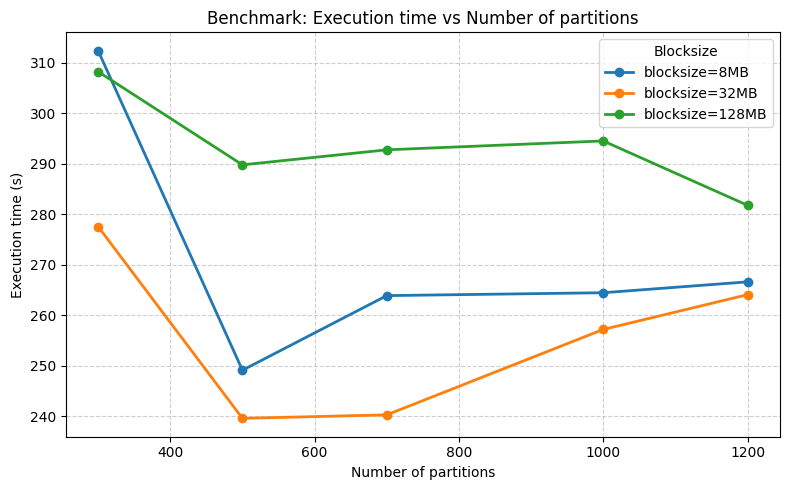

In [21]:
plt.figure(figsize=(8, 5))

for bsize in df_results["blocksize"].unique():
    subset = df_results[df_results["blocksize"] == bsize].sort_values("npartitions")
    plt.plot(
        subset["npartitions"],
        subset["elapsed_s"],
        marker="o",
        linewidth=2,
        label=f"blocksize={bsize}"
    )

plt.title("Benchmark: Execution time vs Number of partitions")
plt.xlabel("Number of partitions")
plt.ylabel("Execution time (s)")
plt.legend(title="Blocksize", loc="best")
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()


The results suggest that a block size of 32 MB provides the best trade-off between the number of partitions and computational overhead, avoiding excessive task management while maintaining efficient parallel processing.

As for the number of partitions, in the 8 MB and 128 MB cases it is more difficult to extract clear trends, as the execution times fluctuate; however, there appears to be a local minimum around 500 partitions for both.

In the 32 MB case, the curve shows a clear U-shape, with a minimum around 600 partitions. Based on these considerations, we conclude that the optimal configuration is achieved with 32 MB blocks and approximately 700 partitions.

### 3.2. Cosine Similarity Computation

In [5]:
kill_dask_processes()

In [23]:
cluster = SSHCluster(
    ["master", "slave-1", "slave-2", "slave-3"],
    connect_options={"known_hosts": None},
    worker_options={"n_workers": 1, "nthreads": 4},  # options for workers
    scheduler_options={"port": 8786, "dashboard_address": ":8899"} 
)

client = Client(cluster)

2025-10-13 15:06:22,053 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:22,052 - distributed.scheduler - INFO - State start
2025-10-13 15:06:22,056 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:22,056 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
2025-10-13 15:06:23,514 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:23,514 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43685'
2025-10-13 15:06:23,558 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:23,552 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33219'
2025-10-13 15:06:23,614 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:23,614 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41499'
2025-10-13 15:06:23,876 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:23,876 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-scratch-space/worker-j16k60qy', purging
2025-10-13 15:06:23,877 - dist


Since our goal is to identify the most similar articles, duplicates (although inherently similar) carry little significance and were therefore filtered out. We also introduced a cutoff value set to 0.99, to discard titles with overly high similarity since these pairs of titles are composed of the same words which are just permutated or replicated n times. <br>A possible example could be `letter to the editor` and `letter to the editor letter to the editor`.

To compute cosine similarity, we adopted the following **blockwise approach**:

1. **Embedding preparation**  
   - Build the embedding matrix with `numpy` (`np.vstack`), then we convert it into a `dask.array` and we normalize that matrix taking into account the possibility of null vector via `da.clip()` function.

2. **Blockwise iteration**  
   - For each block `i`, compute its dot product with every other block `j` (`da.dot(chunk_i, chunk_j.T)`)   

3. **Local filtering**  
   - For each similarity block at every `j` iteration we call the `compute()` method, once the block is stored  we proceed to flatten it and filter out values that are equal to  `1`  <br>

4. **Top-k selection with `heapq`**
- We use `np.argpartition` to extract the `local top-k similarities` from each block.<br>
  In order to implement the search of the best global `top_k` pairs we proceed by using the heapq libraries which are better suited in terms of memory efficiency.
  The heap is  a binary tree, with the  properity of  maintaing the smallest number as its root. If the root is removed the tree will re-arrange by taking the 2nd smallest number and making it the new root. <br>
- We use two functions:<br>
 **I**.  `heapq.heappush`: which pushes a given value `val` to  the tree. <br>
 **II**. `heapq.heapushpop`: which pushes a given value `val` to the tree confronts it with the root of it and only adds the `val` to the tree if it is bigger than the root, then discards the root, subsequently the tree rearranges itself by setting a new root.<br>

- The routine is the following: 
1. the 0-th iteration takes the first `top_k` values and push them to the tree, filling the heap.
2. Once the heap reaches its maximum size (`top_k`), we use `heappushpop` for subsequent iterations.<br> At each step, the smallest value in the heap is discarded if a larger candidate is found.  
3. Since the length of the tree is constrained to be `top_k`, once all loops (both on `i` and `j`) are completed we are left with the `top_k` most similar pairs unsorted except for the smallest one which is the root.

The heap has the following structure: it is a list of tuples where the first component is the value of the cosine of the pair of the two embedding vectors, the 2nd component is a subtuple which contains the two **global** indicating the positions of the two embedding vectors in the original dataframe.

5. **Result**  
   - At the end, the heap is sorted to retrieve the final global top-k most similar pairs  

This approach is highly **memory-efficient** and **scalable**, since we never compute or store the full similarity matrix.  
However, it does not allow us to study the complete *angle distribution*, which would require the entire similarity matrix.


In [24]:
# we construct the embeddings_matrix
embeddings_matrix = np.vstack(df_embeddings['embedding'].values) 

def compute_cosine_similarity(chunk_size, n, embeddings_matrix):
    
    if chunk_size > n:
        print(f"Invalid number of chunks", f"total_emb len is {n}", "\n")
        return 0
    
    # Compute the number of chunks (ceil division)
    num_chunks = (n + chunk_size - 1) // chunk_size  

    print(f"Using chunk_size={chunk_size}, num_chunks={num_chunks}")

    start = time.perf_counter()

    # Create a Dask array with the given chunking strategy
    emb_da = da.from_array(embeddings_matrix, chunks=(chunk_size, -1))

    # Normalize the embedding matrix / handle zero vectors
    norms = da.linalg.norm(emb_da, axis=1, keepdims=True)
    emb_norm = emb_da / da.clip(norms, 1e-12, np.inf) 

    n = emb_norm.shape[0]
    top_k = 40
    heap = [] 
    
    
    # Loop over different blocks
    # Select the i-th chunk
    for i in range(0, n, chunk_size): 
        chunk_i = emb_norm[i:i+chunk_size] 

        # Select the j-th chunk given i-th, 
        # with the constraint j >= i since (i, j) similarity is symmetric
        for j in range(i, n, chunk_size): 
            chunk_j = emb_norm[j:j+chunk_size]

            sim_block = da.dot(chunk_i, chunk_j.T) 

            # Exclude diagonal (self-similarity = 1)
            if i == j:
                sim_block = sim_block.map_blocks(
                    lambda x: np.where(np.eye(x.shape[0], dtype=bool), -np.inf, x),
                    dtype=sim_block.dtype
                )

            # Actually compute the block in memory; 
            # we do this inside the loop to avoid memory saturation,
            # instead of waiting to compute at the end
            block = sim_block.compute()         
            
            arr = block.flatten()
            arr[arr == 1] = 2   # mask out values equal to 1

            # Find local top_k values
            # note: np.argpartition returns indices of the k smallest, 
            # so we negate to get the top-k largest values
            flat_idx = np.argpartition(-arr, top_k-1)[:top_k] 
            for idx_flat in flat_idx:
                val = block.flatten()[idx_flat]
                row, col = np.unravel_index(idx_flat, block.shape)
                row_global, col_global = i + row, j + col

                # Filter out exact similarities = 1
                # so the number of returned pairs may be < top_k
                if val < 0.99:                 
                    if len(heap) < top_k:
                        heapq.heappush(heap, (val, (row_global, col_global)))
                    else:
                        heapq.heappushpop(heap, (val, (row_global, col_global)))

            # free memory (optional)
            # del block, sim_block

    # Sort top pairs by decreasing similarity
    top_pairs = sorted(heap, key=lambda x: -x[0])
    end = time.perf_counter()
    elapsed = end - start

    print(f"elapsed time: {elapsed}\n")
    return top_pairs, elapsed


In [25]:
chunk_size = 2000
num_chunks = (n + chunk_size - 1) // chunk_size  # ceil division
print(f"\nUsing chunk_size={chunk_size}, num_chunks={num_chunks}")

pairs_top_20, _ = compute_cosine_similarity(chunk_size,n,embeddings_matrix)


Using chunk_size=2000, num_chunks=12
Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 25.793131696991622



/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


In [26]:
pairs_top_20 = pairs_top_20[:20]
print(f"\n=== Top 20  === \n")
for rank, (score, (i, j)) in enumerate(pairs_top_20, 1):
    title_i = df_embeddings['title'].iloc[i]
    title_j = df_embeddings['title'].iloc[j]
    print(f"{rank}: ({i}, {j}) = {score:.4f} \n")
    print(f" Title 1 : \n'{title_i}' \n Title 2 :\n'{title_j}'\n")
    print(f"----------------------------------------------------\n")


=== Top 20  === 

1: (1105, 7394) = 0.9898 

 Title 1 : 
'reply to letter to the editor' 
 Title 2 :
'letter to the editor reply'

----------------------------------------------------

2: (17251, 18799) = 0.9897 

 Title 1 : 
'supplementary information differential innate immune response programs in neuronal subtypes determine susceptibility to infection in the brain by positive stranded rna viruses' 
 Title 2 :
'differential innate immune response programs in neuronal subtypes determine susceptibility to infection in the brain by positive stranded rna viruses hhs public access author manuscript'

----------------------------------------------------

3: (3156, 4580) = 0.9897 

 Title 1 : 
'viruses special issue emerging viruses surveillance prevention evolution and control' 
 Title 2 :
'viruses special issue emerging viruses 2020 surveillance prevention evolution and control'

----------------------------------------------------

4: (6060, 19590) = 0.9897 

 Title 1 : 
'chapter 12' 
 

### 3.3 Benchmark 

For this second benchmark, focused on cosine similarity, our goal is to determine the optimal combination of `chunk_size` and the number of processes and threads (`n_procs` and `n_threads`).

After several preliminary trials, we observed a significant variability in performance, particularly with respect to n_threads and n_procs. To better analyze this behavior, we decided to run each configuration 10 times, compute the average elapsed time, and visualize the results with their corresponding error bars.

In [27]:
MASTER = ["master"]
SLAVES = ["slave-1", "slave-2", "slave-3"]

chunk_list = [1000, 1500, 2000, 2500, 3000]  
procs_threads = [(1, 4), (2, 2), (4, 1)]  

results = []

In [28]:
# GLOBAL PARAMETERS

MASTER = ["master"]
SLAVES = ["slave-1", "slave-2", "slave-3"]

chunk_list = [1000, 1500, 2000, 2500, 3000]
procs_threads = [(1, 4), (2, 2), (4, 1)]

n_runs = 10  # Number of repetitions for each combination
results = []

In [29]:
# Output file name with timestamp
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
output_csv = f"benchmark_results_{timestamp}.csv"

print(f"\nOutput CSV: {output_csv}")

# MAIN BENCHMARK LOOP

total_combinations = list(itertools.product(chunk_list, procs_threads))
print(f"\nTotal combinations: {len(total_combinations)} | Each combination executed {n_runs} times.\n")

for chunk_size, (nprocs, nthreads) in tqdm(total_combinations, desc="Benchmarking combinations"):

    print(f"\n=== BENCHMARK: chunk_size={chunk_size} | nprocs={nprocs} | nthreads={nthreads} ===")

    run_times = []

    for run in tqdm(range(1, n_runs + 1), desc="Executions", leave=False):
        print(f"\n--- Run {run}/{n_runs} ---")

        # Cleanup and setup
        kill_dask_processes()
        time.sleep(3)
        hosts = MASTER + SLAVES

        cluster = SSHCluster(
            hosts,
            connect_options={"known_hosts": None},
            worker_options={"nprocs": nprocs, "nthreads": nthreads},
            scheduler_options={"port": 8786, "dashboard_address": ":8899"},
        )
        client = Client(cluster)

        try:
            # Execute pipeline
            t0 = time.perf_counter()
            _, elapsed = compute_cosine_similarity(chunk_size, n, embeddings_matrix)
            t1 = time.perf_counter()

            elapsed_s = t1 - t0 if elapsed is None else elapsed
            run_times.append(elapsed_s)

            print(f"Run {run} completed in {elapsed_s:.3f} s")

        except Exception as e:
            print(f" Error in run {run}: {e}")
            run_times.append(None)

        finally:
            client.close()
            cluster.close()

    # Compute statistics
    valid_times = [t for t in run_times if t is not None]
    mean_time = sum(valid_times) / len(valid_times) if valid_times else None
    std_time = (pd.Series(valid_times).std() if valid_times else None)

    entry = {
        "chunk_size": chunk_size,
        "nprocs": nprocs,
        "nthreads": nthreads,
        "n_runs": n_runs,
        "mean_elapsed_s": mean_time,
        "std_elapsed_s": std_time,
        "all_runs": valid_times,
    }

    print(f"\n Combination completed: {entry}")
    results.append(entry)

    # --- Save partial results ---
    df_partial = pd.DataFrame(results)
    df_partial.to_csv(output_csv, index=False)
    print(f"Partial results saved to: {output_csv}")




Output CSV: benchmark_results_20251013_150650.csv

Total combinations: 15 | Each combination executed 10 times.



Benchmarking combinations:   0%|                                                                 | 0/15 [00:00<?, ?it/s]


=== BENCHMARK: chunk_size=1000 | nprocs=1 | nthreads=4 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:06:54,762 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:54,761 - distributed.scheduler - INFO - State start
2025-10-13 15:06:54,766 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:54,766 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:06:55,954 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:55,948 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45797'
2025-10-13 15:06:55,955 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:55,954 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46633'
2025-10-13 15:06:55,955 - distributed.deploy.ssh - INFO - 2025-10-13 15:06:55,954 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42367'
2025-10-13 15:06:56,329 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 39.76970987394452

Run 1 completed in 39.770 s

--- Run 2/10 ---


2025-10-13 15:07:40,370 - distributed.deploy.ssh - INFO - 2025-10-13 15:07:40,369 - distributed.scheduler - INFO - State start
2025-10-13 15:07:40,373 - distributed.deploy.ssh - INFO - 2025-10-13 15:07:40,373 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:07:41,797 - distributed.deploy.ssh - INFO - 2025-10-13 15:07:41,797 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34483'
2025-10-13 15:07:41,803 - distributed.deploy.ssh - INFO - 2025-10-13 15:07:41,803 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37639'
2025-10-13 15:07:41,815 - distributed.deploy.ssh - INFO - 2025-10-13 15:07:41,809 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45489'
2025-10-13 15:07:42,165 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 41.473145816940814

Run 2 completed in 41.473 s

--- Run 3/10 ---


2025-10-13 15:08:28,253 - distributed.deploy.ssh - INFO - 2025-10-13 15:08:28,252 - distributed.scheduler - INFO - State start
2025-10-13 15:08:28,258 - distributed.deploy.ssh - INFO - 2025-10-13 15:08:28,258 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:08:29,443 - distributed.deploy.ssh - INFO - 2025-10-13 15:08:29,443 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35919'
2025-10-13 15:08:29,444 - distributed.deploy.ssh - INFO - 2025-10-13 15:08:29,443 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39029'
2025-10-13 15:08:29,457 - distributed.deploy.ssh - INFO - 2025-10-13 15:08:29,451 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42239'
2025-10-13 15:08:29,807 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 40.52109454711899

Run 3 completed in 40.521 s

--- Run 4/10 ---


2025-10-13 15:09:14,604 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:14,604 - distributed.scheduler - INFO - State start
2025-10-13 15:09:14,608 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:14,607 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:09:16,029 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:16,029 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36101'
2025-10-13 15:09:16,030 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:16,029 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44649'
2025-10-13 15:09:16,057 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:16,051 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40857'
2025-10-13 15:09:16,390 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.987446391955018

Run 4 completed in 31.987 s

--- Run 5/10 ---


2025-10-13 15:09:52,892 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:52,891 - distributed.scheduler - INFO - State start
2025-10-13 15:09:52,895 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:52,895 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:09:54,076 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:54,075 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34791'
2025-10-13 15:09:54,079 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:54,080 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43499'
2025-10-13 15:09:54,090 - distributed.deploy.ssh - INFO - 2025-10-13 15:09:54,084 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42977'
2025-10-13 15:09:54,444 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.06847779499367

Run 5 completed in 35.068 s

--- Run 6/10 ---


2025-10-13 15:10:33,757 - distributed.deploy.ssh - INFO - 2025-10-13 15:10:33,757 - distributed.scheduler - INFO - State start
2025-10-13 15:10:33,760 - distributed.deploy.ssh - INFO - 2025-10-13 15:10:33,760 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:10:35,164 - distributed.deploy.ssh - INFO - 2025-10-13 15:10:35,164 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36461'
2025-10-13 15:10:35,179 - distributed.deploy.ssh - INFO - 2025-10-13 15:10:35,180 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46615'
2025-10-13 15:10:35,189 - distributed.deploy.ssh - INFO - 2025-10-13 15:10:35,184 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44109'
2025-10-13 15:10:35,549 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.3636842709966

Run 6 completed in 35.364 s

--- Run 7/10 ---


2025-10-13 15:11:15,381 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:15,380 - distributed.scheduler - INFO - State start
2025-10-13 15:11:15,384 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:15,384 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:11:16,560 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:16,561 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35473'
2025-10-13 15:11:16,564 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:16,559 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:46219'
2025-10-13 15:11:16,570 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:16,571 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43605'
2025-10-13 15:11:16,926 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.51047819573432

Run 7 completed in 35.510 s

--- Run 8/10 ---


2025-10-13 15:11:56,702 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:56,702 - distributed.scheduler - INFO - State start
2025-10-13 15:11:56,706 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:56,706 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:11:58,133 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:58,133 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38391'
2025-10-13 15:11:58,134 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:58,129 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42471'
2025-10-13 15:11:58,171 - distributed.deploy.ssh - INFO - 2025-10-13 15:11:58,172 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34915'
2025-10-13 15:11:58,501 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 37.10303539177403

Run 8 completed in 37.103 s

--- Run 9/10 ---


2025-10-13 15:12:40,092 - distributed.deploy.ssh - INFO - 2025-10-13 15:12:40,092 - distributed.scheduler - INFO - State start
2025-10-13 15:12:40,095 - distributed.deploy.ssh - INFO - 2025-10-13 15:12:40,095 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:12:41,268 - distributed.deploy.ssh - INFO - 2025-10-13 15:12:41,269 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38423'
2025-10-13 15:12:41,280 - distributed.deploy.ssh - INFO - 2025-10-13 15:12:41,280 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44037'
2025-10-13 15:12:41,345 - distributed.deploy.ssh - INFO - 2025-10-13 15:12:41,340 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:46793'
2025-10-13 15:12:41,632 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.839291096199304

Run 9 completed in 31.839 s

--- Run 10/10 ---


2025-10-13 15:13:17,812 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:17,812 - distributed.scheduler - INFO - State start
2025-10-13 15:13:17,815 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:17,815 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:13:19,237 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:19,239 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39007'
2025-10-13 15:13:19,243 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:19,244 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38005'
2025-10-13 15:13:19,296 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:19,291 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44051'
2025-10-13 15:13:19,598 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.947001427877694

Run 10 completed in 31.947 s

 Combination completed: {'chunk_size': 1000, 'nprocs': 1, 'nthreads': 4, 'n_runs': 10, 'mean_elapsed_s': 36.058336480753496, 'std_elapsed_s': 3.607709870453598, 'all_runs': [39.76970987394452, 41.473145816940814, 40.52109454711899, 31.987446391955018, 35.06847779499367, 35.3636842709966, 35.51047819573432, 37.10303539177403, 31.839291096199304, 31.947001427877694]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=1000 | nprocs=2 | nthreads=2 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:13:56,145 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:56,145 - distributed.scheduler - INFO - State start
2025-10-13 15:13:56,148 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:56,148 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:13:57,333 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:57,334 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45551'
2025-10-13 15:13:57,335 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:57,336 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44739'
2025-10-13 15:13:57,339 - distributed.deploy.ssh - INFO - 2025-10-13 15:13:57,341 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34183'
2025-10-13 15:13:57,342 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.96314722718671

Run 1 completed in 29.963 s

--- Run 2/10 ---


2025-10-13 15:14:32,019 - distributed.deploy.ssh - INFO - 2025-10-13 15:14:32,018 - distributed.scheduler - INFO - State start
2025-10-13 15:14:32,022 - distributed.deploy.ssh - INFO - 2025-10-13 15:14:32,022 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:14:33,438 - distributed.deploy.ssh - INFO - 2025-10-13 15:14:33,440 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37625'
2025-10-13 15:14:33,439 - distributed.deploy.ssh - INFO - 2025-10-13 15:14:33,440 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41201'
2025-10-13 15:14:33,441 - distributed.deploy.ssh - INFO - 2025-10-13 15:14:33,442 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41063'
2025-10-13 15:14:33,441 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 37.174934825859964

Run 2 completed in 37.175 s

--- Run 3/10 ---


2025-10-13 15:15:15,504 - distributed.deploy.ssh - INFO - 2025-10-13 15:15:15,504 - distributed.scheduler - INFO - State start
2025-10-13 15:15:15,508 - distributed.deploy.ssh - INFO - 2025-10-13 15:15:15,507 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:15:16,690 - distributed.deploy.ssh - INFO - 2025-10-13 15:15:16,691 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34115'
2025-10-13 15:15:16,693 - distributed.deploy.ssh - INFO - 2025-10-13 15:15:16,694 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42297'
2025-10-13 15:15:16,701 - distributed.deploy.ssh - INFO - 2025-10-13 15:15:16,702 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:36057'
2025-10-13 15:15:16,702 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 41.45966472197324

Run 3 completed in 41.460 s

--- Run 4/10 ---


2025-10-13 15:16:02,869 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:02,868 - distributed.scheduler - INFO - State start
2025-10-13 15:16:02,874 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:02,873 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:16:04,290 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:04,292 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45519'
2025-10-13 15:16:04,292 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:04,294 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43375'
2025-10-13 15:16:04,298 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:04,298 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41177'
2025-10-13 15:16:04,299 - distrib

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 37.85430280212313

Run 4 completed in 37.854 s

--- Run 5/10 ---


2025-10-13 15:16:46,979 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:46,978 - distributed.scheduler - INFO - State start
2025-10-13 15:16:46,982 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:46,982 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:16:48,158 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:48,160 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35861'
2025-10-13 15:16:48,161 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:48,162 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:32795'
2025-10-13 15:16:48,171 - distributed.deploy.ssh - INFO - 2025-10-13 15:16:48,173 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37491'
2025-10-13 15:16:48,173 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.175580970942974

Run 5 completed in 31.176 s

--- Run 6/10 ---


2025-10-13 15:17:23,958 - distributed.deploy.ssh - INFO - 2025-10-13 15:17:23,958 - distributed.scheduler - INFO - State start
2025-10-13 15:17:23,963 - distributed.deploy.ssh - INFO - 2025-10-13 15:17:23,962 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:17:25,379 - distributed.deploy.ssh - INFO - 2025-10-13 15:17:25,381 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45645'
2025-10-13 15:17:25,380 - distributed.deploy.ssh - INFO - 2025-10-13 15:17:25,382 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38315'
2025-10-13 15:17:25,381 - distributed.deploy.ssh - INFO - 2025-10-13 15:17:25,383 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35867'
2025-10-13 15:17:25,383 - distrib

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.75562700908631

Run 6 completed in 32.756 s

--- Run 7/10 ---


2025-10-13 15:18:03,010 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:03,009 - distributed.scheduler - INFO - State start
2025-10-13 15:18:03,013 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:03,013 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:18:04,191 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:04,193 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44503'
2025-10-13 15:18:04,194 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:04,196 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42229'
2025-10-13 15:18:04,196 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:04,197 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36665'
2025-10-13 15:18:04,198 - distrib

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 36.07289206283167

Run 7 completed in 36.073 s

--- Run 8/10 ---


2025-10-13 15:18:45,044 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:45,044 - distributed.scheduler - INFO - State start
2025-10-13 15:18:45,047 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:45,047 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:18:46,454 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:46,449 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34661'
2025-10-13 15:18:46,456 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:46,451 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36611'
2025-10-13 15:18:46,463 - distributed.deploy.ssh - INFO - 2025-10-13 15:18:46,465 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37899'
2025-10-13 15:18:46,466 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.93199285585433

Run 8 completed in 35.932 s

--- Run 9/10 ---


2025-10-13 15:19:27,233 - distributed.deploy.ssh - INFO - 2025-10-13 15:19:27,232 - distributed.scheduler - INFO - State start
2025-10-13 15:19:27,236 - distributed.deploy.ssh - INFO - 2025-10-13 15:19:27,236 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:19:28,415 - distributed.deploy.ssh - INFO - 2025-10-13 15:19:28,417 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41091'
2025-10-13 15:19:28,418 - distributed.deploy.ssh - INFO - 2025-10-13 15:19:28,419 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33855'
2025-10-13 15:19:28,423 - distributed.deploy.ssh - INFO - 2025-10-13 15:19:28,418 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33545'
2025-10-13 15:19:28,425 - distrib

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 37.14687269832939

Run 9 completed in 37.147 s

--- Run 10/10 ---


2025-10-13 15:20:10,225 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:10,225 - distributed.scheduler - INFO - State start
2025-10-13 15:20:10,228 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:10,228 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:20:11,631 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:11,632 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38613'
2025-10-13 15:20:11,633 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:11,634 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40455'
2025-10-13 15:20:11,651 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:11,647 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45011'
2025-10-13 15:20:11,654 - distrib

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 37.42693199496716

Run 10 completed in 37.427 s

 Combination completed: {'chunk_size': 1000, 'nprocs': 2, 'nthreads': 2, 'n_runs': 10, 'mean_elapsed_s': 35.696194716915485, 'std_elapsed_s': 3.453015263741292, 'all_runs': [29.96314722718671, 37.174934825859964, 41.45966472197324, 37.85430280212313, 31.175580970942974, 32.75562700908631, 36.07289206283167, 35.93199285585433, 37.14687269832939, 37.42693199496716]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=1000 | nprocs=4 | nthreads=1 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:20:53,996 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:53,996 - distributed.scheduler - INFO - State start
2025-10-13 15:20:53,999 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:53,999 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:20:55,183 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:55,185 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44225'
2025-10-13 15:20:55,184 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:55,179 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41541'
2025-10-13 15:20:55,186 - distributed.deploy.ssh - INFO - 2025-10-13 15:20:55,188 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43077'
2025-10-13 15:20:55,187 - dis

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 36.108314430806786

Run 1 completed in 36.108 s

--- Run 2/10 ---


2025-10-13 15:21:35,909 - distributed.deploy.ssh - INFO - 2025-10-13 15:21:35,909 - distributed.scheduler - INFO - State start
2025-10-13 15:21:35,912 - distributed.deploy.ssh - INFO - 2025-10-13 15:21:35,912 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:21:37,327 - distributed.deploy.ssh - INFO - 2025-10-13 15:21:37,329 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35381'
2025-10-13 15:21:37,329 - distributed.deploy.ssh - INFO - 2025-10-13 15:21:37,332 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46059'
2025-10-13 15:21:37,331 - distributed.deploy.ssh - INFO - 2025-10-13 15:21:37,333 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37273'
2025-10-13 15:21:37,332 - dis

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.13392406795174

Run 2 completed in 35.134 s

--- Run 3/10 ---


2025-10-13 15:22:17,502 - distributed.deploy.ssh - INFO - 2025-10-13 15:22:17,501 - distributed.scheduler - INFO - State start
2025-10-13 15:22:17,505 - distributed.deploy.ssh - INFO - 2025-10-13 15:22:17,505 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:22:18,673 - distributed.deploy.ssh - INFO - 2025-10-13 15:22:18,674 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39129'
2025-10-13 15:22:18,676 - distributed.deploy.ssh - INFO - 2025-10-13 15:22:18,677 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46649'
2025-10-13 15:22:18,680 - distributed.deploy.ssh - INFO - 2025-10-13 15:22:18,679 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41911'
2025-10-13 15:22:18,681 - distribut

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.61738445563242

Run 3 completed in 35.617 s

--- Run 4/10 ---


2025-10-13 15:22:58,930 - distributed.deploy.ssh - INFO - 2025-10-13 15:22:58,930 - distributed.scheduler - INFO - State start
2025-10-13 15:22:58,933 - distributed.deploy.ssh - INFO - 2025-10-13 15:22:58,933 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:23:00,360 - distributed.deploy.ssh - INFO - 2025-10-13 15:23:00,355 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40719'
2025-10-13 15:23:00,361 - distributed.deploy.ssh - INFO - 2025-10-13 15:23:00,361 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:32911'
2025-10-13 15:23:00,361 - distributed.deploy.ssh - INFO - 2025-10-13 15:23:00,363 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36605'
2025-10-13 15:23:00,363 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.046743428800255

Run 4 completed in 31.047 s

--- Run 5/10 ---


2025-10-13 15:23:36,375 - distributed.deploy.ssh - INFO - 2025-10-13 15:23:36,374 - distributed.scheduler - INFO - State start
2025-10-13 15:23:36,378 - distributed.deploy.ssh - INFO - 2025-10-13 15:23:36,377 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:23:37,557 - distributed.deploy.ssh - INFO - 2025-10-13 15:23:37,558 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42431'
2025-10-13 15:23:37,560 - distributed.deploy.ssh - INFO - 2025-10-13 15:23:37,560 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34447'
2025-10-13 15:23:37,560 - distributed.deploy.ssh - INFO - 2025-10-13 15:23:37,562 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36341'
2025-10-13 15:23:37,561 - distrib

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 37.03404146526009

Run 5 completed in 37.034 s

--- Run 6/10 ---


2025-10-13 15:24:19,249 - distributed.deploy.ssh - INFO - 2025-10-13 15:24:19,249 - distributed.scheduler - INFO - State start
2025-10-13 15:24:19,253 - distributed.deploy.ssh - INFO - 2025-10-13 15:24:19,253 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:24:20,670 - distributed.deploy.ssh - INFO - 2025-10-13 15:24:20,670 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40483'
2025-10-13 15:24:20,672 - distributed.deploy.ssh - INFO - 2025-10-13 15:24:20,672 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39609'
2025-10-13 15:24:20,673 - distributed.deploy.ssh - INFO - 2025-10-13 15:24:20,669 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:46679'
2025-10-13 15:24:20,674 - distrib

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.81342895422131

Run 6 completed in 35.813 s

--- Run 7/10 ---


2025-10-13 15:25:01,368 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:01,367 - distributed.scheduler - INFO - State start
2025-10-13 15:25:01,371 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:01,371 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:25:02,550 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:02,550 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34339'
2025-10-13 15:25:02,552 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:02,553 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42079'
2025-10-13 15:25:02,556 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:02,555 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33217'
2025-10-13 15:25:02,557 - distribut

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 34.72964574303478

Run 7 completed in 34.730 s

--- Run 8/10 ---


2025-10-13 15:25:42,034 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:42,033 - distributed.scheduler - INFO - State start
2025-10-13 15:25:42,037 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:42,037 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:25:43,464 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:43,459 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39359'
2025-10-13 15:25:43,465 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:43,465 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37869'
2025-10-13 15:25:43,466 - distributed.deploy.ssh - INFO - 2025-10-13 15:25:43,462 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40425'
2025-10-13 15:25:43,467 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 34.98343142075464

Run 8 completed in 34.983 s

--- Run 9/10 ---


2025-10-13 15:26:23,590 - distributed.deploy.ssh - INFO - 2025-10-13 15:26:23,589 - distributed.scheduler - INFO - State start
2025-10-13 15:26:23,594 - distributed.deploy.ssh - INFO - 2025-10-13 15:26:23,594 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:26:24,785 - distributed.deploy.ssh - INFO - 2025-10-13 15:26:24,781 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43477'
2025-10-13 15:26:24,787 - distributed.deploy.ssh - INFO - 2025-10-13 15:26:24,787 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46599'
2025-10-13 15:26:24,788 - distributed.deploy.ssh - INFO - 2025-10-13 15:26:24,784 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33625'
2025-10-13 15:26:24,790 - distr

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 43.98029357707128

Run 9 completed in 43.980 s

--- Run 10/10 ---


2025-10-13 15:27:13,509 - distributed.deploy.ssh - INFO - 2025-10-13 15:27:13,509 - distributed.scheduler - INFO - State start
2025-10-13 15:27:13,514 - distributed.deploy.ssh - INFO - 2025-10-13 15:27:13,513 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:27:14,932 - distributed.deploy.ssh - INFO - 2025-10-13 15:27:14,932 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45535'
2025-10-13 15:27:14,935 - distributed.deploy.ssh - INFO - 2025-10-13 15:27:14,935 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40693'
2025-10-13 15:27:14,936 - distributed.deploy.ssh - INFO - 2025-10-13 15:27:14,936 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40879'
2025-10-13 15:27:14,938 - distribut

Using chunk_size=1000, num_chunks=23


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 42.31318018399179

Run 10 completed in 42.313 s

 Combination completed: {'chunk_size': 1000, 'nprocs': 4, 'nthreads': 1, 'n_runs': 10, 'mean_elapsed_s': 36.676038772752506, 'std_elapsed_s': 3.773670072747671, 'all_runs': [36.108314430806786, 35.13392406795174, 35.61738445563242, 31.046743428800255, 37.03404146526009, 35.81342895422131, 34.72964574303478, 34.98343142075464, 43.98029357707128, 42.31318018399179]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=1500 | nprocs=1 | nthreads=4 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:28:02,213 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:02,212 - distributed.scheduler - INFO - State start
2025-10-13 15:28:02,216 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:02,216 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:28:03,395 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:03,395 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35475'
2025-10-13 15:28:03,411 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:03,407 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45955'
2025-10-13 15:28:03,416 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:03,418 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38173'
2025-10-13 15:28:03,760 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 34.524535436183214

Run 1 completed in 34.525 s

--- Run 2/10 ---


2025-10-13 15:28:42,533 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:42,533 - distributed.scheduler - INFO - State start
2025-10-13 15:28:42,536 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:42,536 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:28:43,956 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:43,956 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45073'
2025-10-13 15:28:44,013 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:44,009 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:35277'
2025-10-13 15:28:44,022 - distributed.deploy.ssh - INFO - 2025-10-13 15:28:44,024 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44067'
2025-10-13 15:28:44,323 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.6005388982594

Run 2 completed in 28.601 s

--- Run 3/10 ---


2025-10-13 15:29:17,459 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:17,458 - distributed.scheduler - INFO - State start
2025-10-13 15:29:17,462 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:17,462 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:29:18,643 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:18,643 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35237'
2025-10-13 15:29:18,667 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:18,663 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:46175'
2025-10-13 15:29:18,703 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:18,705 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36729'
2025-10-13 15:29:19,001 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.55347680207342

Run 3 completed in 32.553 s

--- Run 4/10 ---


2025-10-13 15:29:55,901 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:55,900 - distributed.scheduler - INFO - State start
2025-10-13 15:29:55,904 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:55,904 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:29:57,331 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:57,331 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44463'
2025-10-13 15:29:57,332 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:57,334 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35187'
2025-10-13 15:29:57,405 - distributed.deploy.ssh - INFO - 2025-10-13 15:29:57,402 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41611'
2025-10-13 15:29:57,698 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 27.760482030920684

Run 4 completed in 27.760 s

--- Run 5/10 ---


2025-10-13 15:30:30,006 - distributed.deploy.ssh - INFO - 2025-10-13 15:30:30,005 - distributed.scheduler - INFO - State start
2025-10-13 15:30:30,009 - distributed.deploy.ssh - INFO - 2025-10-13 15:30:30,009 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:30:31,184 - distributed.deploy.ssh - INFO - 2025-10-13 15:30:31,184 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42385'
2025-10-13 15:30:31,191 - distributed.deploy.ssh - INFO - 2025-10-13 15:30:31,193 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41115'
2025-10-13 15:30:31,209 - distributed.deploy.ssh - INFO - 2025-10-13 15:30:31,206 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36653'
2025-10-13 15:30:31,549 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.790304622612894

Run 5 completed in 30.790 s

--- Run 6/10 ---


2025-10-13 15:31:06,651 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:06,650 - distributed.scheduler - INFO - State start
2025-10-13 15:31:06,654 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:06,654 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:31:08,087 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:08,087 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41313'
2025-10-13 15:31:08,113 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:08,110 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40933'
2025-10-13 15:31:08,143 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:08,145 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37943'
2025-10-13 15:31:08,446 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 37.280267992056906

Run 6 completed in 37.280 s

--- Run 7/10 ---


2025-10-13 15:31:50,277 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:50,277 - distributed.scheduler - INFO - State start
2025-10-13 15:31:50,281 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:50,281 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:31:51,464 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:51,464 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39123'
2025-10-13 15:31:51,472 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:51,469 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41077'
2025-10-13 15:31:51,484 - distributed.deploy.ssh - INFO - 2025-10-13 15:31:51,486 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38659'
2025-10-13 15:31:51,825 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.8655770230107

Run 7 completed in 30.866 s

--- Run 8/10 ---


2025-10-13 15:32:26,979 - distributed.deploy.ssh - INFO - 2025-10-13 15:32:26,978 - distributed.scheduler - INFO - State start
2025-10-13 15:32:26,982 - distributed.deploy.ssh - INFO - 2025-10-13 15:32:26,981 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:32:28,398 - distributed.deploy.ssh - INFO - 2025-10-13 15:32:28,398 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33441'
2025-10-13 15:32:28,399 - distributed.deploy.ssh - INFO - 2025-10-13 15:32:28,400 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35205'
2025-10-13 15:32:28,494 - distributed.deploy.ssh - INFO - 2025-10-13 15:32:28,491 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37997'
2025-10-13 15:32:28,758 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 33.304451179225

Run 8 completed in 33.304 s

--- Run 9/10 ---


2025-10-13 15:33:06,677 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:06,676 - distributed.scheduler - INFO - State start
2025-10-13 15:33:06,681 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:06,680 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:33:07,865 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:07,865 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43167'
2025-10-13 15:33:07,866 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:07,868 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35967'
2025-10-13 15:33:07,918 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:07,915 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41495'
2025-10-13 15:33:08,226 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.0364609900862

Run 9 completed in 35.036 s

--- Run 10/10 ---


2025-10-13 15:33:47,601 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:47,601 - distributed.scheduler - INFO - State start
2025-10-13 15:33:47,604 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:47,604 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:33:49,013 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:49,013 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46845'
2025-10-13 15:33:49,031 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:49,033 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45711'
2025-10-13 15:33:49,163 - distributed.deploy.ssh - INFO - 2025-10-13 15:33:49,161 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40041'
2025-10-13 15:33:49,372 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.316482107620686

Run 10 completed in 32.316 s

 Combination completed: {'chunk_size': 1500, 'nprocs': 1, 'nthreads': 4, 'n_runs': 10, 'mean_elapsed_s': 32.30325770820491, 'std_elapsed_s': 2.9239085212926414, 'all_runs': [34.524535436183214, 28.6005388982594, 32.55347680207342, 27.760482030920684, 30.790304622612894, 37.280267992056906, 30.8655770230107, 33.304451179225, 35.0364609900862, 32.316482107620686]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=1500 | nprocs=2 | nthreads=2 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:34:26,387 - distributed.deploy.ssh - INFO - 2025-10-13 15:34:26,386 - distributed.scheduler - INFO - State start
2025-10-13 15:34:26,390 - distributed.deploy.ssh - INFO - 2025-10-13 15:34:26,390 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:34:27,572 - distributed.deploy.ssh - INFO - 2025-10-13 15:34:27,574 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38825'
2025-10-13 15:34:27,574 - distributed.deploy.ssh - INFO - 2025-10-13 15:34:27,576 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34061'
2025-10-13 15:34:27,575 - distributed.deploy.ssh - INFO - 2025-10-13 15:34:27,574 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37997'
2025-10-13 15:34:27,577 - distr

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 33.8970496179536

Run 1 completed in 33.897 s

--- Run 2/10 ---


2025-10-13 15:35:06,188 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:06,188 - distributed.scheduler - INFO - State start
2025-10-13 15:35:06,192 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:06,191 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:35:07,597 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:07,597 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43167'
2025-10-13 15:35:07,599 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:07,599 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33953'
2025-10-13 15:35:07,639 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:07,637 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41711'
2025-10-13 15:35:07,640 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.66421278892085

Run 2 completed in 29.664 s

--- Run 3/10 ---


2025-10-13 15:35:42,169 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:42,168 - distributed.scheduler - INFO - State start
2025-10-13 15:35:42,172 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:42,172 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:35:43,351 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:43,351 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42651'
2025-10-13 15:35:43,354 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:43,353 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35961'
2025-10-13 15:35:43,356 - distributed.deploy.ssh - INFO - 2025-10-13 15:35:43,358 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40709'
2025-10-13 15:35:43,358 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.49226272897795

Run 3 completed in 31.492 s

--- Run 4/10 ---


2025-10-13 15:36:19,485 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:19,485 - distributed.scheduler - INFO - State start
2025-10-13 15:36:19,490 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:19,489 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:36:20,907 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:20,907 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46501'
2025-10-13 15:36:20,909 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:20,909 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46601'
2025-10-13 15:36:20,958 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:20,956 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42373'
2025-10-13 15:36:20,960 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.955309418961406

Run 4 completed in 28.955 s

--- Run 5/10 ---


2025-10-13 15:36:54,814 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:54,813 - distributed.scheduler - INFO - State start
2025-10-13 15:36:54,817 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:54,816 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:36:56,026 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:56,026 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41561'
2025-10-13 15:36:56,028 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:56,028 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38935'
2025-10-13 15:36:56,053 - distributed.deploy.ssh - INFO - 2025-10-13 15:36:56,051 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43865'
2025-10-13 15:36:56,056 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.005753802135587

Run 5 completed in 31.006 s

--- Run 6/10 ---


2025-10-13 15:37:31,692 - distributed.deploy.ssh - INFO - 2025-10-13 15:37:31,691 - distributed.scheduler - INFO - State start
2025-10-13 15:37:31,695 - distributed.deploy.ssh - INFO - 2025-10-13 15:37:31,695 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:37:33,104 - distributed.deploy.ssh - INFO - 2025-10-13 15:37:33,104 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41275'
2025-10-13 15:37:33,106 - distributed.deploy.ssh - INFO - 2025-10-13 15:37:33,106 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43817'
2025-10-13 15:37:33,167 - distributed.deploy.ssh - INFO - 2025-10-13 15:37:33,169 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34631'
2025-10-13 15:37:33,171 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 33.82676021615043

Run 6 completed in 33.827 s

--- Run 7/10 ---


2025-10-13 15:38:11,872 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:11,872 - distributed.scheduler - INFO - State start
2025-10-13 15:38:11,876 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:11,876 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:38:13,054 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:13,053 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34905'
2025-10-13 15:38:13,056 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:13,056 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34519'
2025-10-13 15:38:13,062 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:13,064 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44337'
2025-10-13 15:38:13,066 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.54897546721622

Run 7 completed in 32.549 s

--- Run 8/10 ---


2025-10-13 15:38:50,239 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:50,238 - distributed.scheduler - INFO - State start
2025-10-13 15:38:50,241 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:50,241 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:38:51,645 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:51,644 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42543'
2025-10-13 15:38:51,647 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:51,647 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33289'
2025-10-13 15:38:51,649 - distributed.deploy.ssh - INFO - 2025-10-13 15:38:51,651 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40139'
2025-10-13 15:38:51,651 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 34.021277070976794

Run 8 completed in 34.021 s

--- Run 9/10 ---


2025-10-13 15:39:30,544 - distributed.deploy.ssh - INFO - 2025-10-13 15:39:30,544 - distributed.scheduler - INFO - State start
2025-10-13 15:39:30,547 - distributed.deploy.ssh - INFO - 2025-10-13 15:39:30,547 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:39:31,728 - distributed.deploy.ssh - INFO - 2025-10-13 15:39:31,728 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43927'
2025-10-13 15:39:31,730 - distributed.deploy.ssh - INFO - 2025-10-13 15:39:31,730 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37707'
2025-10-13 15:39:31,749 - distributed.deploy.ssh - INFO - 2025-10-13 15:39:31,747 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37099'
2025-10-13 15:39:31,752 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 23.49366976181045

Run 9 completed in 23.494 s

--- Run 10/10 ---


2025-10-13 15:39:59,855 - distributed.deploy.ssh - INFO - 2025-10-13 15:39:59,854 - distributed.scheduler - INFO - State start
2025-10-13 15:39:59,859 - distributed.deploy.ssh - INFO - 2025-10-13 15:39:59,859 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:40:01,257 - distributed.deploy.ssh - INFO - 2025-10-13 15:40:01,256 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34149'
2025-10-13 15:40:01,260 - distributed.deploy.ssh - INFO - 2025-10-13 15:40:01,260 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42743'
2025-10-13 15:40:01,270 - distributed.deploy.ssh - INFO - 2025-10-13 15:40:01,272 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44337'
2025-10-13 15:40:01,272 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 22.454087908845395

Run 10 completed in 22.454 s

 Combination completed: {'chunk_size': 1500, 'nprocs': 2, 'nthreads': 2, 'n_runs': 10, 'mean_elapsed_s': 30.135935878194868, 'std_elapsed_s': 4.16373085559876, 'all_runs': [33.8970496179536, 29.66421278892085, 31.49226272897795, 28.955309418961406, 31.005753802135587, 33.82676021615043, 32.54897546721622, 34.021277070976794, 23.49366976181045, 22.454087908845395]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=1500 | nprocs=4 | nthreads=1 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:40:28,386 - distributed.deploy.ssh - INFO - 2025-10-13 15:40:28,386 - distributed.scheduler - INFO - State start
2025-10-13 15:40:28,389 - distributed.deploy.ssh - INFO - 2025-10-13 15:40:28,389 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:40:29,576 - distributed.deploy.ssh - INFO - 2025-10-13 15:40:29,575 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40339'
2025-10-13 15:40:29,579 - distributed.deploy.ssh - INFO - 2025-10-13 15:40:29,578 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34277'
2025-10-13 15:40:29,580 - distributed.deploy.ssh - INFO - 2025-10-13 15:40:29,582 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45531'
2025-10-13 15:40:29,581 - distrib

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 36.6178293726407

Run 1 completed in 36.618 s

--- Run 2/10 ---


2025-10-13 15:41:11,155 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:11,155 - distributed.scheduler - INFO - State start
2025-10-13 15:41:11,159 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:11,159 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:41:12,592 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:12,592 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38111'
2025-10-13 15:41:12,595 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:12,594 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45559'
2025-10-13 15:41:12,597 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:12,597 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42335'
2025-10-13 15:41:12,599 - distribut

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.558805976994336

Run 2 completed in 24.559 s

--- Run 3/10 ---


2025-10-13 15:41:41,983 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:41,982 - distributed.scheduler - INFO - State start
2025-10-13 15:41:41,987 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:41,987 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:41:43,169 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:43,169 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37759'
2025-10-13 15:41:43,172 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:43,172 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:36123'
2025-10-13 15:41:43,176 - distributed.deploy.ssh - INFO - 2025-10-13 15:41:43,175 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40483'
2025-10-13 15:41:43,178 - distribut

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.030175565741956

Run 3 completed in 32.030 s

--- Run 4/10 ---


2025-10-13 15:42:20,130 - distributed.deploy.ssh - INFO - 2025-10-13 15:42:20,130 - distributed.scheduler - INFO - State start
2025-10-13 15:42:20,133 - distributed.deploy.ssh - INFO - 2025-10-13 15:42:20,133 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:42:21,562 - distributed.deploy.ssh - INFO - 2025-10-13 15:42:21,561 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46363'
2025-10-13 15:42:21,564 - distributed.deploy.ssh - INFO - 2025-10-13 15:42:21,564 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46477'
2025-10-13 15:42:21,566 - distributed.deploy.ssh - INFO - 2025-10-13 15:42:21,565 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:36277'
2025-10-13 15:42:21,568 - distribut

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.72400260902941

Run 4 completed in 32.724 s

--- Run 5/10 ---


2025-10-13 15:42:58,921 - distributed.deploy.ssh - INFO - 2025-10-13 15:42:58,921 - distributed.scheduler - INFO - State start
2025-10-13 15:42:58,924 - distributed.deploy.ssh - INFO - 2025-10-13 15:42:58,924 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:43:00,107 - distributed.deploy.ssh - INFO - 2025-10-13 15:43:00,109 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34815'
2025-10-13 15:43:00,110 - distributed.deploy.ssh - INFO - 2025-10-13 15:43:00,112 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45655'
2025-10-13 15:43:00,111 - distributed.deploy.ssh - INFO - 2025-10-13 15:43:00,113 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39111'
2025-10-13 15:43:00,113 - dis

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.24580017197877

Run 5 completed in 28.246 s

--- Run 6/10 ---


2025-10-13 15:43:33,273 - distributed.deploy.ssh - INFO - 2025-10-13 15:43:33,273 - distributed.scheduler - INFO - State start
2025-10-13 15:43:33,277 - distributed.deploy.ssh - INFO - 2025-10-13 15:43:33,276 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:43:34,706 - distributed.deploy.ssh - INFO - 2025-10-13 15:43:34,708 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33733'
2025-10-13 15:43:34,709 - distributed.deploy.ssh - INFO - 2025-10-13 15:43:34,710 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43303'
2025-10-13 15:43:34,711 - distributed.deploy.ssh - INFO - 2025-10-13 15:43:34,712 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:32907'
2025-10-13 15:43:34,712 - dis

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.42861715098843

Run 6 completed in 28.429 s

--- Run 7/10 ---


2025-10-13 15:44:07,817 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:07,816 - distributed.scheduler - INFO - State start
2025-10-13 15:44:07,820 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:07,820 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:44:09,011 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:09,010 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43925'
2025-10-13 15:44:09,015 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:09,016 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46281'
2025-10-13 15:44:09,015 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:09,013 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33695'
2025-10-13 15:44:09,017 - dis

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.569745161104947

Run 7 completed in 30.570 s

--- Run 8/10 ---


2025-10-13 15:44:44,515 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:44,515 - distributed.scheduler - INFO - State start
2025-10-13 15:44:44,518 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:44,518 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:44:45,956 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:45,955 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45685'
2025-10-13 15:44:45,959 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:45,958 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34239'
2025-10-13 15:44:45,961 - distributed.deploy.ssh - INFO - 2025-10-13 15:44:45,960 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39211'
2025-10-13 15:44:45,963 - distribut

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.855064982082695

Run 8 completed in 31.855 s

--- Run 9/10 ---


2025-10-13 15:45:22,546 - distributed.deploy.ssh - INFO - 2025-10-13 15:45:22,546 - distributed.scheduler - INFO - State start
2025-10-13 15:45:22,550 - distributed.deploy.ssh - INFO - 2025-10-13 15:45:22,549 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:45:23,731 - distributed.deploy.ssh - INFO - 2025-10-13 15:45:23,732 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35969'
2025-10-13 15:45:23,733 - distributed.deploy.ssh - INFO - 2025-10-13 15:45:23,735 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36727'
2025-10-13 15:45:23,735 - distributed.deploy.ssh - INFO - 2025-10-13 15:45:23,736 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41643'
2025-10-13 15:45:23,736 - dis

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 35.0028579342179

Run 9 completed in 35.003 s

--- Run 10/10 ---


2025-10-13 15:46:03,659 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:03,658 - distributed.scheduler - INFO - State start
2025-10-13 15:46:03,663 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:03,663 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:46:05,099 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:05,100 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42473'
2025-10-13 15:46:05,101 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:05,102 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38651'
2025-10-13 15:46:05,103 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:05,104 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46303'
2025-10-13 15:46:05,105 - dis

Using chunk_size=1500, num_chunks=15


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.66894662193954

Run 10 completed in 30.669 s

 Combination completed: {'chunk_size': 1500, 'nprocs': 4, 'nthreads': 1, 'n_runs': 10, 'mean_elapsed_s': 31.07018455467187, 'std_elapsed_s': 3.4685816034263874, 'all_runs': [36.6178293726407, 24.558805976994336, 32.030175565741956, 32.72400260902941, 28.24580017197877, 28.42861715098843, 30.569745161104947, 31.855064982082695, 35.0028579342179, 30.66894662193954]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=2000 | nprocs=1 | nthreads=4 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:46:40,501 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:40,500 - distributed.scheduler - INFO - State start
2025-10-13 15:46:40,504 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:40,504 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:46:41,676 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:41,677 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39965'
2025-10-13 15:46:41,696 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:41,694 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37265'
2025-10-13 15:46:41,705 - distributed.deploy.ssh - INFO - 2025-10-13 15:46:41,703 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45917'
2025-10-13 15:46:42,042 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 22.342347593978047

Run 1 completed in 22.342 s

--- Run 2/10 ---


2025-10-13 15:47:08,926 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:08,926 - distributed.scheduler - INFO - State start
2025-10-13 15:47:08,929 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:08,929 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:47:10,343 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:10,341 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33073'
2025-10-13 15:47:10,367 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:10,368 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46861'
2025-10-13 15:47:10,371 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:10,370 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38719'
2025-10-13 15:47:10,700 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.44980577286333

Run 2 completed in 24.450 s

--- Run 3/10 ---


2025-10-13 15:47:39,428 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:39,427 - distributed.scheduler - INFO - State start
2025-10-13 15:47:39,431 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:39,430 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:47:40,609 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:40,610 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44983'
2025-10-13 15:47:40,610 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:40,608 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43291'
2025-10-13 15:47:40,619 - distributed.deploy.ssh - INFO - 2025-10-13 15:47:40,617 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41603'
2025-10-13 15:47:40,972 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.12080254824832

Run 3 completed in 24.121 s

--- Run 4/10 ---


2025-10-13 15:48:09,555 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:09,555 - distributed.scheduler - INFO - State start
2025-10-13 15:48:09,558 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:09,558 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:48:10,963 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:10,961 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40135'
2025-10-13 15:48:10,970 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:10,970 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40389'
2025-10-13 15:48:11,010 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:11,008 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40883'
2025-10-13 15:48:11,317 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 25.56888130819425

Run 4 completed in 25.569 s

--- Run 5/10 ---


2025-10-13 15:48:41,165 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:41,164 - distributed.scheduler - INFO - State start
2025-10-13 15:48:41,168 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:41,168 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:48:42,351 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:42,349 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39973'
2025-10-13 15:48:42,353 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:42,353 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34311'
2025-10-13 15:48:42,391 - distributed.deploy.ssh - INFO - 2025-10-13 15:48:42,389 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40921'
2025-10-13 15:48:42,717 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 26.04432484926656

Run 5 completed in 26.044 s

--- Run 6/10 ---


2025-10-13 15:49:13,281 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:13,280 - distributed.scheduler - INFO - State start
2025-10-13 15:49:13,284 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:13,284 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:49:14,689 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:14,687 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33795'
2025-10-13 15:49:14,691 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:14,692 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43331'
2025-10-13 15:49:14,722 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:14,720 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40867'
2025-10-13 15:49:15,050 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 27.69755097385496

Run 6 completed in 27.698 s

--- Run 7/10 ---


2025-10-13 15:49:47,019 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:47,019 - distributed.scheduler - INFO - State start
2025-10-13 15:49:47,023 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:47,023 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:49:48,196 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:48,196 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34049'
2025-10-13 15:49:48,204 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:48,202 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38071'
2025-10-13 15:49:48,214 - distributed.deploy.ssh - INFO - 2025-10-13 15:49:48,212 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33309'
2025-10-13 15:49:48,558 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 23.23793506482616

Run 7 completed in 23.238 s

--- Run 8/10 ---


2025-10-13 15:50:16,284 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:16,283 - distributed.scheduler - INFO - State start
2025-10-13 15:50:16,287 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:16,286 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:50:17,701 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:17,701 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41013'
2025-10-13 15:50:17,711 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:17,708 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43329'
2025-10-13 15:50:17,734 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:17,732 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38363'
2025-10-13 15:50:18,066 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 25.755266782827675

Run 8 completed in 25.755 s

--- Run 9/10 ---


2025-10-13 15:50:48,095 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:48,095 - distributed.scheduler - INFO - State start
2025-10-13 15:50:48,099 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:48,098 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:50:49,290 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:49,288 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34913'
2025-10-13 15:50:49,315 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:49,312 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42123'
2025-10-13 15:50:49,316 - distributed.deploy.ssh - INFO - 2025-10-13 15:50:49,315 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41757'
2025-10-13 15:50:49,690 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 23.850695084780455

Run 9 completed in 23.851 s

--- Run 10/10 ---


2025-10-13 15:51:17,995 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:17,994 - distributed.scheduler - INFO - State start
2025-10-13 15:51:17,998 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:17,998 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:51:19,434 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:19,432 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40047'
2025-10-13 15:51:19,450 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:19,448 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39069'
2025-10-13 15:51:19,490 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:19,490 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38211'
2025-10-13 15:51:19,796 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.97070349799469

Run 10 completed in 24.971 s

 Combination completed: {'chunk_size': 2000, 'nprocs': 1, 'nthreads': 4, 'n_runs': 10, 'mean_elapsed_s': 24.803831347683445, 'std_elapsed_s': 1.5435197572360522, 'all_runs': [22.342347593978047, 24.44980577286333, 24.12080254824832, 25.56888130819425, 26.04432484926656, 27.69755097385496, 23.23793506482616, 25.755266782827675, 23.850695084780455, 24.97070349799469]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=2000 | nprocs=2 | nthreads=2 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:51:49,052 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:49,051 - distributed.scheduler - INFO - State start
2025-10-13 15:51:49,055 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:49,055 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:51:50,253 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:50,253 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33663'
2025-10-13 15:51:50,256 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:50,254 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40939'
2025-10-13 15:51:50,257 - distributed.deploy.ssh - INFO - 2025-10-13 15:51:50,257 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46635'
2025-10-13 15:51:50,259 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.39239655667916

Run 1 completed in 24.392 s

--- Run 2/10 ---


2025-10-13 15:52:19,515 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:19,514 - distributed.scheduler - INFO - State start
2025-10-13 15:52:19,518 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:19,518 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:52:20,961 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:20,961 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41267'
2025-10-13 15:52:20,964 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:20,964 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35757'
2025-10-13 15:52:20,973 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:20,970 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41257'
2025-10-13 15:52:20,975 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 26.37553349463269

Run 2 completed in 26.376 s

--- Run 3/10 ---


2025-10-13 15:52:51,996 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:51,996 - distributed.scheduler - INFO - State start
2025-10-13 15:52:51,999 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:51,999 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:52:53,196 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:53,193 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38213'
2025-10-13 15:52:53,198 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:53,196 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:35637'
2025-10-13 15:52:53,210 - distributed.deploy.ssh - INFO - 2025-10-13 15:52:53,207 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43245'
2025-10-13 15:52:53,212 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.792032037861645

Run 3 completed in 24.792 s

--- Run 4/10 ---


2025-10-13 15:53:22,883 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:22,883 - distributed.scheduler - INFO - State start
2025-10-13 15:53:22,887 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:22,886 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:53:24,314 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:24,312 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41313'
2025-10-13 15:53:24,318 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:24,315 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39125'
2025-10-13 15:53:24,321 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:24,319 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34953'
2025-10-13 15:53:24,324 - distrib

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 23.79837502213195

Run 4 completed in 23.798 s

--- Run 5/10 ---


2025-10-13 15:53:52,753 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:52,752 - distributed.scheduler - INFO - State start
2025-10-13 15:53:52,756 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:52,756 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:53:53,942 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:53,942 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38571'
2025-10-13 15:53:53,945 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:53,945 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37473'
2025-10-13 15:53:53,957 - distributed.deploy.ssh - INFO - 2025-10-13 15:53:53,955 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41437'
2025-10-13 15:53:53,959 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.948222003877163

Run 5 completed in 24.948 s

--- Run 6/10 ---


2025-10-13 15:54:23,779 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:23,778 - distributed.scheduler - INFO - State start
2025-10-13 15:54:23,782 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:23,782 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:54:25,197 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:25,197 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33675'
2025-10-13 15:54:25,200 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:25,200 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35499'
2025-10-13 15:54:25,236 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:25,234 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39665'
2025-10-13 15:54:25,239 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 20.846451211255044

Run 6 completed in 20.846 s

--- Run 7/10 ---


2025-10-13 15:54:50,806 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:50,805 - distributed.scheduler - INFO - State start
2025-10-13 15:54:50,809 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:50,809 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:54:51,985 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:51,984 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35485'
2025-10-13 15:54:51,988 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:51,987 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43183'
2025-10-13 15:54:51,999 - distributed.deploy.ssh - INFO - 2025-10-13 15:54:51,999 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37225'
2025-10-13 15:54:52,002 - distrib

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.90354185178876

Run 7 completed in 24.904 s

--- Run 8/10 ---


2025-10-13 15:55:21,533 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:21,532 - distributed.scheduler - INFO - State start
2025-10-13 15:55:21,536 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:21,536 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:55:22,726 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:22,726 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41623'
2025-10-13 15:55:22,728 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:22,728 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38559'
2025-10-13 15:55:22,729 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:22,727 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40171'
2025-10-13 15:55:22,731 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 19.918266115244478

Run 8 completed in 19.918 s

--- Run 9/10 ---


2025-10-13 15:55:47,507 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:47,507 - distributed.scheduler - INFO - State start
2025-10-13 15:55:47,512 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:47,511 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:55:48,931 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:48,931 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43495'
2025-10-13 15:55:48,934 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:48,934 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36653'
2025-10-13 15:55:48,940 - distributed.deploy.ssh - INFO - 2025-10-13 15:55:48,938 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44657'
2025-10-13 15:55:48,943 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.69979942822829

Run 9 completed in 24.700 s

--- Run 10/10 ---


2025-10-13 15:56:18,284 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:18,284 - distributed.scheduler - INFO - State start
2025-10-13 15:56:18,287 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:18,287 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:56:19,474 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:19,474 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45835'
2025-10-13 15:56:19,477 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:19,477 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45191'
2025-10-13 15:56:19,486 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:19,484 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39811'
2025-10-13 15:56:19,489 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.058360639959574

Run 10 completed in 24.058 s

 Combination completed: {'chunk_size': 2000, 'nprocs': 2, 'nthreads': 2, 'n_runs': 10, 'mean_elapsed_s': 23.873297836165875, 'std_elapsed_s': 1.9753657033821057, 'all_runs': [24.39239655667916, 26.37553349463269, 24.792032037861645, 23.79837502213195, 24.948222003877163, 20.846451211255044, 24.90354185178876, 19.918266115244478, 24.69979942822829, 24.058360639959574]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=2000 | nprocs=4 | nthreads=1 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 15:56:48,598 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:48,597 - distributed.scheduler - INFO - State start
2025-10-13 15:56:48,602 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:48,601 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:56:50,032 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:50,032 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35471'
2025-10-13 15:56:50,035 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:50,035 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43769'
2025-10-13 15:56:50,036 - distributed.deploy.ssh - INFO - 2025-10-13 15:56:50,036 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39207'
2025-10-13 15:56:50,039 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 25.431388650089502

Run 1 completed in 25.431 s

--- Run 2/10 ---


2025-10-13 15:57:20,255 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:20,255 - distributed.scheduler - INFO - State start
2025-10-13 15:57:20,259 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:20,258 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:57:21,470 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:21,470 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36739'
2025-10-13 15:57:21,473 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:21,472 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42325'
2025-10-13 15:57:21,475 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:21,475 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45837'
2025-10-13 15:57:21,477 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 21.17424823436886

Run 2 completed in 21.174 s

--- Run 3/10 ---


2025-10-13 15:57:47,311 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:47,311 - distributed.scheduler - INFO - State start
2025-10-13 15:57:47,314 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:47,314 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:57:48,503 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:48,500 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:32883'
2025-10-13 15:57:48,505 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:48,502 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40975'
2025-10-13 15:57:48,506 - distributed.deploy.ssh - INFO - 2025-10-13 15:57:48,504 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39295'
2025-10-13 15:57:48,507 - distr

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 26.52426394401118

Run 3 completed in 26.524 s

--- Run 4/10 ---


2025-10-13 15:58:19,928 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:19,927 - distributed.scheduler - INFO - State start
2025-10-13 15:58:19,931 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:19,931 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:58:21,349 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:21,348 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41305'
2025-10-13 15:58:21,350 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:21,350 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35975'
2025-10-13 15:58:21,351 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:21,351 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38229'
2025-10-13 15:58:21,352 - distrib

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 23.915076922159642

Run 4 completed in 23.915 s

--- Run 5/10 ---


2025-10-13 15:58:49,916 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:49,915 - distributed.scheduler - INFO - State start
2025-10-13 15:58:49,919 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:49,919 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:58:51,103 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:51,101 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36883'
2025-10-13 15:58:51,105 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:51,103 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45017'
2025-10-13 15:58:51,108 - distributed.deploy.ssh - INFO - 2025-10-13 15:58:51,105 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:46749'
2025-10-13 15:58:51,111 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 20.105237748939544

Run 5 completed in 20.105 s

--- Run 6/10 ---


2025-10-13 15:59:15,930 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:15,930 - distributed.scheduler - INFO - State start
2025-10-13 15:59:15,934 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:15,933 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:59:17,118 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:17,118 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44655'
2025-10-13 15:59:17,120 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:17,118 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45389'
2025-10-13 15:59:17,121 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:17,120 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43275'
2025-10-13 15:59:17,122 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 22.307239197194576

Run 6 completed in 22.307 s

--- Run 7/10 ---


2025-10-13 15:59:44,316 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:44,315 - distributed.scheduler - INFO - State start
2025-10-13 15:59:44,319 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:44,319 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 15:59:45,745 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:45,743 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41375'
2025-10-13 15:59:45,747 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:45,745 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34915'
2025-10-13 15:59:45,751 - distributed.deploy.ssh - INFO - 2025-10-13 15:59:45,747 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40701'
2025-10-13 15:59:45,752 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 24.863910399843007

Run 7 completed in 24.864 s

--- Run 8/10 ---


2025-10-13 16:00:15,309 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:15,308 - distributed.scheduler - INFO - State start
2025-10-13 16:00:15,312 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:15,311 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:00:16,499 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:16,496 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41303'
2025-10-13 16:00:16,501 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:16,499 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:35051'
2025-10-13 16:00:16,506 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:16,504 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36999'
2025-10-13 16:00:16,507 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 23.638110272120684

Run 8 completed in 23.638 s

--- Run 9/10 ---


2025-10-13 16:00:45,112 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:45,111 - distributed.scheduler - INFO - State start
2025-10-13 16:00:45,115 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:45,115 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:00:46,540 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:46,538 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42155'
2025-10-13 16:00:46,544 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:46,540 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:33231'
2025-10-13 16:00:46,546 - distributed.deploy.ssh - INFO - 2025-10-13 16:00:46,542 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41109'
2025-10-13 16:00:46,547 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 26.034098295029253

Run 9 completed in 26.034 s

--- Run 10/10 ---


2025-10-13 16:01:17,252 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:17,252 - distributed.scheduler - INFO - State start
2025-10-13 16:01:17,255 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:17,255 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:01:18,450 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:18,448 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34347'
2025-10-13 16:01:18,453 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:18,451 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34355'
2025-10-13 16:01:18,454 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:18,452 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45347'
2025-10-13 16:01:18,456 - dis

Using chunk_size=2000, num_chunks=12


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 21.52449079696089

Run 10 completed in 21.524 s

 Combination completed: {'chunk_size': 2000, 'nprocs': 4, 'nthreads': 1, 'n_runs': 10, 'mean_elapsed_s': 23.551806446071716, 'std_elapsed_s': 2.200548200613311, 'all_runs': [25.431388650089502, 21.17424823436886, 26.52426394401118, 23.915076922159642, 20.105237748939544, 22.307239197194576, 24.863910399843007, 23.638110272120684, 26.034098295029253, 21.52449079696089]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=2500 | nprocs=1 | nthreads=4 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 16:01:44,645 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:44,645 - distributed.scheduler - INFO - State start
2025-10-13 16:01:44,648 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:44,648 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:01:45,840 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:45,837 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40079'
2025-10-13 16:01:45,854 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:45,854 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45631'
2025-10-13 16:01:45,889 - distributed.deploy.ssh - INFO - 2025-10-13 16:01:45,888 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35211'
2025-10-13 16:01:46,217 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.512909744866192

Run 1 completed in 29.513 s

--- Run 2/10 ---


2025-10-13 16:02:20,230 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:20,230 - distributed.scheduler - INFO - State start
2025-10-13 16:02:20,233 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:20,233 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:02:21,654 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:21,651 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42407'
2025-10-13 16:02:21,682 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:21,682 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:36119'
2025-10-13 16:02:21,729 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:21,728 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42951'
2025-10-13 16:02:22,027 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.00330474274233

Run 2 completed in 31.003 s

--- Run 3/10 ---


2025-10-13 16:02:57,331 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:57,331 - distributed.scheduler - INFO - State start
2025-10-13 16:02:57,334 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:57,334 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:02:58,531 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:58,530 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41927'
2025-10-13 16:02:58,531 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:58,531 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42819'
2025-10-13 16:02:58,548 - distributed.deploy.ssh - INFO - 2025-10-13 16:02:58,545 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41215'
2025-10-13 16:02:58,929 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.51657201629132

Run 3 completed in 30.517 s

--- Run 4/10 ---


2025-10-13 16:03:33,969 - distributed.deploy.ssh - INFO - 2025-10-13 16:03:33,968 - distributed.scheduler - INFO - State start
2025-10-13 16:03:33,972 - distributed.deploy.ssh - INFO - 2025-10-13 16:03:33,971 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:03:35,391 - distributed.deploy.ssh - INFO - 2025-10-13 16:03:35,391 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33299'
2025-10-13 16:03:35,410 - distributed.deploy.ssh - INFO - 2025-10-13 16:03:35,411 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39537'
2025-10-13 16:03:35,487 - distributed.deploy.ssh - INFO - 2025-10-13 16:03:35,483 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41505'
2025-10-13 16:03:35,760 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.899185185786337

Run 4 completed in 28.899 s

--- Run 5/10 ---


2025-10-13 16:04:08,979 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:08,978 - distributed.scheduler - INFO - State start
2025-10-13 16:04:08,982 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:08,981 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:04:10,163 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:10,163 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45053'
2025-10-13 16:04:10,205 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:10,202 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37123'
2025-10-13 16:04:10,217 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:10,217 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:32787'
2025-10-13 16:04:10,527 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.423204517923295

Run 5 completed in 29.423 s

--- Run 6/10 ---


2025-10-13 16:04:44,453 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:44,453 - distributed.scheduler - INFO - State start
2025-10-13 16:04:44,457 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:44,456 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:04:45,874 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:45,873 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33571'
2025-10-13 16:04:45,959 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:45,956 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42413'
2025-10-13 16:04:45,989 - distributed.deploy.ssh - INFO - 2025-10-13 16:04:45,989 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40995'
2025-10-13 16:04:46,256 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.50901808636263

Run 6 completed in 30.509 s

--- Run 7/10 ---


2025-10-13 16:05:21,109 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:21,109 - distributed.scheduler - INFO - State start
2025-10-13 16:05:21,113 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:21,112 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:05:22,299 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:22,299 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37349'
2025-10-13 16:05:22,340 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:22,340 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43149'
2025-10-13 16:05:22,357 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:22,353 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41289'
2025-10-13 16:05:22,660 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.035939489956945

Run 7 completed in 31.036 s

--- Run 8/10 ---


2025-10-13 16:05:58,225 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:58,224 - distributed.scheduler - INFO - State start
2025-10-13 16:05:58,228 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:58,227 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:05:59,637 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:59,637 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42387'
2025-10-13 16:05:59,639 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:59,640 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39831'
2025-10-13 16:05:59,702 - distributed.deploy.ssh - INFO - 2025-10-13 16:05:59,698 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38701'
2025-10-13 16:06:00,003 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 36.249140825122595

Run 8 completed in 36.249 s

--- Run 9/10 ---


2025-10-13 16:06:40,553 - distributed.deploy.ssh - INFO - 2025-10-13 16:06:40,552 - distributed.scheduler - INFO - State start
2025-10-13 16:06:40,557 - distributed.deploy.ssh - INFO - 2025-10-13 16:06:40,557 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:06:41,735 - distributed.deploy.ssh - INFO - 2025-10-13 16:06:41,735 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:33441'
2025-10-13 16:06:41,751 - distributed.deploy.ssh - INFO - 2025-10-13 16:06:41,751 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39527'
2025-10-13 16:06:41,776 - distributed.deploy.ssh - INFO - 2025-10-13 16:06:41,772 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36491'
2025-10-13 16:06:42,097 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.10165483178571

Run 9 completed in 31.102 s

--- Run 10/10 ---


2025-10-13 16:07:17,750 - distributed.deploy.ssh - INFO - 2025-10-13 16:07:17,749 - distributed.scheduler - INFO - State start
2025-10-13 16:07:17,753 - distributed.deploy.ssh - INFO - 2025-10-13 16:07:17,753 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:07:19,175 - distributed.deploy.ssh - INFO - 2025-10-13 16:07:19,175 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34009'
2025-10-13 16:07:19,185 - distributed.deploy.ssh - INFO - 2025-10-13 16:07:19,186 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44469'
2025-10-13 16:07:19,206 - distributed.deploy.ssh - INFO - 2025-10-13 16:07:19,201 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:36581'
2025-10-13 16:07:19,551 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 44.2865069382824

Run 10 completed in 44.287 s

 Combination completed: {'chunk_size': 2500, 'nprocs': 1, 'nthreads': 4, 'n_runs': 10, 'mean_elapsed_s': 32.253743637911974, 'std_elapsed_s': 4.689984143041407, 'all_runs': [29.512909744866192, 31.00330474274233, 30.51657201629132, 28.899185185786337, 29.423204517923295, 30.50901808636263, 31.035939489956945, 36.249140825122595, 31.10165483178571, 44.2865069382824]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=2500 | nprocs=2 | nthreads=2 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 16:08:08,093 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:08,093 - distributed.scheduler - INFO - State start
2025-10-13 16:08:08,097 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:08,096 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:08:09,286 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:09,286 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43885'
2025-10-13 16:08:09,288 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:09,289 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40467'
2025-10-13 16:08:09,298 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:09,294 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42825'
2025-10-13 16:08:09,299 - distrib

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.246080878190696

Run 1 completed in 29.246 s

--- Run 2/10 ---


2025-10-13 16:08:43,385 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:43,384 - distributed.scheduler - INFO - State start
2025-10-13 16:08:43,388 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:43,388 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:08:44,804 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:44,805 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42447'
2025-10-13 16:08:44,807 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:44,807 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37795'
2025-10-13 16:08:44,809 - distributed.deploy.ssh - INFO - 2025-10-13 16:08:44,804 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39037'
2025-10-13 16:08:44,809 - distrib

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.95155167300254

Run 2 completed in 31.952 s

--- Run 3/10 ---


2025-10-13 16:09:21,346 - distributed.deploy.ssh - INFO - 2025-10-13 16:09:21,345 - distributed.scheduler - INFO - State start
2025-10-13 16:09:21,349 - distributed.deploy.ssh - INFO - 2025-10-13 16:09:21,349 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:09:22,534 - distributed.deploy.ssh - INFO - 2025-10-13 16:09:22,529 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39795'
2025-10-13 16:09:22,535 - distributed.deploy.ssh - INFO - 2025-10-13 16:09:22,535 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37135'
2025-10-13 16:09:22,536 - distributed.deploy.ssh - INFO - 2025-10-13 16:09:22,531 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41665'
2025-10-13 16:09:22,537 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 44.79157687211409

Run 3 completed in 44.792 s

--- Run 4/10 ---


2025-10-13 16:10:12,172 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:12,171 - distributed.scheduler - INFO - State start
2025-10-13 16:10:12,175 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:12,175 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:10:13,598 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:13,598 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45609'
2025-10-13 16:10:13,601 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:13,601 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33303'
2025-10-13 16:10:13,601 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:13,596 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:42165'
2025-10-13 16:10:13,604 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.77014581300318

Run 4 completed in 32.770 s

--- Run 5/10 ---


2025-10-13 16:10:50,978 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:50,977 - distributed.scheduler - INFO - State start
2025-10-13 16:10:50,981 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:50,981 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:10:52,165 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:52,165 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46331'
2025-10-13 16:10:52,168 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:52,167 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45199'
2025-10-13 16:10:52,172 - distributed.deploy.ssh - INFO - 2025-10-13 16:10:52,173 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45707'
2025-10-13 16:10:52,174 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 27.113898881711066

Run 5 completed in 27.114 s

--- Run 6/10 ---


2025-10-13 16:11:24,209 - distributed.deploy.ssh - INFO - 2025-10-13 16:11:24,208 - distributed.scheduler - INFO - State start
2025-10-13 16:11:24,212 - distributed.deploy.ssh - INFO - 2025-10-13 16:11:24,211 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:11:25,628 - distributed.deploy.ssh - INFO - 2025-10-13 16:11:25,629 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42345'
2025-10-13 16:11:25,630 - distributed.deploy.ssh - INFO - 2025-10-13 16:11:25,629 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33875'
2025-10-13 16:11:25,632 - distributed.deploy.ssh - INFO - 2025-10-13 16:11:25,632 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33699'
2025-10-13 16:11:25,632 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.48087821993977

Run 6 completed in 30.481 s

--- Run 7/10 ---


2025-10-13 16:12:00,803 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:00,802 - distributed.scheduler - INFO - State start
2025-10-13 16:12:00,806 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:00,806 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:12:01,984 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:01,979 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37767'
2025-10-13 16:12:01,987 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:01,982 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37127'
2025-10-13 16:12:01,988 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:01,988 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35763'
2025-10-13 16:12:01,991 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 48.42273470107466

Run 7 completed in 48.423 s

--- Run 8/10 ---


2025-10-13 16:12:55,242 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:55,242 - distributed.scheduler - INFO - State start
2025-10-13 16:12:55,246 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:55,246 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:12:56,657 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:56,658 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41655'
2025-10-13 16:12:56,660 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:56,661 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43055'
2025-10-13 16:12:56,667 - distributed.deploy.ssh - INFO - 2025-10-13 16:12:56,667 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33165'
2025-10-13 16:12:56,670 - distrib

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 27.110782486386597

Run 8 completed in 27.111 s

--- Run 9/10 ---


2025-10-13 16:13:28,372 - distributed.deploy.ssh - INFO - 2025-10-13 16:13:28,372 - distributed.scheduler - INFO - State start
2025-10-13 16:13:28,375 - distributed.deploy.ssh - INFO - 2025-10-13 16:13:28,375 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:13:29,562 - distributed.deploy.ssh - INFO - 2025-10-13 16:13:29,556 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41399'
2025-10-13 16:13:29,562 - distributed.deploy.ssh - INFO - 2025-10-13 16:13:29,563 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46111'
2025-10-13 16:13:29,564 - distributed.deploy.ssh - INFO - 2025-10-13 16:13:29,559 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43127'
2025-10-13 16:13:29,565 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 43.284644454251975

Run 9 completed in 43.285 s

--- Run 10/10 ---


2025-10-13 16:14:17,771 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:17,771 - distributed.scheduler - INFO - State start
2025-10-13 16:14:17,774 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:17,774 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:14:19,192 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:19,192 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39041'
2025-10-13 16:14:19,195 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:19,195 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33361'
2025-10-13 16:14:19,202 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:19,203 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38073'
2025-10-13 16:14:19,204 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.4909589686431

Run 10 completed in 30.491 s

 Combination completed: {'chunk_size': 2500, 'nprocs': 2, 'nthreads': 2, 'n_runs': 10, 'mean_elapsed_s': 34.56632529483177, 'std_elapsed_s': 7.855334418234633, 'all_runs': [29.246080878190696, 31.95155167300254, 44.79157687211409, 32.77014581300318, 27.113898881711066, 30.48087821993977, 48.42273470107466, 27.110782486386597, 43.284644454251975, 30.4909589686431]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=2500 | nprocs=4 | nthreads=1 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 16:14:54,325 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:54,324 - distributed.scheduler - INFO - State start
2025-10-13 16:14:54,328 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:54,327 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:14:55,502 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:55,501 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42217'
2025-10-13 16:14:55,504 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:55,504 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44227'
2025-10-13 16:14:55,505 - distributed.deploy.ssh - INFO - 2025-10-13 16:14:55,505 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39813'
2025-10-13 16:14:55,507 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 37.23109703185037

Run 1 completed in 37.231 s

--- Run 2/10 ---


2025-10-13 16:15:37,610 - distributed.deploy.ssh - INFO - 2025-10-13 16:15:37,610 - distributed.scheduler - INFO - State start
2025-10-13 16:15:37,614 - distributed.deploy.ssh - INFO - 2025-10-13 16:15:37,613 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:15:39,024 - distributed.deploy.ssh - INFO - 2025-10-13 16:15:39,024 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40215'
2025-10-13 16:15:39,026 - distributed.deploy.ssh - INFO - 2025-10-13 16:15:39,026 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38857'
2025-10-13 16:15:39,030 - distributed.deploy.ssh - INFO - 2025-10-13 16:15:39,028 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40575'
2025-10-13 16:15:39,031 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.844502611085773

Run 2 completed in 29.845 s

--- Run 3/10 ---


2025-10-13 16:16:13,506 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:13,506 - distributed.scheduler - INFO - State start
2025-10-13 16:16:13,509 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:13,509 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:16:14,697 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:14,691 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44019'
2025-10-13 16:16:14,699 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:14,699 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41443'
2025-10-13 16:16:14,700 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:14,701 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40729'
2025-10-13 16:16:14,701 - distr

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 34.66150010889396

Run 3 completed in 34.662 s

--- Run 4/10 ---


2025-10-13 16:16:54,237 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:54,237 - distributed.scheduler - INFO - State start
2025-10-13 16:16:54,240 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:54,240 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:16:55,662 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:55,663 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43621'
2025-10-13 16:16:55,664 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:55,664 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46189'
2025-10-13 16:16:55,665 - distributed.deploy.ssh - INFO - 2025-10-13 16:16:55,666 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46527'
2025-10-13 16:16:55,667 - distrib

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.28405977692455

Run 4 completed in 29.284 s

--- Run 5/10 ---


2025-10-13 16:17:29,576 - distributed.deploy.ssh - INFO - 2025-10-13 16:17:29,576 - distributed.scheduler - INFO - State start
2025-10-13 16:17:29,580 - distributed.deploy.ssh - INFO - 2025-10-13 16:17:29,579 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:17:30,763 - distributed.deploy.ssh - INFO - 2025-10-13 16:17:30,763 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43353'
2025-10-13 16:17:30,766 - distributed.deploy.ssh - INFO - 2025-10-13 16:17:30,766 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33107'
2025-10-13 16:17:30,768 - distributed.deploy.ssh - INFO - 2025-10-13 16:17:30,767 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43971'
2025-10-13 16:17:30,769 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 27.389183999039233

Run 5 completed in 27.389 s

--- Run 6/10 ---


2025-10-13 16:18:03,048 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:03,047 - distributed.scheduler - INFO - State start
2025-10-13 16:18:03,051 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:03,050 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:18:04,477 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:04,472 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34153'
2025-10-13 16:18:04,480 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:04,474 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:32887'
2025-10-13 16:18:04,481 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:04,476 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38465'
2025-10-13 16:18:04,485 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 27.39547494892031

Run 6 completed in 27.395 s

--- Run 7/10 ---


2025-10-13 16:18:36,601 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:36,600 - distributed.scheduler - INFO - State start
2025-10-13 16:18:36,604 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:36,604 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:18:37,789 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:37,789 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44429'
2025-10-13 16:18:37,791 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:37,792 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34211'
2025-10-13 16:18:37,793 - distributed.deploy.ssh - INFO - 2025-10-13 16:18:37,794 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40589'
2025-10-13 16:18:37,794 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.72241294104606

Run 7 completed in 30.722 s

--- Run 8/10 ---


2025-10-13 16:19:13,397 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:13,397 - distributed.scheduler - INFO - State start
2025-10-13 16:19:13,400 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:13,400 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:19:14,800 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:14,800 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38559'
2025-10-13 16:19:14,802 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:14,803 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37003'
2025-10-13 16:19:14,804 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:14,804 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38115'
2025-10-13 16:19:14,805 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.58212747471407

Run 8 completed in 31.582 s

--- Run 9/10 ---


2025-10-13 16:19:51,097 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:51,097 - distributed.scheduler - INFO - State start
2025-10-13 16:19:51,100 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:51,100 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:19:52,276 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:52,271 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34937'
2025-10-13 16:19:52,279 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:52,274 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:44115'
2025-10-13 16:19:52,280 - distributed.deploy.ssh - INFO - 2025-10-13 16:19:52,275 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45649'
2025-10-13 16:19:52,283 - dis

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.61512233596295

Run 9 completed in 30.615 s

--- Run 10/10 ---


2025-10-13 16:20:27,790 - distributed.deploy.ssh - INFO - 2025-10-13 16:20:27,789 - distributed.scheduler - INFO - State start
2025-10-13 16:20:27,793 - distributed.deploy.ssh - INFO - 2025-10-13 16:20:27,792 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:20:29,213 - distributed.deploy.ssh - INFO - 2025-10-13 16:20:29,215 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43025'
2025-10-13 16:20:29,215 - distributed.deploy.ssh - INFO - 2025-10-13 16:20:29,218 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:36545'
2025-10-13 16:20:29,217 - distributed.deploy.ssh - INFO - 2025-10-13 16:20:29,219 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40501'
2025-10-13 16:20:29,218 - distribut

Using chunk_size=2500, num_chunks=9


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 26.677137393970042

Run 10 completed in 26.677 s

 Combination completed: {'chunk_size': 2500, 'nprocs': 4, 'nthreads': 1, 'n_runs': 10, 'mean_elapsed_s': 30.540261862240733, 'std_elapsed_s': 3.328012064536007, 'all_runs': [37.23109703185037, 29.844502611085773, 34.66150010889396, 29.28405977692455, 27.389183999039233, 27.39547494892031, 30.72241294104606, 31.58212747471407, 30.61512233596295, 26.677137393970042]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=3000 | nprocs=1 | nthreads=4 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 16:21:00,607 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:00,607 - distributed.scheduler - INFO - State start
2025-10-13 16:21:00,610 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:00,610 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:21:01,788 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:01,790 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42815'
2025-10-13 16:21:01,801 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:01,796 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37821'
2025-10-13 16:21:01,851 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:01,852 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33667'
2025-10-13 16:21:02,153 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.003598001785576

Run 1 completed in 28.004 s

--- Run 2/10 ---


2025-10-13 16:21:34,653 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:34,652 - distributed.scheduler - INFO - State start
2025-10-13 16:21:34,656 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:34,656 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:21:36,066 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:36,069 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46619'
2025-10-13 16:21:36,078 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:36,073 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43963'
2025-10-13 16:21:36,088 - distributed.deploy.ssh - INFO - 2025-10-13 16:21:36,089 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37185'
2025-10-13 16:21:36,429 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.663772895932198

Run 2 completed in 29.664 s

--- Run 3/10 ---


2025-10-13 16:22:10,356 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:10,355 - distributed.scheduler - INFO - State start
2025-10-13 16:22:10,359 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:10,358 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:22:11,531 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:11,532 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36299'
2025-10-13 16:22:11,534 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:11,537 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43787'
2025-10-13 16:22:11,583 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:11,578 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37009'
2025-10-13 16:22:11,897 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.36365211987868

Run 3 completed in 29.364 s

--- Run 4/10 ---


2025-10-13 16:22:45,783 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:45,783 - distributed.scheduler - INFO - State start
2025-10-13 16:22:45,786 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:45,786 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:22:47,207 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:47,208 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36605'
2025-10-13 16:22:47,210 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:47,213 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39265'
2025-10-13 16:22:47,245 - distributed.deploy.ssh - INFO - 2025-10-13 16:22:47,241 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:41979'
2025-10-13 16:22:47,573 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.317232434172183

Run 4 completed in 31.317 s

--- Run 5/10 ---


2025-10-13 16:23:23,155 - distributed.deploy.ssh - INFO - 2025-10-13 16:23:23,154 - distributed.scheduler - INFO - State start
2025-10-13 16:23:23,158 - distributed.deploy.ssh - INFO - 2025-10-13 16:23:23,158 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:23:24,343 - distributed.deploy.ssh - INFO - 2025-10-13 16:23:24,345 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42819'
2025-10-13 16:23:24,366 - distributed.deploy.ssh - INFO - 2025-10-13 16:23:24,361 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:46761'
2025-10-13 16:23:24,396 - distributed.deploy.ssh - INFO - 2025-10-13 16:23:24,399 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45003'
2025-10-13 16:23:24,706 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.830061345826834

Run 5 completed in 31.830 s

--- Run 6/10 ---


2025-10-13 16:24:01,009 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:01,009 - distributed.scheduler - INFO - State start
2025-10-13 16:24:01,012 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:01,012 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:24:02,417 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:02,419 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37979'
2025-10-13 16:24:02,453 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:02,449 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:43679'
2025-10-13 16:24:02,497 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:02,500 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39967'
2025-10-13 16:24:02,786 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.617663611192256

Run 6 completed in 31.618 s

--- Run 7/10 ---


2025-10-13 16:24:38,689 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:38,688 - distributed.scheduler - INFO - State start
2025-10-13 16:24:38,692 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:38,692 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:24:39,888 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:39,891 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40087'
2025-10-13 16:24:39,889 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:39,884 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:37057'
2025-10-13 16:24:39,898 - distributed.deploy.ssh - INFO - 2025-10-13 16:24:39,899 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44313'
2025-10-13 16:24:40,258 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.691446030978113

Run 7 completed in 31.691 s

--- Run 8/10 ---


2025-10-13 16:25:16,418 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:16,418 - distributed.scheduler - INFO - State start
2025-10-13 16:25:16,421 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:16,421 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:25:17,849 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:17,850 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42761'
2025-10-13 16:25:17,912 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:17,915 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46187'
2025-10-13 16:25:17,941 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:17,936 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45639'
2025-10-13 16:25:18,220 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.708731282968074

Run 8 completed in 32.709 s

--- Run 9/10 ---


2025-10-13 16:25:55,259 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:55,259 - distributed.scheduler - INFO - State start
2025-10-13 16:25:55,263 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:55,262 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:25:56,446 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:56,447 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35725'
2025-10-13 16:25:56,463 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:56,466 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:36173'
2025-10-13 16:25:56,474 - distributed.deploy.ssh - INFO - 2025-10-13 16:25:56,470 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:40375'
2025-10-13 16:25:56,818 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.32633226783946

Run 9 completed in 31.326 s

--- Run 10/10 ---


2025-10-13 16:26:32,639 - distributed.deploy.ssh - INFO - 2025-10-13 16:26:32,639 - distributed.scheduler - INFO - State start
2025-10-13 16:26:32,643 - distributed.deploy.ssh - INFO - 2025-10-13 16:26:32,642 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:26:34,064 - distributed.deploy.ssh - INFO - 2025-10-13 16:26:34,066 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44403'
2025-10-13 16:26:34,134 - distributed.deploy.ssh - INFO - 2025-10-13 16:26:34,137 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43181'
2025-10-13 16:26:34,143 - distributed.deploy.ssh - INFO - 2025-10-13 16:26:34,138 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:38487'
2025-10-13 16:26:34,432 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 30.676819495856762

Run 10 completed in 30.677 s

 Combination completed: {'chunk_size': 3000, 'nprocs': 1, 'nthreads': 4, 'n_runs': 10, 'mean_elapsed_s': 30.819930948643012, 'std_elapsed_s': 1.4101717291371392, 'all_runs': [28.003598001785576, 29.663772895932198, 29.36365211987868, 31.317232434172183, 31.830061345826834, 31.617663611192256, 31.691446030978113, 32.708731282968074, 31.32633226783946, 30.676819495856762]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=3000 | nprocs=2 | nthreads=2 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 16:27:09,447 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:09,447 - distributed.scheduler - INFO - State start
2025-10-13 16:27:09,450 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:09,450 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:27:10,638 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:10,640 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33161'
2025-10-13 16:27:10,641 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:10,643 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37607'
2025-10-13 16:27:10,659 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:10,663 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46227'
2025-10-13 16:27:10,662 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.413545187097043

Run 1 completed in 28.414 s

--- Run 2/10 ---


2025-10-13 16:27:43,981 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:43,981 - distributed.scheduler - INFO - State start
2025-10-13 16:27:43,984 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:43,984 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:27:45,403 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:45,399 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:34453'
2025-10-13 16:27:45,405 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:45,401 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:45409'
2025-10-13 16:27:45,409 - distributed.deploy.ssh - INFO - 2025-10-13 16:27:45,411 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:37835'
2025-10-13 16:27:45,411 - dis

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.940945661161095

Run 2 completed in 28.941 s

--- Run 3/10 ---


2025-10-13 16:28:18,959 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:18,959 - distributed.scheduler - INFO - State start
2025-10-13 16:28:18,962 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:18,962 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:28:20,142 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:20,144 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42153'
2025-10-13 16:28:20,145 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:20,147 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44625'
2025-10-13 16:28:20,188 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:20,184 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.118:39505'
2025-10-13 16:28:20,193 - dis

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.90613291086629

Run 3 completed in 31.906 s

--- Run 4/10 ---


2025-10-13 16:28:57,012 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:57,012 - distributed.scheduler - INFO - State start
2025-10-13 16:28:57,016 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:57,016 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:28:58,439 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:58,442 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39899'
2025-10-13 16:28:58,442 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:58,444 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:40719'
2025-10-13 16:28:58,499 - distributed.deploy.ssh - INFO - 2025-10-13 16:28:58,503 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40405'
2025-10-13 16:28:58,503 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.27436498599127

Run 4 completed in 31.274 s

--- Run 5/10 ---


2025-10-13 16:29:34,469 - distributed.deploy.ssh - INFO - 2025-10-13 16:29:34,468 - distributed.scheduler - INFO - State start
2025-10-13 16:29:34,472 - distributed.deploy.ssh - INFO - 2025-10-13 16:29:34,471 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:29:35,665 - distributed.deploy.ssh - INFO - 2025-10-13 16:29:35,667 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38037'
2025-10-13 16:29:35,668 - distributed.deploy.ssh - INFO - 2025-10-13 16:29:35,670 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43791'
2025-10-13 16:29:35,677 - distributed.deploy.ssh - INFO - 2025-10-13 16:29:35,680 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:34183'
2025-10-13 16:29:35,680 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.047419698908925

Run 5 completed in 28.047 s

--- Run 6/10 ---


2025-10-13 16:30:08,675 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:08,675 - distributed.scheduler - INFO - State start
2025-10-13 16:30:08,678 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:08,678 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:30:10,084 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:10,086 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42269'
2025-10-13 16:30:10,086 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:10,089 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45445'
2025-10-13 16:30:10,144 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:10,147 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:41005'
2025-10-13 16:30:10,146 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.173648590687662

Run 6 completed in 28.174 s

--- Run 7/10 ---


2025-10-13 16:30:42,967 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:42,967 - distributed.scheduler - INFO - State start
2025-10-13 16:30:42,970 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:42,970 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:30:44,152 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:44,154 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42589'
2025-10-13 16:30:44,155 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:44,157 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45101'
2025-10-13 16:30:44,171 - distributed.deploy.ssh - INFO - 2025-10-13 16:30:44,174 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:42649'
2025-10-13 16:30:44,174 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.406658585183322

Run 7 completed in 28.407 s

--- Run 8/10 ---


2025-10-13 16:31:17,442 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:17,442 - distributed.scheduler - INFO - State start
2025-10-13 16:31:17,447 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:17,446 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:31:18,852 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:18,854 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41073'
2025-10-13 16:31:18,854 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:18,857 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38487'
2025-10-13 16:31:18,931 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:18,934 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:43559'
2025-10-13 16:31:18,934 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.598927915096283

Run 8 completed in 28.599 s

--- Run 9/10 ---


2025-10-13 16:31:52,188 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:52,187 - distributed.scheduler - INFO - State start
2025-10-13 16:31:52,192 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:52,192 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:31:53,372 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:53,375 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35515'
2025-10-13 16:31:53,375 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:53,378 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:41549'
2025-10-13 16:31:53,385 - distributed.deploy.ssh - INFO - 2025-10-13 16:31:53,388 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44273'
2025-10-13 16:31:53,387 - distr

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 29.29634845815599

Run 9 completed in 29.296 s

--- Run 10/10 ---


2025-10-13 16:32:27,568 - distributed.deploy.ssh - INFO - 2025-10-13 16:32:27,568 - distributed.scheduler - INFO - State start
2025-10-13 16:32:27,571 - distributed.deploy.ssh - INFO - 2025-10-13 16:32:27,571 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:32:28,984 - distributed.deploy.ssh - INFO - 2025-10-13 16:32:28,987 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44927'
2025-10-13 16:32:28,986 - distributed.deploy.ssh - INFO - 2025-10-13 16:32:28,989 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44173'
2025-10-13 16:32:28,994 - distributed.deploy.ssh - INFO - 2025-10-13 16:32:28,996 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36095'
2025-10-13 16:32:28,996 - distrib

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.322038790676743

Run 10 completed in 28.322 s

 Combination completed: {'chunk_size': 3000, 'nprocs': 2, 'nthreads': 2, 'n_runs': 10, 'mean_elapsed_s': 29.13800307838246, 'std_elapsed_s': 1.3509644824153115, 'all_runs': [28.413545187097043, 28.940945661161095, 31.90613291086629, 31.27436498599127, 28.047419698908925, 28.173648590687662, 28.406658585183322, 28.598927915096283, 29.29634845815599, 28.322038790676743]}
Partial results saved to: benchmark_results_20251013_150650.csv

=== BENCHMARK: chunk_size=3000 | nprocs=4 | nthreads=1 ===



Executions:   0%|                                                                                | 0/10 [00:00<?, ?it/s]


--- Run 1/10 ---


2025-10-13 16:33:01,977 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:01,976 - distributed.scheduler - INFO - State start
2025-10-13 16:33:01,980 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:01,980 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:33:03,152 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:03,154 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38309'
2025-10-13 16:33:03,154 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:03,157 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45879'
2025-10-13 16:33:03,158 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:03,160 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34829'
2025-10-13 16:33:03,158 - dis

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 33.492009785957634

Run 1 completed in 33.492 s

--- Run 2/10 ---


2025-10-13 16:33:41,732 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:41,732 - distributed.scheduler - INFO - State start
2025-10-13 16:33:41,737 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:41,737 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:33:43,148 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:43,151 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:36159'
2025-10-13 16:33:43,150 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:43,153 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35907'
2025-10-13 16:33:43,152 - distributed.deploy.ssh - INFO - 2025-10-13 16:33:43,155 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:38039'
2025-10-13 16:33:43,153 - distribut

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.34386226674542

Run 2 completed in 32.344 s

--- Run 3/10 ---


2025-10-13 16:34:20,214 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:20,214 - distributed.scheduler - INFO - State start
2025-10-13 16:34:20,217 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:20,217 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:34:21,401 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:21,405 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45029'
2025-10-13 16:34:21,404 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:21,407 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:46549'
2025-10-13 16:34:21,407 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:21,410 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:37321'
2025-10-13 16:34:21,409 - distribut

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.380519441794604

Run 3 completed in 28.381 s

--- Run 4/10 ---


2025-10-13 16:34:54,661 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:54,661 - distributed.scheduler - INFO - State start
2025-10-13 16:34:54,666 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:54,665 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:34:56,084 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:56,087 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45867'
2025-10-13 16:34:56,085 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:56,087 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45951'
2025-10-13 16:34:56,087 - distributed.deploy.ssh - INFO - 2025-10-13 16:34:56,090 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:39023'
2025-10-13 16:34:56,088 - distrib

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 28.03116989787668

Run 4 completed in 28.031 s

--- Run 5/10 ---


2025-10-13 16:35:28,885 - distributed.deploy.ssh - INFO - 2025-10-13 16:35:28,884 - distributed.scheduler - INFO - State start
2025-10-13 16:35:28,888 - distributed.deploy.ssh - INFO - 2025-10-13 16:35:28,888 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:35:30,060 - distributed.deploy.ssh - INFO - 2025-10-13 16:35:30,062 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44181'
2025-10-13 16:35:30,062 - distributed.deploy.ssh - INFO - 2025-10-13 16:35:30,064 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:36097'
2025-10-13 16:35:30,065 - distributed.deploy.ssh - INFO - 2025-10-13 16:35:30,066 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42931'
2025-10-13 16:35:30,066 - dis

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.9219855167903

Run 5 completed in 31.922 s

--- Run 6/10 ---


2025-10-13 16:36:06,915 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:06,914 - distributed.scheduler - INFO - State start
2025-10-13 16:36:06,918 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:06,918 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:36:08,338 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:08,340 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:35907'
2025-10-13 16:36:08,341 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:08,343 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:46379'
2025-10-13 16:36:08,342 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:08,345 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:42613'
2025-10-13 16:36:08,344 - dis

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 31.278276244178414

Run 6 completed in 31.278 s

--- Run 7/10 ---


2025-10-13 16:36:44,293 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:44,292 - distributed.scheduler - INFO - State start
2025-10-13 16:36:44,296 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:44,296 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:36:45,489 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:45,491 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:39459'
2025-10-13 16:36:45,492 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:45,494 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:34543'
2025-10-13 16:36:45,493 - distributed.deploy.ssh - INFO - 2025-10-13 16:36:45,495 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:45001'
2025-10-13 16:36:45,495 - dis

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 33.74803326418623

Run 7 completed in 33.748 s

--- Run 8/10 ---


2025-10-13 16:37:24,217 - distributed.deploy.ssh - INFO - 2025-10-13 16:37:24,217 - distributed.scheduler - INFO - State start
2025-10-13 16:37:24,221 - distributed.deploy.ssh - INFO - 2025-10-13 16:37:24,221 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:37:25,672 - distributed.deploy.ssh - INFO - 2025-10-13 16:37:25,675 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:40585'
2025-10-13 16:37:25,675 - distributed.deploy.ssh - INFO - 2025-10-13 16:37:25,678 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:44225'
2025-10-13 16:37:25,676 - distributed.deploy.ssh - INFO - 2025-10-13 16:37:25,677 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:43433'
2025-10-13 16:37:25,677 - distrib

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 36.553008928895

Run 8 completed in 36.553 s

--- Run 9/10 ---


2025-10-13 16:38:06,906 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:06,906 - distributed.scheduler - INFO - State start
2025-10-13 16:38:06,910 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:06,909 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:38:08,086 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:08,088 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:38469'
2025-10-13 16:38:08,089 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:08,090 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:33127'
2025-10-13 16:38:08,091 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:08,092 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.233:44925'
2025-10-13 16:38:08,094 - dis

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.527333301026374

Run 9 completed in 32.527 s

--- Run 10/10 ---


2025-10-13 16:38:45,546 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:45,545 - distributed.scheduler - INFO - State start
2025-10-13 16:38:45,549 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:45,549 - distributed.scheduler - INFO -   Scheduler at:   tcp://10.67.22.102:8786
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/deploy/ssh.py:100: FutureWarning: The nprocs argument will be removed in a future release. It has been renamed to n_workers.
  warnings.warn(
2025-10-13 16:38:46,991 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:46,994 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35607'
2025-10-13 16:38:46,996 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:46,998 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:35645'
2025-10-13 16:38:46,997 - distributed.deploy.ssh - INFO - 2025-10-13 16:38:47,000 - distributed.nanny - INFO -         Start Nanny at: 'tcp://10.67.22.8:45799'
2025-10-13 16:38:46,999 - distribut

Using chunk_size=3000, num_chunks=8


/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/home/ubuntu/venv/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 51.17 MiB.
This may cause some slowdown.
Consider loading th

elapsed time: 32.56973397638649

Run 10 completed in 32.570 s

 Combination completed: {'chunk_size': 3000, 'nprocs': 4, 'nthreads': 1, 'n_runs': 10, 'mean_elapsed_s': 32.08459326238371, 'std_elapsed_s': 2.4953330974051866, 'all_runs': [33.492009785957634, 32.34386226674542, 28.380519441794604, 28.03116989787668, 31.9219855167903, 31.278276244178414, 33.74803326418623, 36.553008928895, 32.527333301026374, 32.56973397638649]}
Partial results saved to: benchmark_results_20251013_150650.csv


In [30]:
# FINAL RESULTS

df_results = pd.DataFrame(results)
print("\n=== FINAL BENCHMARK RESULTS ===")
print(df_results)

df_results.to_csv(output_csv, index=False)
print(f"\n Final results saved to: {output_csv}")


=== FINAL BENCHMARK RESULTS ===
    chunk_size  nprocs  nthreads  n_runs  mean_elapsed_s  std_elapsed_s  \
0         1000       1         4      10       36.058336       3.607710   
1         1000       2         2      10       35.696195       3.453015   
2         1000       4         1      10       36.676039       3.773670   
3         1500       1         4      10       32.303258       2.923909   
4         1500       2         2      10       30.135936       4.163731   
5         1500       4         1      10       31.070185       3.468582   
6         2000       1         4      10       24.803831       1.543520   
7         2000       2         2      10       23.873298       1.975366   
8         2000       4         1      10       23.551806       2.200548   
9         2500       1         4      10       32.253744       4.689984   
10        2500       2         2      10       34.566325       7.855334   
11        2500       4         1      10       30.540262       3.32


 Plot saved as: benchmark_plot_20251013_163920.png


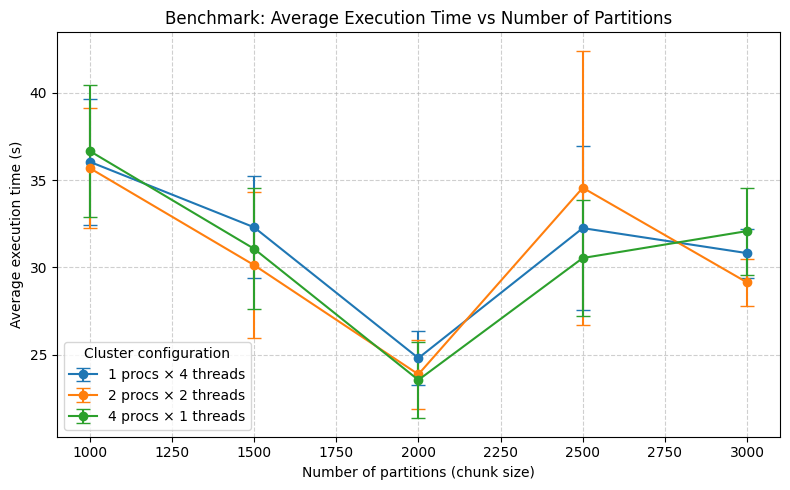

In [31]:
# Create figure
plt.figure(figsize=(8, 5))

for (nprocs, nthreads) in procs_threads:
    subset = (
        df_results[
            (df_results["nprocs"] == nprocs) &
            (df_results["nthreads"] == nthreads)
        ]
        .sort_values("chunk_size")
    )
    
    # Plot with error bars
    plt.errorbar(
        subset["chunk_size"],
        subset["mean_elapsed_s"],
        yerr=subset["std_elapsed_s"],
        marker="o",
        capsize=5,
        label=f"{nprocs} procs × {nthreads} threads"
    )
    
# Labels and style
plt.xlabel("Number of partitions (chunk size)")
plt.ylabel("Average execution time (s)")
plt.title("Benchmark: Average Execution Time vs Number of Partitions")
plt.legend(title="Cluster configuration")
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()

# Save plot to file
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
plot_filename = f"benchmark_plot_{timestamp}.png"
plt.savefig(plot_filename, dpi=300)

print(f"\n Plot saved as: {plot_filename}")

# Show plot
plt.show()


The plot shows the average execution time (in seconds) as a function of the number of partitions (chunk size) for different cluster configurations, defined by the number of processes and threads. A few observations can be made.

**1.** General trend:
As the chunk size increases from 1000 to around 2000, the average execution time decreases for all configurations, meaning that larger chunks initially improve performance by reducing communication and scheduling overhead.

**2.** Performance minimum:
The lowest execution time occurs around a chunk size of 2000, suggesting this is an optimal balance between computation and communication cost.

**3.** Instability for large chunks:
Beyond a chunk size of 2000 (especially at 2500), the execution time increases again, indicating possible inefficiencies.

**4.** Variability:
The longer error bars at certain chunk sizes (e.g., 1500 and 2500) show higher variability between runs, meaning that those configurations are less stable or more sensitive to system conditions.

**5.** Effect of process/thread configuration:
Unfortunately there is no strong evidence on which configuration of nprocs x nthreads is better, as indicated by high values of error bars.


In conclusion, regarding the chunk_size, a value of 2000 appears to provide the best efficiency in terms of execution time, between the tested ones. As for the combination of n_procs and n_threads, it is difficult to draw a definitive conclusion. We decided to use the **1 proc × 4 threads** configuration because, according to general theory, multithreaded execution should perform better for Dask array operations. However, due to the large error bars in our benchmark results, the data are not informative enough to clearly identify the optimal configuration.

## Final remarks

We successfully completed all assigned tasks, achieving good overall results.

During the development of the project, we also experimented with configurations using only 1 and 2 workers. As expected, the 1-worker configuration proved unsuitable and not scalable. Once the dataset size exceeded 10,000 files, the single-worker setup was unable to handle the workload and lost connection to the cluster, likely due to memory saturation. Surprisingly, even the 2-worker configuration was insufficient, failing to scale beyond 30,000 files. After acknowledging this limitation, we decided to use the 3-worker configuration for all subsequent benchmarks. The 3-worker setup scaled up to 100,000 files but began to fail—again due to memory saturation—at around 200,000 files. We did not conduct an in-depth analysis to determine the precise upper limit; this estimate is based on observed behavior.

Task 3.2 was the most computationally demanding. To address this, we adopted a smaller block configuration, which is common practice when working with large matrices that cannot fit entirely into memory—such as the cosine similarity matrix in our case.

We decided to call the compute() method at the end of Task 3.1 to retrieve the embeddings. However, if the embeddings are not required, we believe the algorithm from Task 3.2 could be adapted by converting the Dask DataFrame into a Dask Array without calling compute(), thereby avoiding storage of the full embedding matrix in memory.

As a final note, the benchmarks for the previous tasks could be made more robust by running each experiment multiple times and computing the average execution time. This approach was used for Task 3.2, which exhibited the highest variability in performance.